In [31]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

In [4]:
train_data = pd.read_csv("train.csv")
test_data = pd.read_csv("test.csv")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Missing data

In [5]:
print(train_data.shape)
print(test_data.shape)

(891, 12)
(418, 11)


як і було сказано в описі, в тестовому наборі нема колонки ground truth

In [6]:
train_data.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [7]:
test_data.isnull().sum()

PassengerId      0
Pclass           0
Name             0
Sex              0
Age             86
SibSp            0
Parch            0
Ticket           0
Fare             1
Cabin          327
Embarked         0
dtype: int64

в обох набор є відсутні дані про вік так каюту, в train_data додатково немає двох значень Embarked, а в test_data немає одного Fare

In [8]:
train_data.dtypes

PassengerId      int64
Survived         int64
Pclass           int64
Name            object
Sex             object
Age            float64
SibSp            int64
Parch            int64
Ticket          object
Fare           float64
Cabin           object
Embarked        object
dtype: object

типи відстуніх значень: float64, float64, obj, obj

In [12]:
train_data.sample(100)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
283,284,1,3,"Dorking, Mr. Edward Arthur",male,19.000000,0,0,A/5. 10482,8.0500,unknown,S
867,868,0,1,"Roebling, Mr. Washington Augustus II",male,31.000000,0,0,PC 17590,50.4958,A24,S
69,70,0,3,"Kink, Mr. Vincenz",male,26.000000,2,0,315151,8.6625,unknown,S
671,672,0,1,"Davidson, Mr. Thornton",male,31.000000,1,0,F.C. 12750,52.0000,B71,S
182,183,0,3,"Asplund, Master. Clarence Gustaf Hugo",male,9.000000,4,2,347077,31.3875,unknown,S
715,716,0,3,"Soholt, Mr. Peter Andreas Lauritz Andersen",male,19.000000,0,0,348124,7.6500,F G73,S
169,170,0,3,"Ling, Mr. Lee",male,28.000000,0,0,1601,56.4958,unknown,S
456,457,0,1,"Millet, Mr. Francis Davis",male,65.000000,0,0,13509,26.5500,E38,S
701,702,1,1,"Silverthorne, Mr. Spencer Victor",male,35.000000,0,0,PC 17475,26.2875,E24,S
369,370,1,1,"Aubart, Mme. Leontine Pauline",female,24.000000,0,0,PC 17477,69.3000,B35,C


незрозуміло навіщо для віку флоат, якщо там всюди 0 після крапки. змінимо цей тип на ціле число

In [14]:
train_data['Age'] = train_data['Age'].astype('int64')
test_data['Age'] = test_data['Age'].astype('int64')

заповнимо відстуні значення таким чином:
Age - середнє значення;
Cabin - нова колонка 'Cabin_unknown', яка містить значення 1, якщо оригінальна колонка містила пропущене значення, та 0 в іншому випадку. Це може допомогти моделі краще розрізняти записи з пропущеними значеннями в колонці 'Cabin'.;
Embarked - найпопулярніше;
Fare - медіана;

In [20]:
# Заповнення пропущених значень віку
train_data["Age"].fillna(train_data["Age"].mean(), inplace=True)
test_data["Age"].fillna(test_data["Age"].mean(), inplace=True)

# Заповнення пропущених значень кают
train_data['Cabin_unknown'] = np.where(train_data['Cabin'].isnull(), 1, 0)
train_data.drop('Cabin', axis=1, inplace=True)
test_data['Cabin_unknown'] = np.where(test_data['Cabin'].isnull(), 1, 0)
test_data.drop('Cabin', axis=1, inplace=True)

# Заповнення пропущених значень місця посадки
train_data["Embarked"].fillna(train_data["Embarked"].mode()[0], inplace=True)

# Заповнення пропущених значень вартості квитка
test_data["Fare"].fillna(test_data["Fare"].median(), inplace=True)

In [21]:
train_data.sample(20)

,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,Cabin_unknown
152,3,male,55,0,0,8.0500,S,0
620,3,male,27,1,0,14.4542,C,0
73,3,male,26,1,0,14.4542,C,0
192,3,female,19,1,0,7.8542,S,0
161,2,female,40,0,0,15.7500,S,0
730,1,female,29,0,0,211.3375,S,0
504,1,female,16,0,0,86.5000,S,0
327,2,female,36,0,0,13.0000,S,0
640,3,male,20,0,0,7.8542,S,0
719,3,male,33,0,0,7.7750,S,0


перед кодуванням змінних видалимо колонки, які не будемо використовувати далі

In [22]:
train_data.drop(['Name', 'Ticket', 'PassengerId', 'Survived'], axis=1, inplace=True)
test_data.drop(['Name', 'Ticket', 'PassengerId'], axis=1, inplace=True)

KeyError: "['Name', 'Ticket', 'PassengerId', 'Survived'] not found in axis"

In [24]:
train_data.dtypes

Pclass             int64
Sex               object
Age                int64
SibSp              int64
Parch              int64
Fare             float64
Embarked          object
Cabin_unknown      int32
dtype: object

закодуємо колонки Sex та Embarked для подальшої кластеризації

In [26]:
train_data = pd.get_dummies(train_data, columns=['Sex', 'Embarked'])
test_data = pd.get_dummies(test_data, columns=['Sex', 'Embarked'])

In [27]:
train_data.dtypes

Pclass             int64
Age                int64
SibSp              int64
Parch              int64
Fare             float64
Cabin_unknown      int32
Sex_female          bool
Sex_male            bool
Embarked_C          bool
Embarked_Q          bool
Embarked_S          bool
dtype: object

# Clustering

silhouette_score - це метрика оцінки якості кластеризації, яка використовується для вимірювання того, наскільки добре об'єкти в кластері подібні між собою, а наскільки вони відрізняються від об'єктів, які не належать до цього кластера. Значення silhouette_score належить до діапазону [-1, 1]. Значення, близькі до 1, вказують на добру кластеризацію, тоді як значення близькі до -1 вказують на негативну кластеризацію, тобто випадок, коли об'єкти, які мають бути в одному кластері, розташовані далеко від один одного. Значення, близькі до 0, означають, що об'єкти можуть бути в кластері, але не дуже подібні один до одного.

In [34]:
def cluster_data(data, algorithm, n_clusters=2, eps=0.1, min_s=2):
    if algorithm == 'KMeans':
        cluster_model = KMeans(n_clusters=n_clusters, random_state=37)
    elif algorithm == 'Agglomerative':
        cluster_model = AgglomerativeClustering(n_clusters=n_clusters)
    elif algorithm == 'DBSCAN':
        cluster_model = DBSCAN(eps=eps, min_samples=min_s)
    else:
        raise ValueError('Invalid algorithm specified')

    cluster_model.fit(data)
    labels = cluster_model.labels_
    score = silhouette_score(data, labels, metric='euclidean')

    if algorithm == 'KMeans' or algorithm == 'Agglomerative':
        print(f"Silhouette Score for {algorithm} algorithm with {n_clusters} clusters: {score:.3f}\n")
    elif algorithm == 'DBSCAN':
        print(f"Silhouette Score for {algorithm} algorithm with {eps} eps and {min_s} min samples: {score:.3f}\n")

    print("Clusters grouping data\n", data.groupby(cluster_model.labels_).mean())

    return labels

також перед кластеризацією зменшимо розмірність даних за допомогою Principal component analysis

In [32]:
pca = PCA(n_components=2)
train_pca = pca.fit_transform(train_data)

## K-means 

C:\Users\oxygen\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score for KMeans algorithm with 2 clusters: 0.791

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  2.391408  29.410501  0.514320  0.349642   22.411942            0.0  \
1  1.000000  31.660377  0.660377  0.886792  187.032858            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.334129  0.665871    0.165871    0.091885    0.742243  
1    0.641509  0.358491    0.547170    0.000000    0.452830  


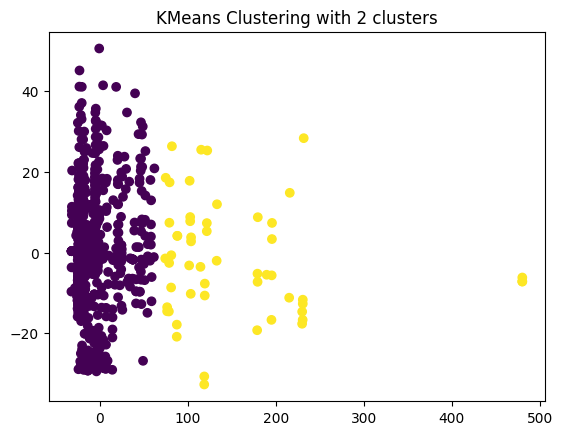

C:\Users\oxygen\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score for KMeans algorithm with 3 clusters: 0.662

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  2.551440  28.471879  0.429355  0.344307   15.453954            0.0  \
1  1.000000  30.950000  0.750000  1.050000  279.308545            0.0   
2  1.246479  34.852113  0.971831  0.478873   83.393280            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.311385  0.688615    0.145405    0.102881    0.751715  
1    0.600000  0.400000    0.600000    0.000000    0.400000  
2    0.528169  0.471831    0.352113    0.014085    0.633803  


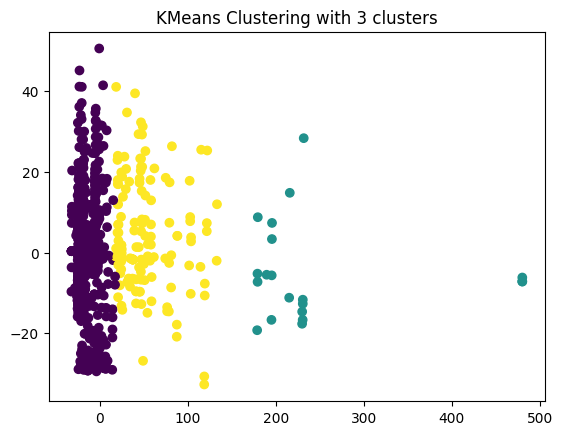

C:\Users\oxygen\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score for KMeans algorithm with 4 clusters: 0.648

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  2.557241  28.467586  0.430345  0.335172   15.273005            0.0  \
1  1.000000  30.750000  0.714286  1.107143  204.948064            0.0   
2  1.274074  34.948148  0.992593  0.481481   76.633240            0.0   
3  1.000000  35.333333  0.000000  0.333333  512.329200            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.308966  0.691034    0.143448    0.103448    0.753103  
1    0.714286  0.285714    0.392857    0.000000    0.607143  
2    0.511111  0.488889    0.370370    0.014815    0.614815  
3    0.333333  0.666667    1.000000    0.000000    0.000000  


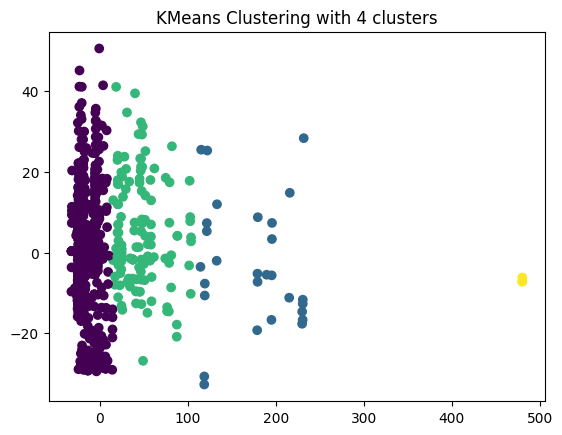

C:\Users\oxygen\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score for KMeans algorithm with 5 clusters: 0.615

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  1.412698  34.650794  1.174603  0.555556   65.597224            0.0  \
1  2.564607  28.483146  0.397472  0.313202   14.769603            0.0   
2  1.000000  30.176471  0.882353  1.176471  238.187253            0.0   
3  1.000000  32.090909  0.606061  0.787879  131.108200            0.0   
4  1.000000  35.333333  0.000000  0.333333  512.329200            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.476190  0.523810    0.309524    0.015873    0.674603  
1    0.308989  0.691011    0.140449    0.105337    0.754213  
2    0.647059  0.352941    0.529412    0.000000    0.470588  
3    0.666667  0.333333    0.515152    0.000000    0.484848  
4    0.333333  0.666667    1.000000    0.000000    0.000000  


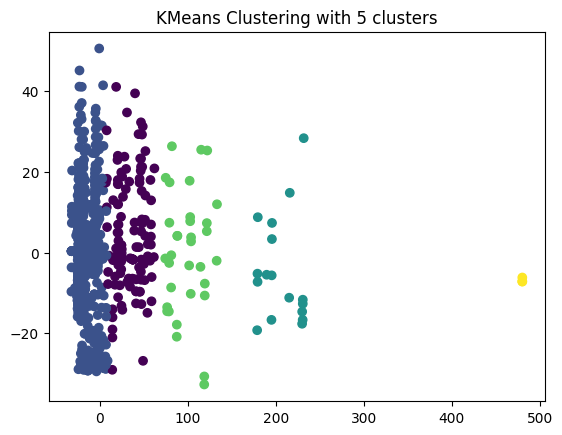

C:\Users\oxygen\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score for KMeans algorithm with 6 clusters: 0.447

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  2.090323  46.251613  0.232258  0.432258   20.422258            0.0  \
1  1.000000  30.176471  0.882353  1.176471  238.187253            0.0   
2  1.000000  32.090909  0.606061  0.787879  131.108200            0.0   
3  1.000000  35.333333  0.000000  0.333333  512.329200            0.0   
4  1.408333  33.858333  1.216667  0.533333   66.823612            0.0   
5  2.683837  23.825933  0.442274  0.287744   13.493649            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.270968  0.729032    0.129032    0.038710    0.832258  
1    0.647059  0.352941    0.529412    0.000000    0.470588  
2    0.666667  0.333333    0.515152    0.000000    0.484848  
3    0.333333  0.666667    1.000000    0.000000    0.000000  
4    0.483333  0.516667    0.300000    0.016667    0.683333  
5    0.319716  0.680284    0.1

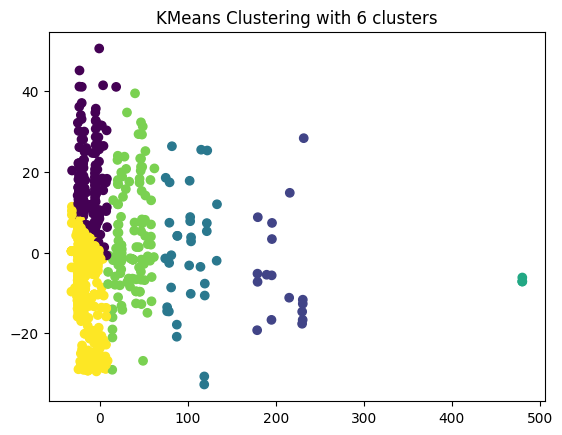

C:\Users\oxygen\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score for KMeans algorithm with 7 clusters: 0.475

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  2.795455  26.663636  0.181818  0.106818    9.526078            0.0  \
1  1.000000  35.333333  0.000000  0.333333  512.329200            0.0   
2  1.000000  32.090909  0.606061  0.787879  131.108200            0.0   
3  1.333333  35.261261  1.072072  0.432432   68.552028            0.0   
4  2.312925  16.217687  1.360544  0.897959   27.568793            0.0   
5  1.000000  30.176471  0.882353  1.176471  238.187253            0.0   
6  2.042857  47.257143  0.228571  0.471429   20.913185            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.270455  0.729545    0.140909    0.138636    0.720455  
1    0.333333  0.666667    1.000000    0.000000    0.000000  
2    0.666667  0.333333    0.515152    0.000000    0.484848  
3    0.495495  0.504505    0.297297    0.018018    0.684685  
4    0.448980  0.55

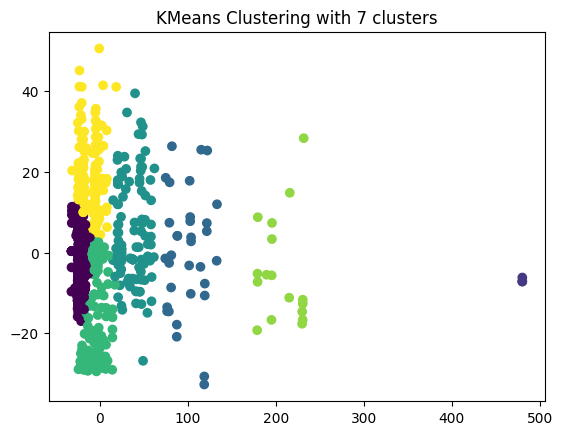

C:\Users\oxygen\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score for KMeans algorithm with 8 clusters: 0.490

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  2.794457  26.581986  0.163972  0.083141    9.274132            0.0  \
1  1.000000  30.176471  0.882353  1.176471  238.187253            0.0   
2  1.318182  35.136364  1.072727  0.400000   68.770683            0.0   
3  1.000000  32.090909  0.606061  0.787879  131.108200            0.0   
4  1.000000  35.333333  0.000000  0.333333  512.329200            0.0   
5  2.091837  51.336735  0.132653  0.234694   18.130103            0.0   
6  2.701299   6.467532  1.935065  1.337662   26.802488            0.0   
7  1.966667  31.183333  0.666667  0.725000   28.001597            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.267898  0.732102    0.138568    0.140878    0.720554  
1    0.647059  0.352941    0.529412    0.000000    0.470588  
2    0.500000  0.500000    0.309091    0.018182    0.672727  
3    0.6

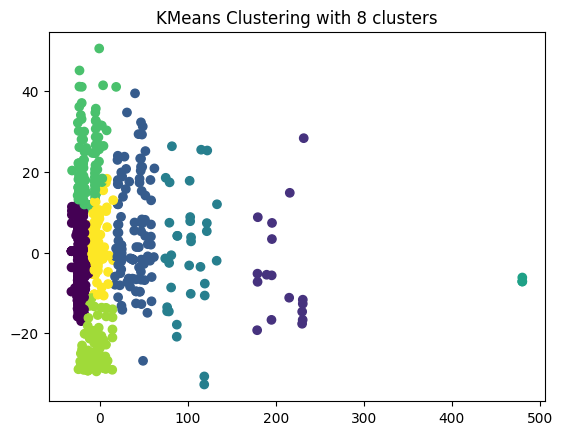

C:\Users\oxygen\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score for KMeans algorithm with 9 clusters: 0.478

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  2.017391  30.530435  0.678261  0.678261   26.808043            0.0  \
1  1.000000  30.176471  0.882353  1.176471  238.187253            0.0   
2  1.000000  35.333333  0.000000  0.333333  512.329200            0.0   
3  1.403509  35.912281  0.596491  0.508772   53.077268            0.0   
4  1.000000  32.090909  0.606061  0.787879  131.108200            0.0   
5  2.795775  26.455399  0.161972  0.077465    9.194961            0.0   
6  1.301587  35.190476  1.460317  0.460317   78.874405            0.0   
7  2.697368   6.342105  1.894737  1.328947   26.538047            0.0   
8  2.118812  50.683168  0.138614  0.227723   17.523227            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.400000  0.600000    0.217391    0.052174    0.730435  
1    0.647059  0.352941    0.529412    0.000000    0.470588

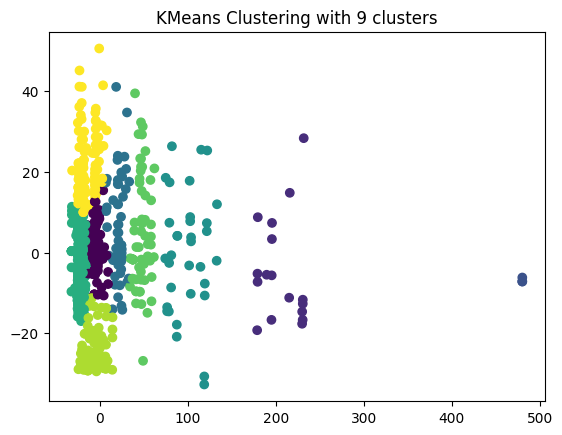

C:\Users\oxygen\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score for KMeans algorithm with 10 clusters: 0.419

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  2.008621  30.948276  0.663793  0.706897   26.859806            0.0  \
1  1.000000  30.176471  0.882353  1.176471  238.187253            0.0   
2  1.000000  35.333333  0.000000  0.333333  512.329200            0.0   
3  1.370370  35.555556  0.518519  0.481481   53.518520            0.0   
4  1.000000  32.090909  0.606061  0.787879  131.108200            0.0   
5  2.772414  31.306897  0.144828  0.065517    9.252627            0.0   
6  1.301587  35.190476  1.460317  0.460317   78.874405            0.0   
7  2.647059   6.352941  2.102941  1.411765   28.762806            0.0   
8  1.876712  54.301370  0.123288  0.205479   20.522433            0.0   
9  2.839080  19.793103  0.229885  0.149425    9.592601            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.405172  0.594828    0.215517    0.051724

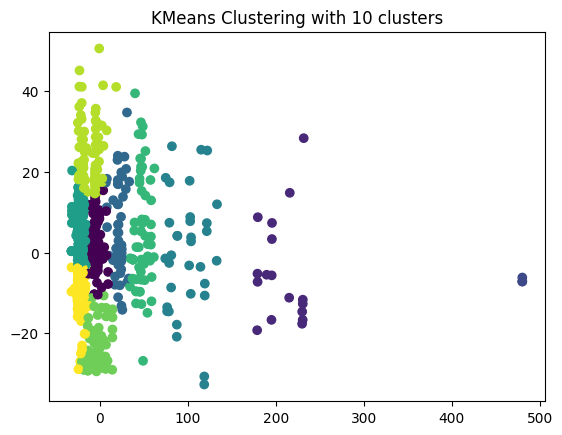

In [35]:
for n_clusters in range(2, 11):
    labels = cluster_data(train_data, algorithm='KMeans', n_clusters=n_clusters)
    plt.scatter(train_pca[:, 0], train_pca[:, 1], c=labels)
    plt.title(f"KMeans Clustering with {n_clusters} clusters")
    plt.show()

зі збільшенням кількості кластерів silhouette_score для K-means кластеризації стає меншим. Отже, найкращий результат при k=2

## Agglomerative

Silhouette Score for Agglomerative algorithm with 2 clusters: 0.847

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  2.338691  29.512055  0.517796  0.366246   26.530170            0.0  \
1  1.000000  30.950000  0.750000  1.050000  279.308545            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.346728  0.653272    0.179104    0.088404    0.732491  
1    0.600000  0.400000    0.600000    0.000000    0.400000  


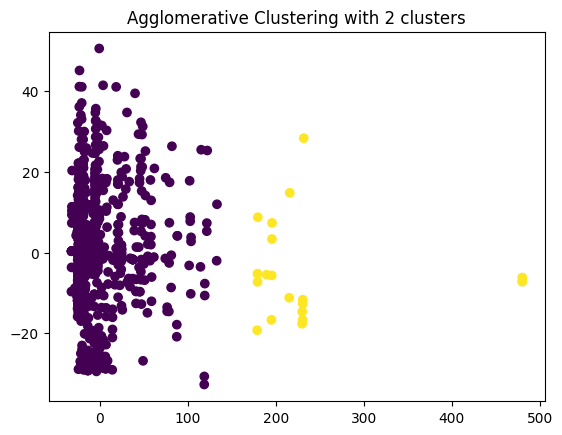

Silhouette Score for Agglomerative algorithm with 3 clusters: 0.669

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  1.000000  30.950000  0.750000  1.050000  279.308545            0.0  \
1  1.200000  36.321739  1.086957  0.608696   90.127065            0.0   
2  2.511905  28.476190  0.431217  0.329365   16.856040            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.600000  0.400000    0.600000    0.000000    0.400000  
1    0.565217  0.434783    0.408696    0.017391    0.573913  
2    0.313492  0.686508    0.144180    0.099206    0.756614  


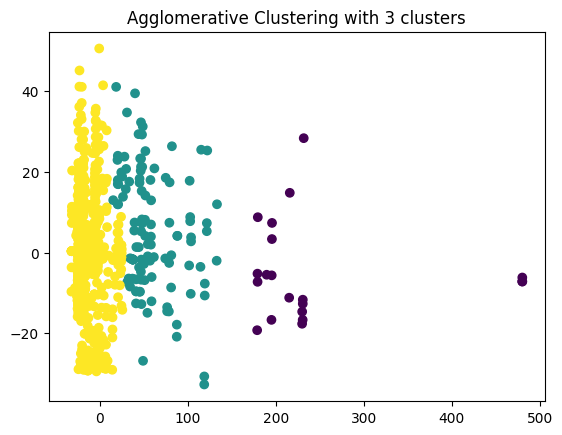

Silhouette Score for Agglomerative algorithm with 4 clusters: 0.672

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  1.200000  36.321739  1.086957  0.608696   90.127065            0.0  \
1  1.000000  30.176471  0.882353  1.176471  238.187253            0.0   
2  2.511905  28.476190  0.431217  0.329365   16.856040            0.0   
3  1.000000  35.333333  0.000000  0.333333  512.329200            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.565217  0.434783    0.408696    0.017391    0.573913  
1    0.647059  0.352941    0.529412    0.000000    0.470588  
2    0.313492  0.686508    0.144180    0.099206    0.756614  
3    0.333333  0.666667    1.000000    0.000000    0.000000  


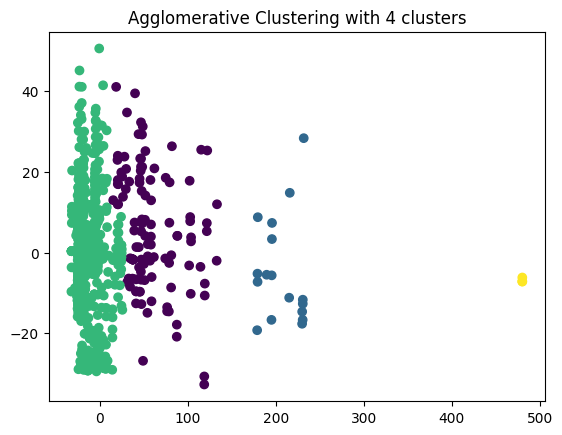

Silhouette Score for Agglomerative algorithm with 5 clusters: 0.613

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  2.511905  28.476190  0.431217  0.329365   16.856040            0.0  \
1  1.000000  32.090909  0.606061  0.787879  131.108200            0.0   
2  1.280488  38.024390  1.280488  0.536585   73.634657            0.0   
3  1.000000  35.333333  0.000000  0.333333  512.329200            0.0   
4  1.000000  30.176471  0.882353  1.176471  238.187253            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.313492  0.686508    0.144180    0.099206    0.756614  
1    0.666667  0.333333    0.515152    0.000000    0.484848  
2    0.524390  0.475610    0.365854    0.024390    0.609756  
3    0.333333  0.666667    1.000000    0.000000    0.000000  
4    0.647059  0.352941    0.529412    0.000000    0.470588  


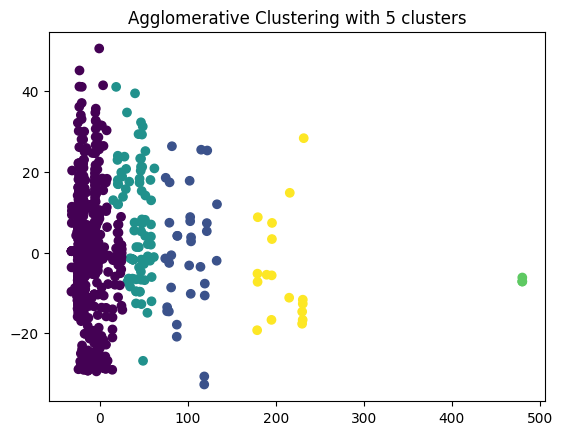

Silhouette Score for Agglomerative algorithm with 6 clusters: 0.418

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  2.708738  30.561165  0.155340  0.100971   10.290185            0.0  \
1  1.000000  32.090909  0.606061  0.787879  131.108200            0.0   
2  2.091286  24.020747  1.020747  0.817427   30.886808            0.0   
3  1.000000  35.333333  0.000000  0.333333  512.329200            0.0   
4  1.000000  30.176471  0.882353  1.176471  238.187253            0.0   
5  1.280488  38.024390  1.280488  0.536585   73.634657            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.260194  0.739806    0.128155    0.126214    0.745631  
1    0.666667  0.333333    0.515152    0.000000    0.484848  
2    0.427386  0.572614    0.178423    0.041494    0.780083  
3    0.333333  0.666667    1.000000    0.000000    0.000000  
4    0.647059  0.352941    0.529412    0.000000    0.470588  
5    0.524390  0.475610

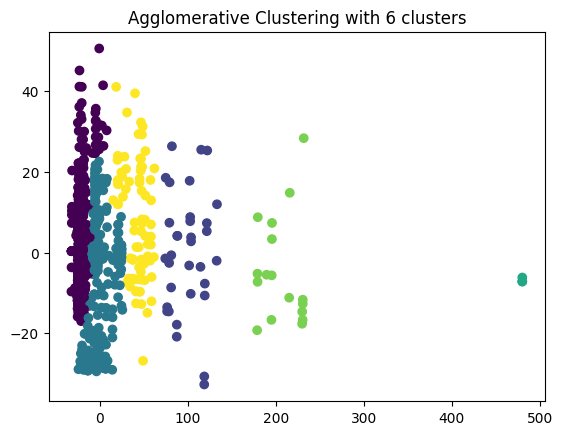

Silhouette Score for Agglomerative algorithm with 7 clusters: 0.425

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  2.091286  24.020747  1.020747  0.817427   30.886808            0.0  \
1  1.000000  32.090909  0.606061  0.787879  131.108200            0.0   
2  1.280488  38.024390  1.280488  0.536585   73.634657            0.0   
3  1.000000  35.333333  0.000000  0.333333  512.329200            0.0   
4  1.000000  30.176471  0.882353  1.176471  238.187253            0.0   
5  2.784722  26.629630  0.168981  0.104167    9.674082            0.0   
6  2.313253  51.024096  0.084337  0.084337   13.496888            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.427386  0.572614    0.178423    0.041494    0.780083  
1    0.666667  0.333333    0.515152    0.000000    0.484848  
2    0.524390  0.475610    0.365854    0.024390    0.609756  
3    0.333333  0.666667    1.000000    0.000000    0.000000  
4    0.64705

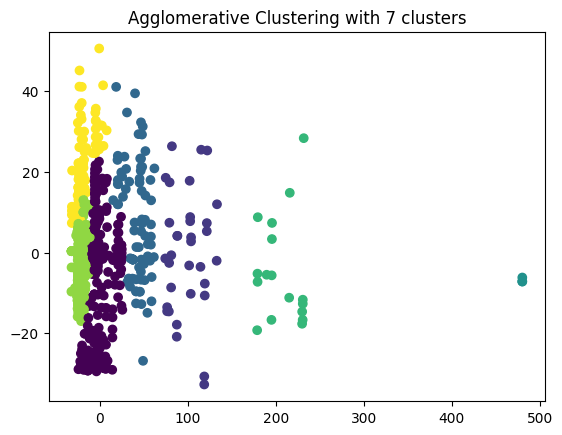

Silhouette Score for Agglomerative algorithm with 8 clusters: 0.463

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  1.843373  31.873494  0.734940  0.638554   33.593951            0.0  \
1  1.000000  32.090909  0.606061  0.787879  131.108200            0.0   
2  1.280488  38.024390  1.280488  0.536585   73.634657            0.0   
3  2.640000   6.640000  1.653333  1.213333   24.894999            0.0   
4  1.000000  30.176471  0.882353  1.176471  238.187253            0.0   
5  2.784722  26.629630  0.168981  0.104167    9.674082            0.0   
6  2.313253  51.024096  0.084337  0.084337   13.496888            0.0   
7  1.000000  35.333333  0.000000  0.333333  512.329200            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.379518  0.620482    0.192771    0.036145    0.771084  
1    0.666667  0.333333    0.515152    0.000000    0.484848  
2    0.524390  0.475610    0.365854    0.024390    0.609756  
3

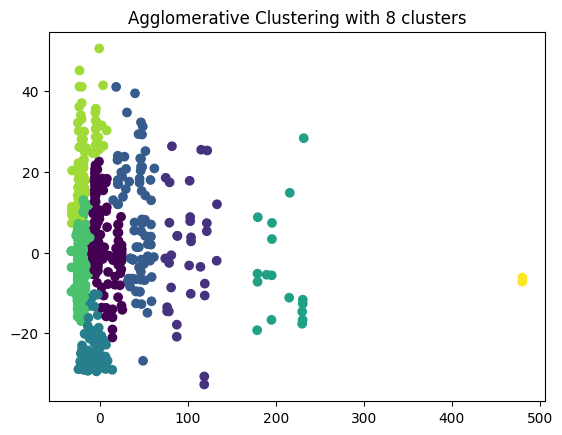

Silhouette Score for Agglomerative algorithm with 9 clusters: 0.463

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  1.280488  38.024390  1.280488  0.536585   73.634657            0.0  \
1  1.000000  32.090909  0.606061  0.787879  131.108200            0.0   
2  2.784722  26.629630  0.168981  0.104167    9.674082            0.0   
3  2.640000   6.640000  1.653333  1.213333   24.894999            0.0   
4  1.000000  30.176471  0.882353  1.176471  238.187253            0.0   
5  1.884298  34.256198  0.611570  0.652893   27.515083            0.0   
6  2.313253  51.024096  0.084337  0.084337   13.496888            0.0   
7  1.000000  35.333333  0.000000  0.333333  512.329200            0.0   
8  1.733333  25.466667  1.066667  0.600000   49.939351            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.524390  0.475610    0.365854    0.024390    0.609756  
1    0.666667  0.333333    0.515152    0.000000    0

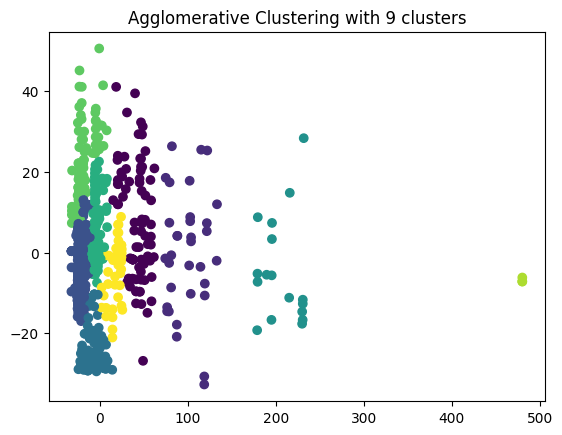

Silhouette Score for Agglomerative algorithm with 10 clusters: 0.473

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  2.784722  26.629630  0.168981  0.104167    9.674082            0.0  \
1  1.000000  32.090909  0.606061  0.787879  131.108200            0.0   
2  2.313253  51.024096  0.084337  0.084337   13.496888            0.0   
3  2.640000   6.640000  1.653333  1.213333   24.894999            0.0   
4  1.000000  30.176471  0.882353  1.176471  238.187253            0.0   
5  1.884298  34.256198  0.611570  0.652893   27.515083            0.0   
6  1.085714  52.028571  0.771429  0.514286   68.209414            0.0   
7  1.000000  35.333333  0.000000  0.333333  512.329200            0.0   
8  1.733333  25.466667  1.066667  0.600000   49.939351            0.0   
9  1.425532  27.595745  1.659574  0.553191   77.674732            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.280093  0.719907    0.136574    0

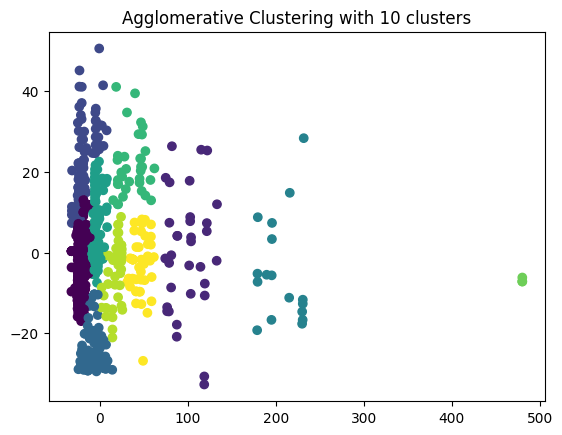

In [37]:
for n_clusters in range(2, 11):
    labels = cluster_data(train_data, algorithm='Agglomerative', n_clusters=n_clusters)
    plt.scatter(train_pca[:, 0], train_pca[:, 1], c=labels)
    plt.title(f"Agglomerative Clustering with {n_clusters} clusters")
    plt.show()

ситуація така ж, як і в K-means кластеризації. чим більше кластерів - тим менше silhouette_score

## DBSCAN

Silhouette Score for DBSCAN algorithm with 9 eps and 9 min samples: 0.769

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.590164  0.622951  0.852459  170.923223            0.0  \
 0  2.404819  29.173494  0.515663  0.346988   22.009196            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.590164  0.409836    0.540984    0.000000    0.459016  
 0    0.334940  0.665060    0.162651    0.092771    0.744578  


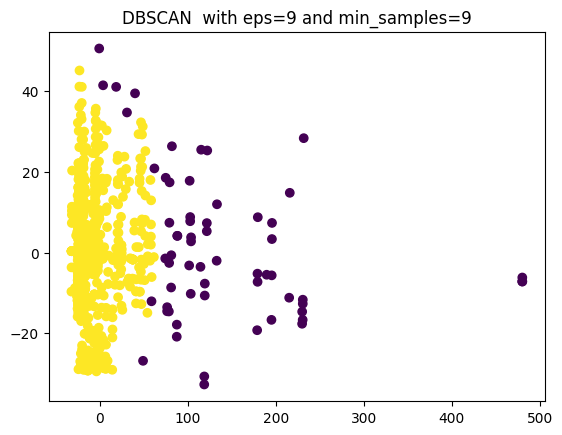

Silhouette Score for DBSCAN algorithm with 9 eps and 10 min samples: 0.769

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.590164  0.622951  0.852459  170.923223            0.0  \
 0  2.404819  29.173494  0.515663  0.346988   22.009196            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.590164  0.409836    0.540984    0.000000    0.459016  
 0    0.334940  0.665060    0.162651    0.092771    0.744578  


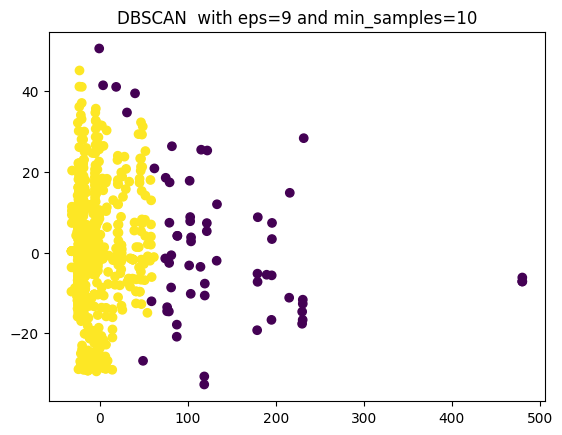

Silhouette Score for DBSCAN algorithm with 9 eps and 11 min samples: 0.763

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.031746  35.666667  0.619048  0.825397  166.857935            0.0  \
 0  2.405797  29.078502  0.515700  0.347826   21.958816            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.587302  0.412698    0.523810    0.000000    0.476190  
 0    0.334541  0.665459    0.163043    0.092995    0.743961  


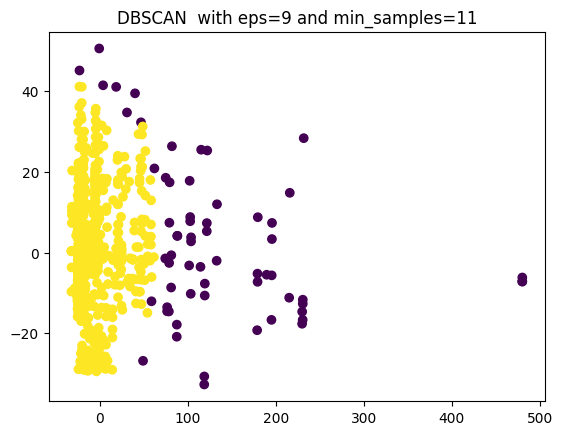

Silhouette Score for DBSCAN algorithm with 9 eps and 12 min samples: 0.539

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.031746  35.666667  0.619048  0.825397  166.857935            0.0  \
 0  2.487646  28.665800  0.439532  0.339402   17.637461            0.0   
 1  1.454545  28.431818  1.750000  0.522727   77.600377            0.0   
 2  1.000000  52.133333  0.800000  0.266667   80.285007            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.587302  0.412698    0.523810    0.000000    0.476190  
 0    0.315995  0.684005    0.146944    0.097529    0.755527  
 1    0.613636  0.386364    0.295455    0.022727    0.681818  
 2    0.466667  0.533333    0.600000    0.066667    0.333333  


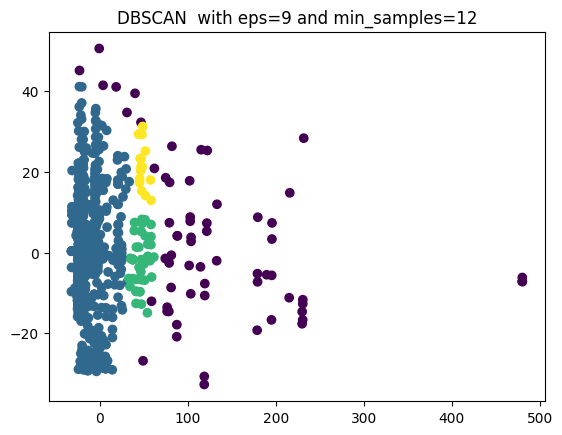

Silhouette Score for DBSCAN algorithm with 9 eps and 13 min samples: 0.539

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.050633  38.518987  0.708861  0.734177  148.901582            0.0  \
 0  2.486979  28.684896  0.433594  0.337240   17.599359            0.0   
 1  1.454545  28.431818  1.750000  0.522727   77.600377            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.556962  0.443038    0.531646    0.012658    0.455696  
 0    0.316406  0.683594    0.147135    0.097656    0.755208  
 1    0.613636  0.386364    0.295455    0.022727    0.681818  


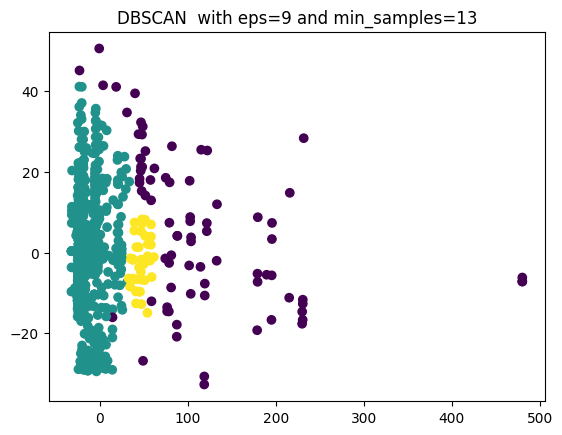

Silhouette Score for DBSCAN algorithm with 9 eps and 14 min samples: 0.536

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.086420  39.296296  0.691358  0.716049  145.450309            0.0  \
 0  2.486945  28.577023  0.434726  0.338120   17.621485            0.0   
 1  1.454545  28.431818  1.750000  0.522727   77.600377            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.543210  0.456790    0.518519    0.024691    0.456790  
 0    0.317232  0.682768    0.147520    0.096606    0.755875  
 1    0.613636  0.386364    0.295455    0.022727    0.681818  


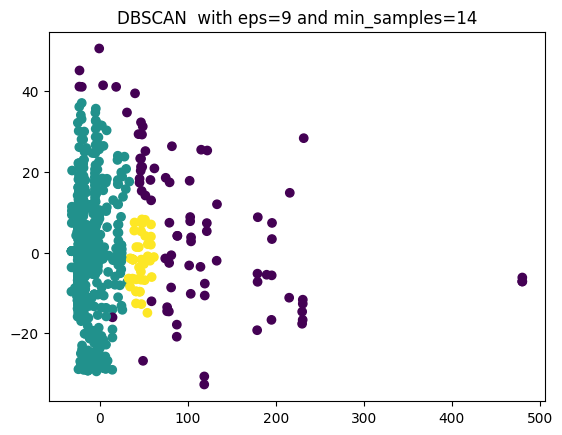

Silhouette Score for DBSCAN algorithm with 9 eps and 15 min samples: 0.526

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.132653  39.846939  0.744898  0.724490  130.663607            0.0  \
 0  2.506649  28.243351  0.421543  0.327128   16.948907            0.0   
 1  1.487805  28.780488  1.853659  0.560976   76.666766            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.520408  0.479592    0.469388    0.020408    0.510204  
 0    0.316489  0.683511    0.146277    0.098404    0.755319  
 1    0.609756  0.390244    0.292683    0.024390    0.682927  


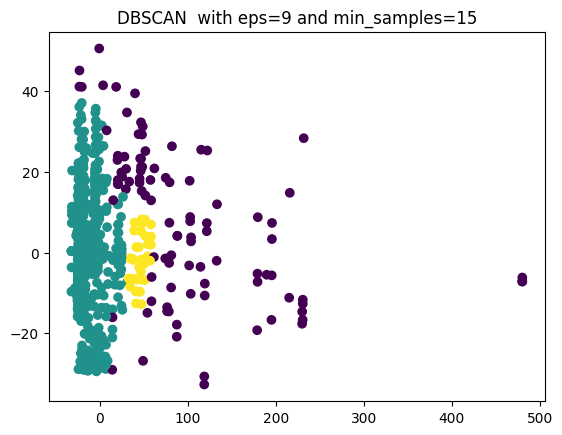

Silhouette Score for DBSCAN algorithm with 9 eps and 16 min samples: 0.416

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.149533  39.607477  0.785047  0.700935  125.835009            0.0  \
 0  2.560839  28.135664  0.413986  0.330070   15.093775            0.0   
 1  1.400000  29.714286  0.457143  0.228571   54.175117            0.0   
 2  1.588235  27.323529  2.058824  0.617647   74.747791            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.542056  0.457944    0.448598    0.028037    0.523364  
 0    0.311888  0.688112    0.144056    0.103497    0.752448  
 1    0.400000  0.600000    0.200000    0.000000    0.800000  
 2    0.558824  0.441176    0.294118    0.000000    0.705882  


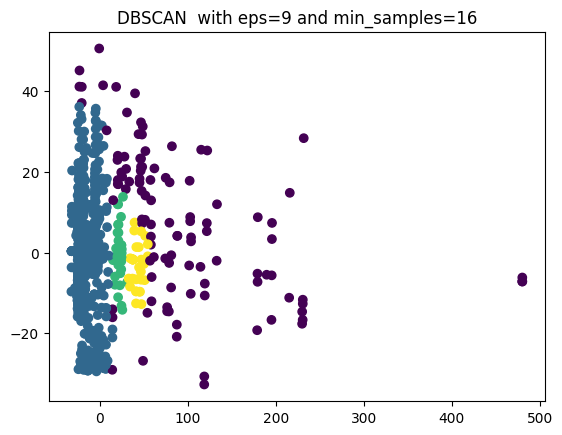

Silhouette Score for DBSCAN algorithm with 9 eps and 17 min samples: 0.408

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.140351  38.903509  0.763158  0.675439  123.227815            0.0  \
 0  2.560839  28.135664  0.413986  0.330070   15.093775            0.0   
 1  1.400000  29.714286  0.457143  0.228571   54.175117            0.0   
 2  1.740741  27.111111  2.481481  0.703704   72.511111            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.561404  0.438596    0.447368    0.026316    0.526316  
 0    0.311888  0.688112    0.144056    0.103497    0.752448  
 1    0.400000  0.600000    0.200000    0.000000    0.800000  
 2    0.481481  0.518519    0.259259    0.000000    0.740741  


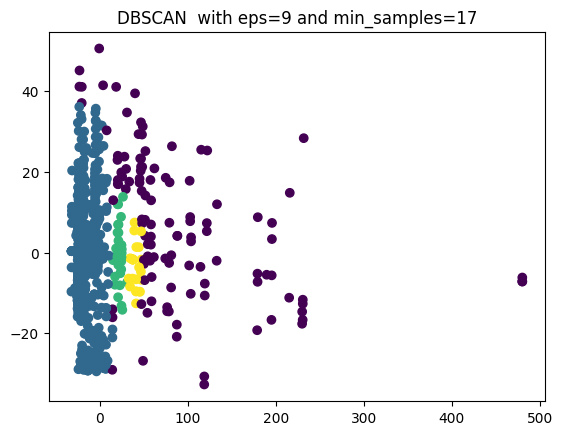

Silhouette Score for DBSCAN algorithm with 9 eps and 18 min samples: 0.404

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.255319  36.645390  1.092199  0.680851  113.516106            0.0  \
 0  2.560839  28.135664  0.413986  0.330070   15.093775            0.0   
 1  1.400000  29.714286  0.457143  0.228571   54.175117            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.546099  0.453901    0.411348    0.021277    0.567376  
 0    0.311888  0.688112    0.144056    0.103497    0.752448  
 1    0.400000  0.600000    0.200000    0.000000    0.800000  


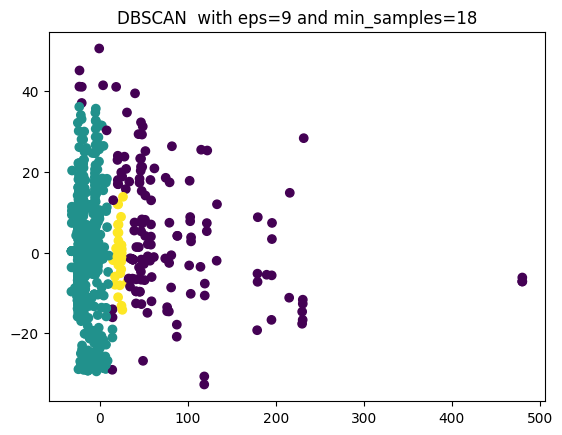

Silhouette Score for DBSCAN algorithm with 9 eps and 19 min samples: 0.404

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.255319  36.645390  1.092199  0.680851  113.516106            0.0  \
 0  2.560839  28.135664  0.413986  0.330070   15.093775            0.0   
 1  1.400000  29.714286  0.457143  0.228571   54.175117            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.546099  0.453901    0.411348    0.021277    0.567376  
 0    0.311888  0.688112    0.144056    0.103497    0.752448  
 1    0.400000  0.600000    0.200000    0.000000    0.800000  


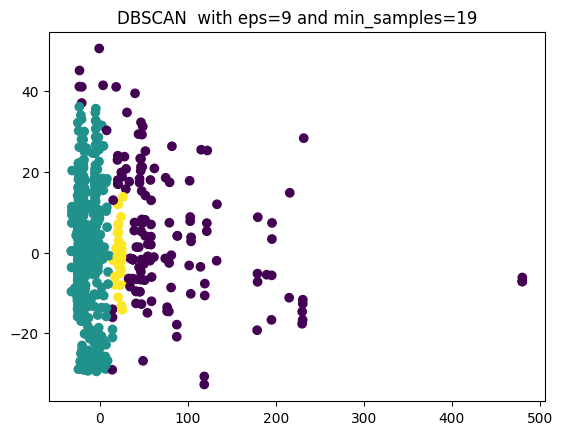

Silhouette Score for DBSCAN algorithm with 9 eps and 20 min samples: 0.404

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.279720  36.272727  1.146853  0.699301  112.584412            0.0  \
 0  2.559607  28.186536  0.401122  0.325386   15.004557            0.0   
 1  1.400000  29.714286  0.457143  0.228571   54.175117            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.538462  0.461538    0.405594    0.020979    0.573427  
 0    0.312763  0.687237    0.144460    0.103787    0.751753  
 1    0.400000  0.600000    0.200000    0.000000    0.800000  


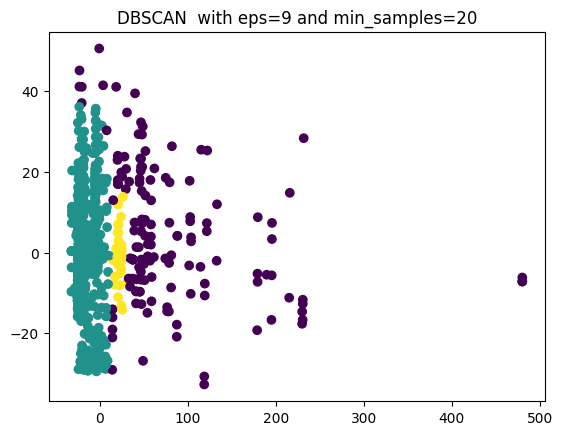

Silhouette Score for DBSCAN algorithm with 10 eps and 9 min samples: 0.771

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.850000  0.616667  0.866667  172.253957            0.0  \
 0  2.403129  29.161252  0.516245  0.346570   22.092313            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.583333  0.416667    0.533333    0.000000    0.466667  
 0    0.335740  0.664260    0.163658    0.092659    0.743682  


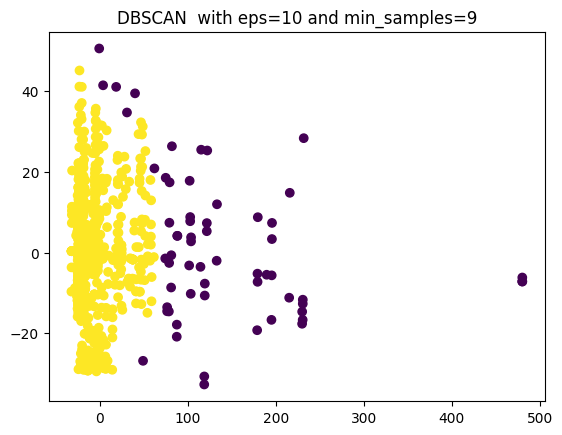

Silhouette Score for DBSCAN algorithm with 10 eps and 10 min samples: 0.771

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.850000  0.616667  0.866667  172.253957            0.0  \
 0  2.403129  29.161252  0.516245  0.346570   22.092313            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.583333  0.416667    0.533333    0.000000    0.466667  
 0    0.335740  0.664260    0.163658    0.092659    0.743682  


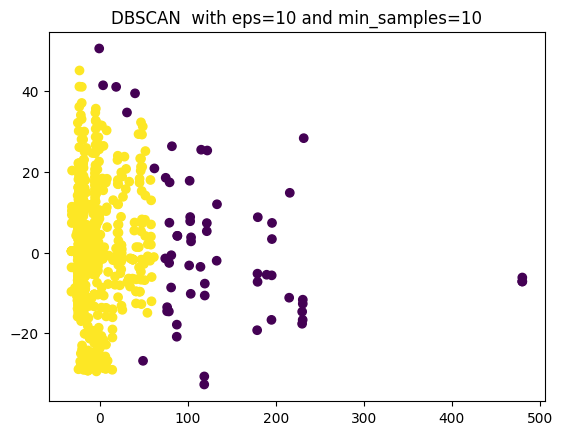

Silhouette Score for DBSCAN algorithm with 10 eps and 11 min samples: 0.771

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.850000  0.616667  0.866667  172.253957            0.0  \
 0  2.403129  29.161252  0.516245  0.346570   22.092313            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.583333  0.416667    0.533333    0.000000    0.466667  
 0    0.335740  0.664260    0.163658    0.092659    0.743682  


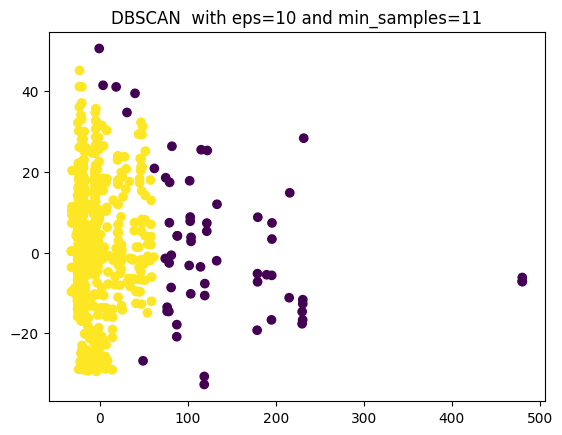

Silhouette Score for DBSCAN algorithm with 10 eps and 12 min samples: 0.771

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.850000  0.616667  0.866667  172.253957            0.0  \
 0  2.403129  29.161252  0.516245  0.346570   22.092313            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.583333  0.416667    0.533333    0.000000    0.466667  
 0    0.335740  0.664260    0.163658    0.092659    0.743682  


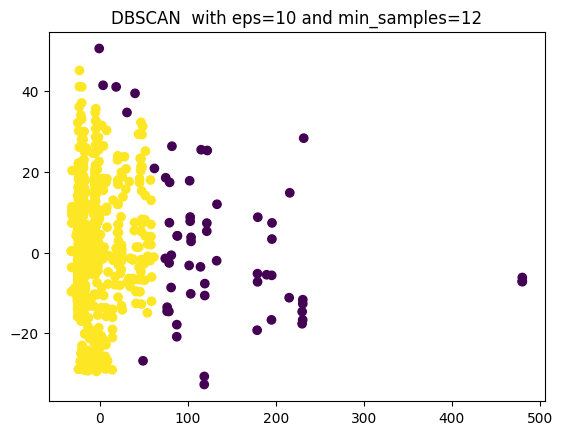

Silhouette Score for DBSCAN algorithm with 10 eps and 13 min samples: 0.498

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.032787  35.491803  0.606557  0.852459  169.557580            0.0  \
 0  2.414338  28.857837  0.516403  0.346294   21.627966            0.0   
 1  1.000000  58.428571  0.571429  0.428571   78.731543            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.573770  0.426230    0.524590     0.00000    0.475410  
 0    0.332928  0.667072    0.160389     0.09356    0.746051  
 1    0.714286  0.285714    0.571429     0.00000    0.428571  


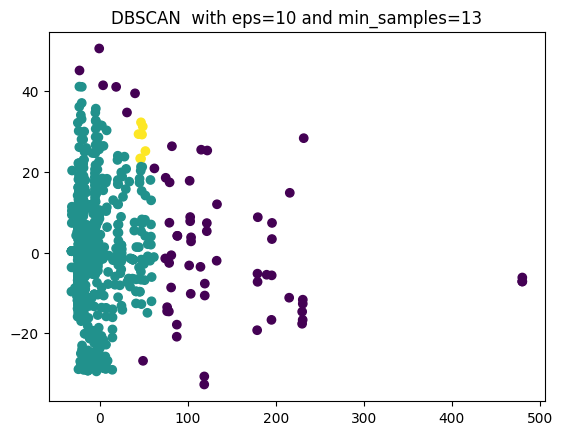

Silhouette Score for DBSCAN algorithm with 10 eps and 14 min samples: 0.742

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.027027  38.851351  0.635135  0.756757  153.683389            0.0  \
 0  2.424725  28.701346  0.512852  0.347613   21.201198            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.581081  0.418919    0.540541    0.000000    0.459459  
 0    0.331701  0.668299    0.156671    0.094247    0.749082  


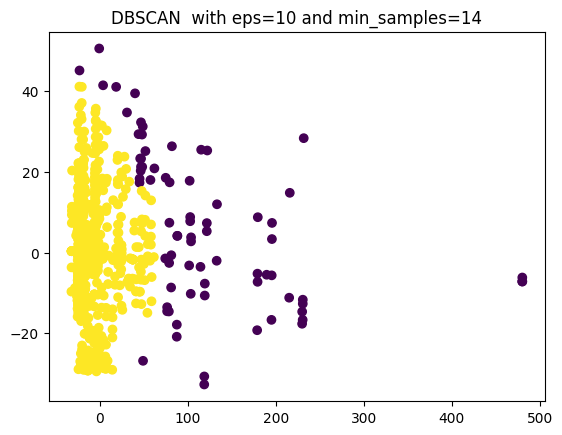

Silhouette Score for DBSCAN algorithm with 10 eps and 15 min samples: 0.731

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.075000  39.975000  0.637500  0.725000  146.356198            0.0  \
 0  2.430333  28.515413  0.511714  0.347719   20.943839            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.550000  0.450000    0.512500    0.025000    0.462500  
 0    0.332922  0.667078    0.156597    0.092478    0.750925  


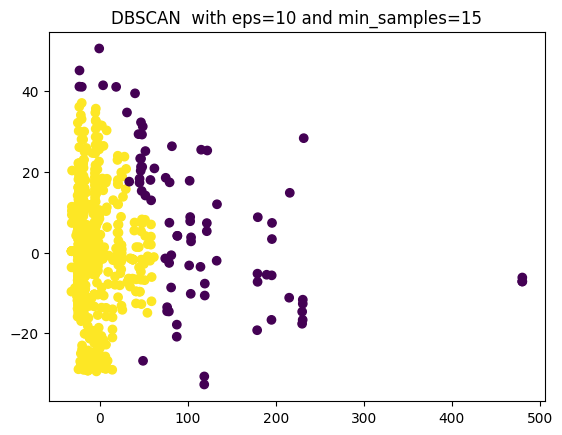

Silhouette Score for DBSCAN algorithm with 10 eps and 16 min samples: 0.721

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.071429  40.595238  0.642857  0.702381  142.054961            0.0  \
 0  2.437423  28.394052  0.510533  0.348203   20.769929            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.547619  0.452381    0.511905    0.023810    0.464286  
 0    0.332094  0.667906    0.154895    0.092937    0.752169  


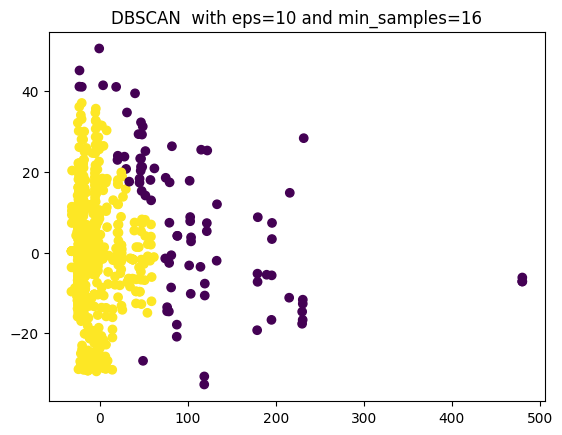

Silhouette Score for DBSCAN algorithm with 10 eps and 17 min samples: 0.716

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.068966  40.551724  0.655172  0.678161  139.500289            0.0  \
 0  2.442786  28.353234  0.508706  0.349502   20.593811            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1     0.54023   0.45977    0.517241    0.022989    0.459770  
 0     0.33209   0.66791    0.152985    0.093284    0.753731  


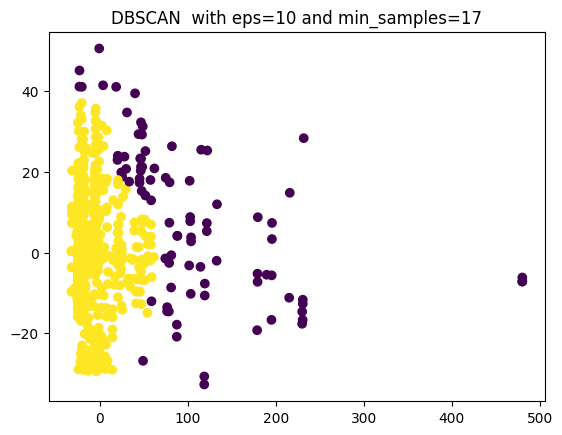

Silhouette Score for DBSCAN algorithm with 10 eps and 18 min samples: 0.711

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.086957  39.836957  0.695652  0.673913  136.267211            0.0  \
 0  2.449312  28.359199  0.503129  0.347935   20.221985            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.543478  0.456522    0.500000    0.021739    0.478261  
 0    0.330413  0.669587    0.152691    0.093867    0.753442  


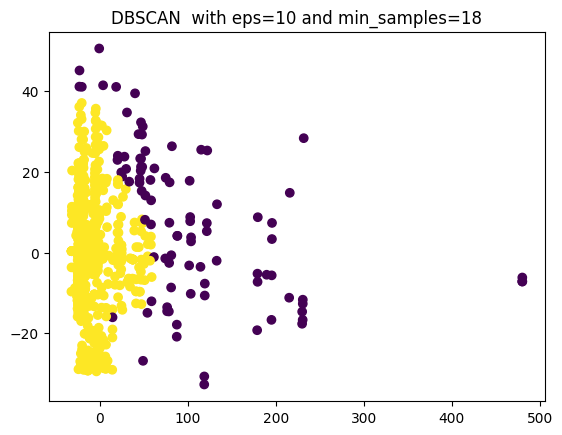

Silhouette Score for DBSCAN algorithm with 10 eps and 19 min samples: 0.524

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.086957  39.836957  0.695652  0.673913  136.267211            0.0  \
 0  2.496715  28.362681  0.432326  0.339028   17.382007            0.0   
 1  1.500000  28.289474  1.921053  0.526316   77.096271            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.543478  0.456522    0.500000    0.021739    0.478261  
 0    0.316689  0.683311    0.144547    0.097240    0.758213  
 1    0.605263  0.394737    0.315789    0.026316    0.657895  


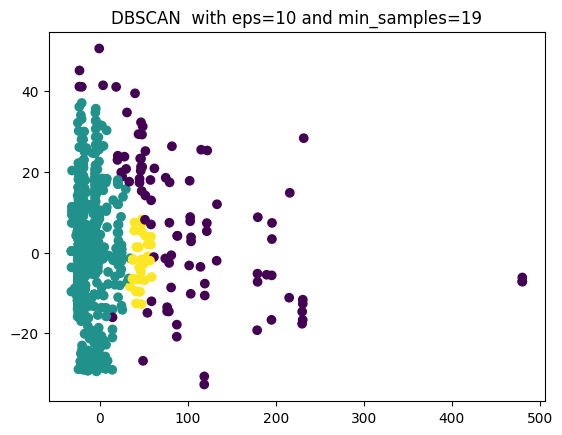

Silhouette Score for DBSCAN algorithm with 10 eps and 20 min samples: 0.524

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.083333  40.135417  0.697917  0.656250  132.857423            0.0  \
 0  2.504624  28.264201  0.430647  0.339498   17.186233            0.0   
 1  1.500000  28.289474  1.921053  0.526316   77.096271            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.531250  0.468750    0.479167    0.020833    0.500000  
 0    0.317041  0.682959    0.145310    0.097754    0.756935  
 1    0.605263  0.394737    0.315789    0.026316    0.657895  


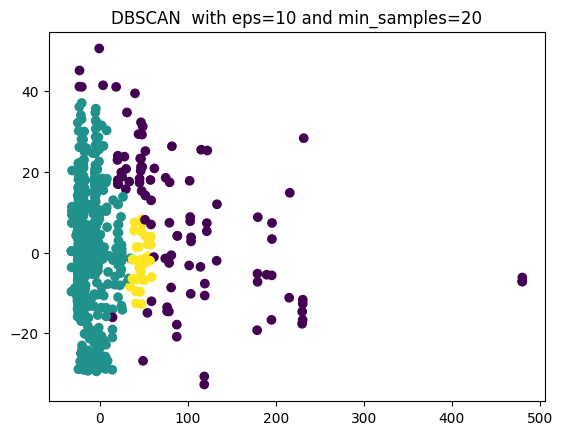

Silhouette Score for DBSCAN algorithm with 11 eps and 9 min samples: 0.774

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.237288  0.627119  0.881356  174.586156            0.0  \
 0  2.401442  29.211538  0.515625  0.346154   22.107411            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.593220  0.406780    0.525424    0.000000    0.474576  
 0    0.335337  0.664663    0.164663    0.092548    0.742788  


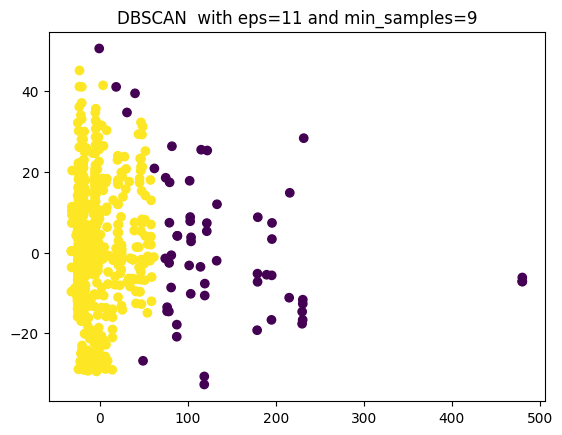

Silhouette Score for DBSCAN algorithm with 11 eps and 10 min samples: 0.774

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.237288  0.627119  0.881356  174.586156            0.0  \
 0  2.401442  29.211538  0.515625  0.346154   22.107411            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.593220  0.406780    0.525424    0.000000    0.474576  
 0    0.335337  0.664663    0.164663    0.092548    0.742788  


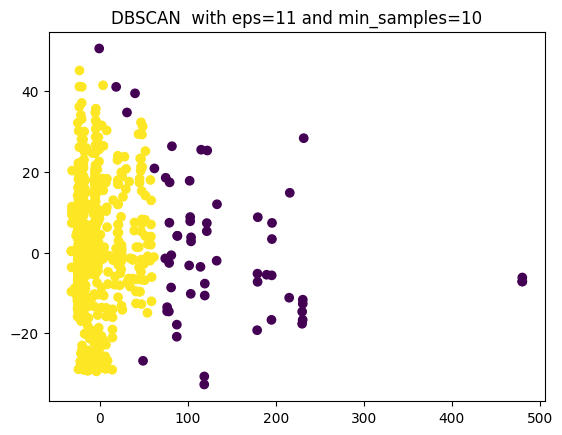

Silhouette Score for DBSCAN algorithm with 11 eps and 11 min samples: 0.774

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.237288  0.627119  0.881356  174.586156            0.0  \
 0  2.401442  29.211538  0.515625  0.346154   22.107411            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.593220  0.406780    0.525424    0.000000    0.474576  
 0    0.335337  0.664663    0.164663    0.092548    0.742788  


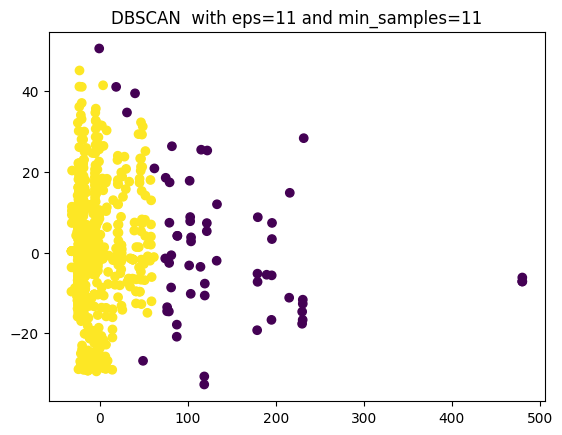

Silhouette Score for DBSCAN algorithm with 11 eps and 12 min samples: 0.774

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.237288  0.627119  0.881356  174.586156            0.0  \
 0  2.401442  29.211538  0.515625  0.346154   22.107411            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.593220  0.406780    0.525424    0.000000    0.474576  
 0    0.335337  0.664663    0.164663    0.092548    0.742788  


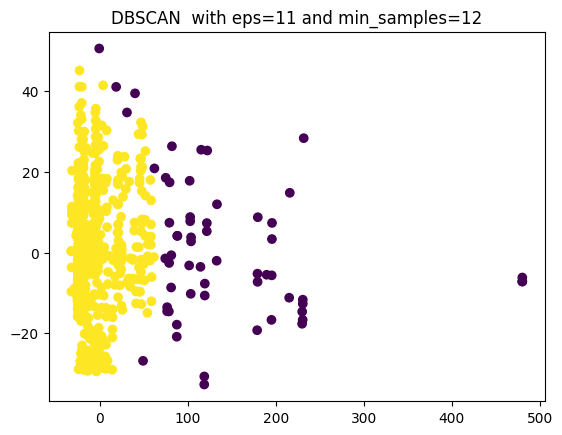

Silhouette Score for DBSCAN algorithm with 11 eps and 13 min samples: 0.774

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.237288  0.627119  0.881356  174.586156            0.0  \
 0  2.401442  29.211538  0.515625  0.346154   22.107411            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.593220  0.406780    0.525424    0.000000    0.474576  
 0    0.335337  0.664663    0.164663    0.092548    0.742788  


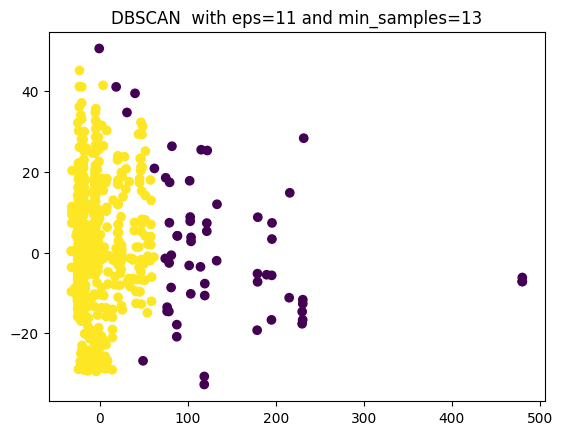

Silhouette Score for DBSCAN algorithm with 11 eps and 14 min samples: 0.770

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.033333  34.900000  0.616667  0.866667  171.805970            0.0  \
 0  2.400722  29.157641  0.516245  0.346570   22.124658            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.583333  0.416667    0.516667    0.000000    0.483333  
 0    0.335740  0.664260    0.164862    0.092659    0.742479  


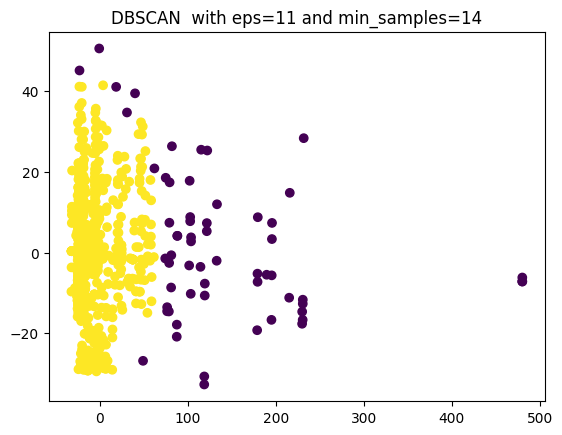

Silhouette Score for DBSCAN algorithm with 11 eps and 15 min samples: 0.762

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.031250  36.546875  0.625000  0.828125  165.949477            0.0  \
 0  2.407497  29.002418  0.515115  0.347037   21.853909            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.593750  0.406250    0.515625    0.000000    0.484375  
 0    0.333736  0.666264    0.163241    0.093108    0.743652  


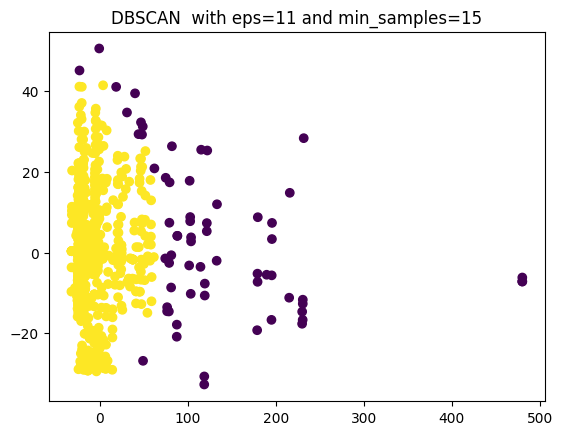

Silhouette Score for DBSCAN algorithm with 11 eps and 16 min samples: 0.758

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.030303  37.106061  0.606061  0.833333  163.351702            0.0  \
 0  2.410909  28.939394  0.516364  0.345455   21.712408            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.590909  0.409091    0.515152    0.000000    0.484848  
 0    0.333333  0.666667    0.162424    0.093333    0.744242  


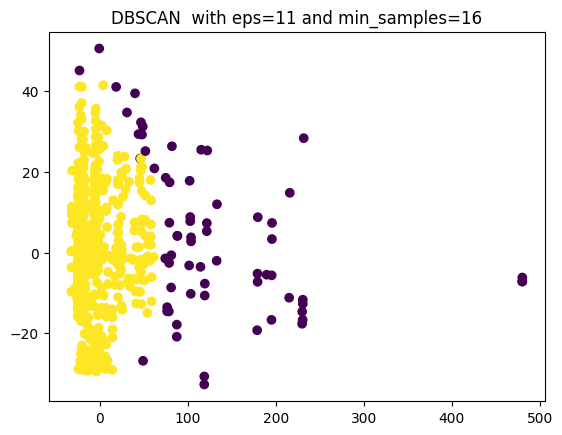

Silhouette Score for DBSCAN algorithm with 11 eps and 17 min samples: 0.742

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.067568  39.067568  0.635135  0.756757  152.604165            0.0  \
 0  2.421053  28.681763  0.512852  0.347613   21.298949            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.567568  0.432432    0.500000    0.027027    0.472973  
 0    0.332925  0.667075    0.160343    0.091799    0.747858  


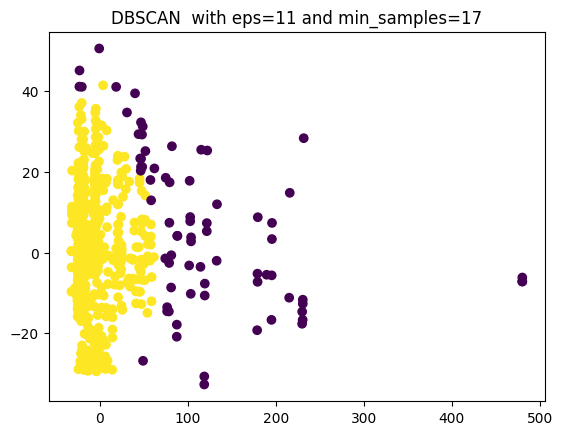

Silhouette Score for DBSCAN algorithm with 11 eps and 18 min samples: 0.727

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.075000  40.000000  0.650000  0.737500  145.731979            0.0  \
 0  2.430333  28.512947  0.510481  0.346486   21.005414            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.575000  0.425000     0.50000    0.025000    0.475000  
 0    0.330456  0.669544     0.15783    0.092478    0.749692  


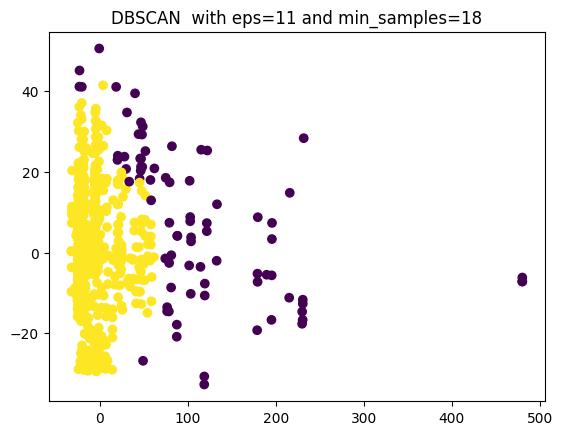

Silhouette Score for DBSCAN algorithm with 11 eps and 19 min samples: 0.722

Clusters grouping data
       Pclass        Age     SibSp     Parch       Fare  Cabin_unknown   
-1  1.073171  40.500000  0.646341  0.719512  143.28186            0.0  \
 0  2.433869  28.433869  0.510507  0.347342   20.94541            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.560976  0.439024    0.500000    0.024390    0.475610  
 0    0.331273  0.668727    0.156984    0.092707    0.750309  


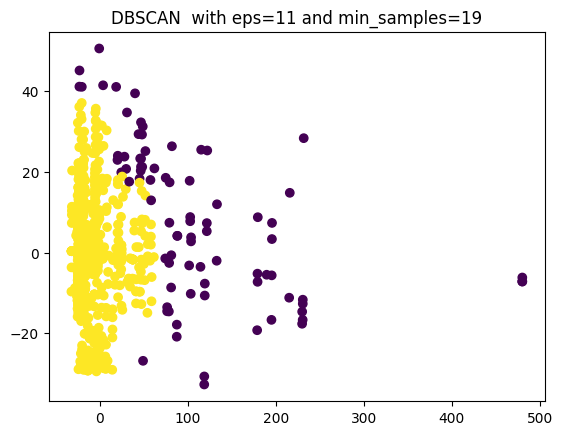

Silhouette Score for DBSCAN algorithm with 11 eps and 20 min samples: 0.719

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.070588  40.705882  0.647059  0.694118  141.041373            0.0  \
 0  2.439206  28.367246  0.509926  0.348635   20.726343            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.541176  0.458824    0.505882    0.023529    0.470588  
 0    0.332506  0.667494    0.155087    0.093052    0.751861  


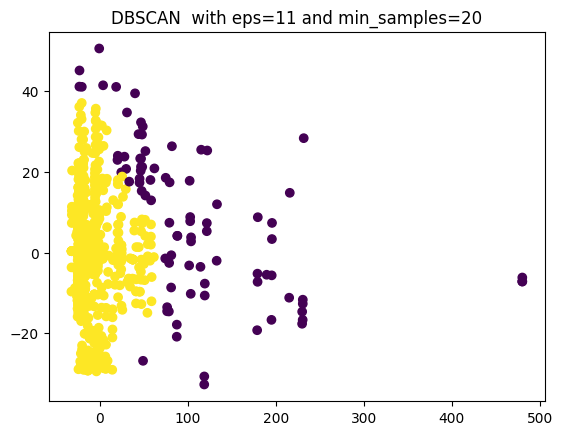

Silhouette Score for DBSCAN algorithm with 12 eps and 9 min samples: 0.782

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.732143  0.625000  0.875000  179.894714            0.0  \
 0  2.396407  29.330539  0.516168  0.348503   22.299216            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.607143  0.392857    0.535714    0.000000    0.464286  
 0    0.335329  0.664671    0.165269    0.092216    0.742515  


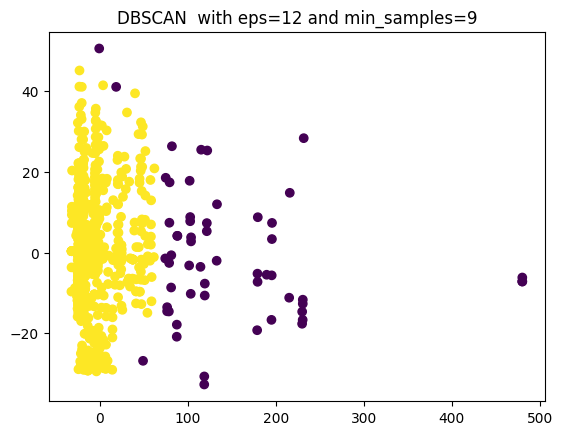

Silhouette Score for DBSCAN algorithm with 12 eps and 10 min samples: 0.782

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.732143  0.625000  0.875000  179.894714            0.0  \
 0  2.396407  29.330539  0.516168  0.348503   22.299216            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.607143  0.392857    0.535714    0.000000    0.464286  
 0    0.335329  0.664671    0.165269    0.092216    0.742515  


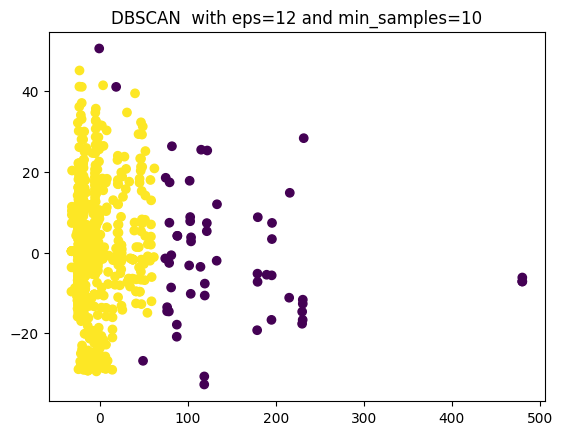

Silhouette Score for DBSCAN algorithm with 12 eps and 11 min samples: 0.782

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.732143  0.625000  0.875000  179.894714            0.0  \
 0  2.396407  29.330539  0.516168  0.348503   22.299216            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.607143  0.392857    0.535714    0.000000    0.464286  
 0    0.335329  0.664671    0.165269    0.092216    0.742515  


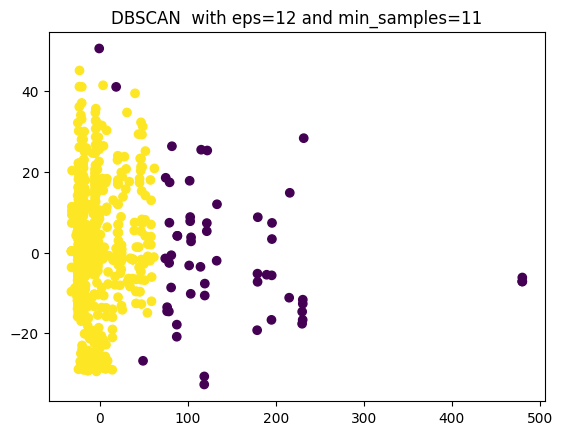

Silhouette Score for DBSCAN algorithm with 12 eps and 12 min samples: 0.782

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.732143  0.625000  0.875000  179.894714            0.0  \
 0  2.396407  29.330539  0.516168  0.348503   22.299216            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.607143  0.392857    0.535714    0.000000    0.464286  
 0    0.335329  0.664671    0.165269    0.092216    0.742515  


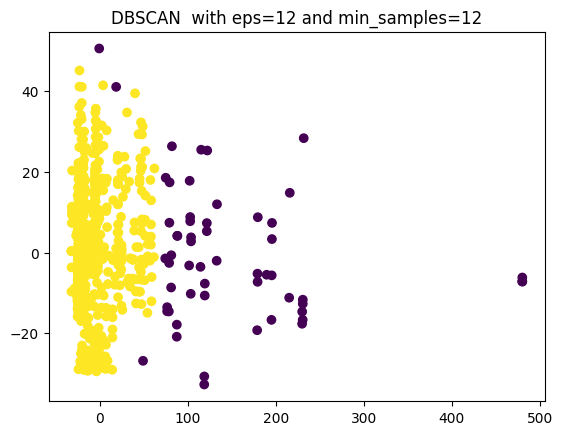

Silhouette Score for DBSCAN algorithm with 12 eps and 13 min samples: 0.779

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  33.385965  0.631579  0.877193  177.984281            0.0  \
 0  2.398082  29.281775  0.515588  0.347722   22.240822            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.596491  0.403509    0.526316    0.000000    0.473684  
 0    0.335731  0.664269    0.165468    0.092326    0.742206  


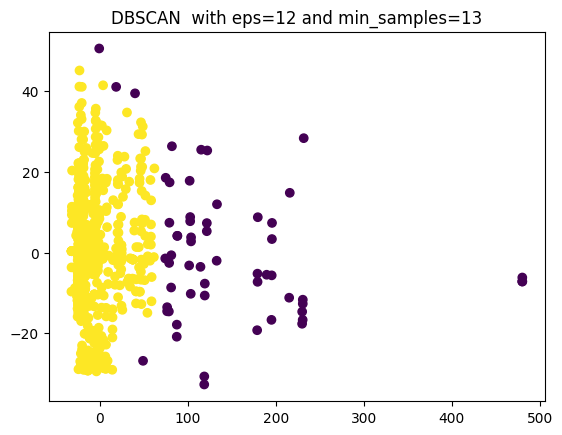

Silhouette Score for DBSCAN algorithm with 12 eps and 14 min samples: 0.776

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  33.931034  0.620690  0.879310  175.984193            0.0  \
 0  2.39976  29.238896  0.516206  0.346939   22.193117            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.534483    0.000000    0.465517  
 0    0.336134  0.663866    0.164466    0.092437    0.743097  


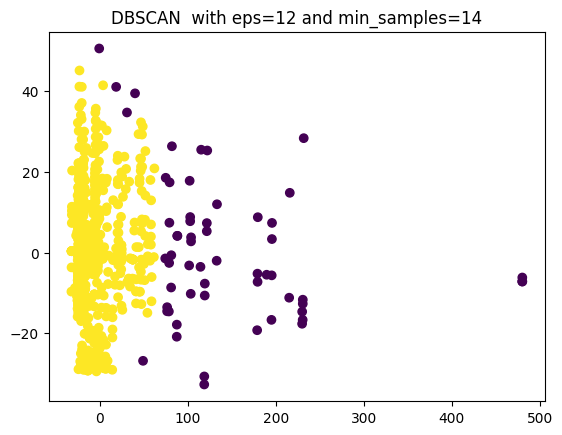

Silhouette Score for DBSCAN algorithm with 12 eps and 15 min samples: 0.776

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  33.931034  0.620690  0.879310  175.984193            0.0  \
 0  2.39976  29.238896  0.516206  0.346939   22.193117            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.534483    0.000000    0.465517  
 0    0.336134  0.663866    0.164466    0.092437    0.743097  


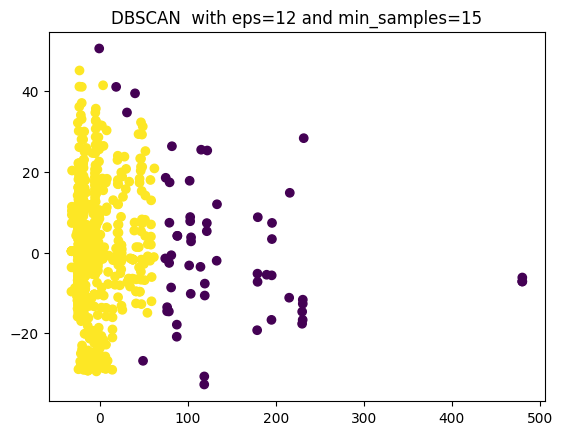

Silhouette Score for DBSCAN algorithm with 12 eps and 16 min samples: 0.776

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  33.931034  0.620690  0.879310  175.984193            0.0  \
 0  2.39976  29.238896  0.516206  0.346939   22.193117            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.534483    0.000000    0.465517  
 0    0.336134  0.663866    0.164466    0.092437    0.743097  


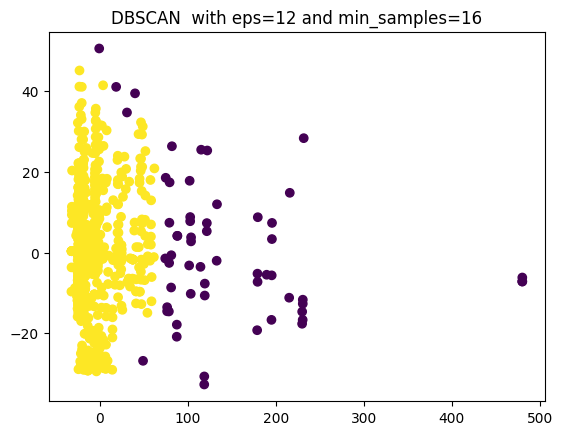

Silhouette Score for DBSCAN algorithm with 12 eps and 17 min samples: 0.765

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  35.952381  0.634921  0.841270  168.460183            0.0  \
 0  2.408213  29.056763  0.514493  0.346618   21.836906            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.603175  0.396825    0.523810    0.000000    0.476190  
 0    0.333333  0.666667    0.163043    0.092995    0.743961  


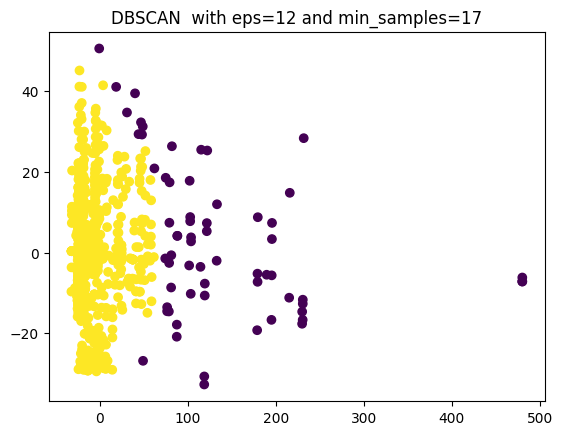

Silhouette Score for DBSCAN algorithm with 12 eps and 18 min samples: 0.762

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.031250  36.546875  0.625000  0.828125  165.949477            0.0  \
 0  2.407497  29.002418  0.515115  0.347037   21.853909            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.593750  0.406250    0.515625    0.000000    0.484375  
 0    0.333736  0.666264    0.163241    0.093108    0.743652  


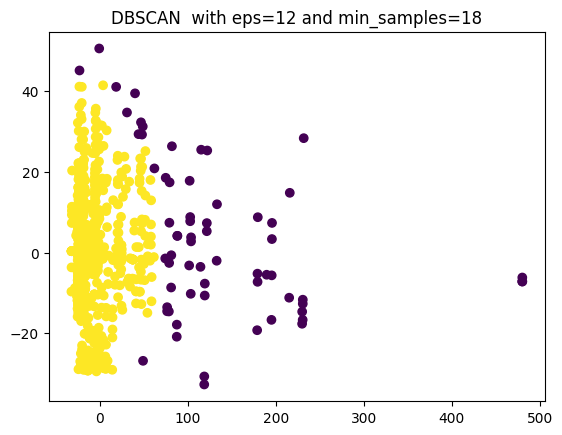

Silhouette Score for DBSCAN algorithm with 12 eps and 19 min samples: 0.750

Clusters grouping data
       Pclass        Age     SibSp    Parch        Fare  Cabin_unknown   
-1  1.028571  37.971429  0.628571  0.80000  158.505057            0.0  \
 0  2.417783  28.825822  0.514007  0.34592   21.435561            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.514286    0.000000    0.485714  
 0    0.331303  0.668697    0.160780    0.093788    0.745432  


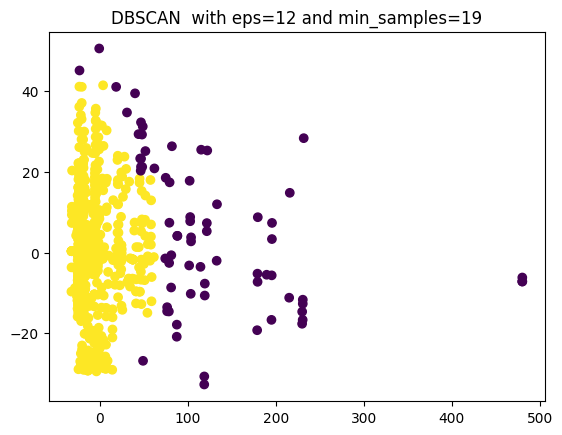

Silhouette Score for DBSCAN algorithm with 12 eps and 20 min samples: 0.739

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.040541  38.716216  0.621622  0.797297  153.148591            0.0  \
 0  2.423501  28.713586  0.514076  0.343941   21.249637            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.594595  0.405405    0.513514    0.000000    0.486486  
 0    0.330477  0.669523    0.159119    0.094247    0.746634  


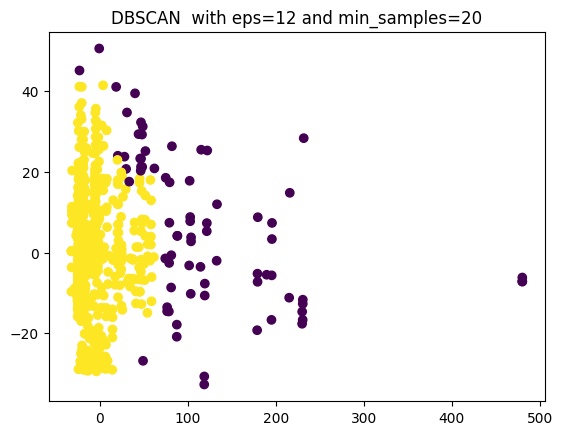

Silhouette Score for DBSCAN algorithm with 13 eps and 9 min samples: 0.601

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.822222  0.622222  0.933333  198.237313            0.0  \
 0  2.394737  29.391148  0.515550  0.348086   22.308427            0.0   
 1  1.000000  27.600000  0.700000  0.700000  112.342490            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.488889    0.000000    0.511111  
 0    0.334928  0.665072    0.165072    0.092105    0.742823  
 1    0.700000  0.300000    0.800000    0.000000    0.200000  


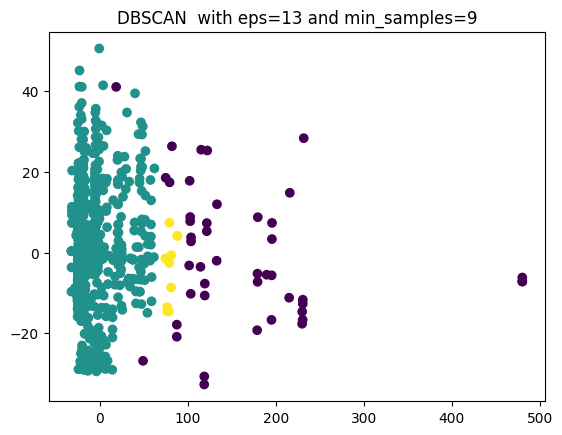

Silhouette Score for DBSCAN algorithm with 13 eps and 10 min samples: 0.599

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  33.847826  0.608696  0.913043  194.579980            0.0  \
 0  2.396407  29.330539  0.516168  0.348503   22.299216            0.0   
 1  1.000000  27.600000  0.700000  0.700000  112.342490            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586957  0.413043    0.478261    0.000000    0.521739  
 0    0.335329  0.664671    0.165269    0.092216    0.742515  
 1    0.700000  0.300000    0.800000    0.000000    0.200000  


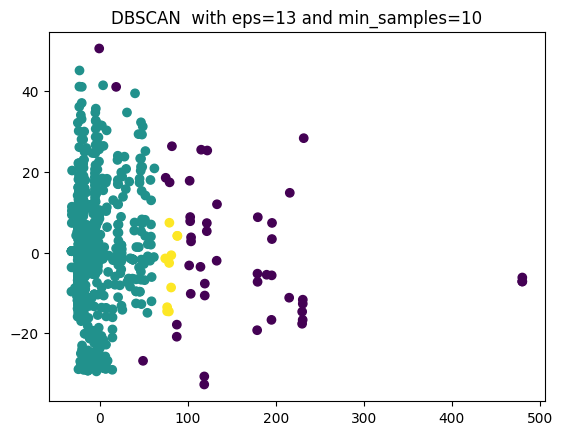

Silhouette Score for DBSCAN algorithm with 13 eps and 11 min samples: 0.782

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.732143  0.625000  0.875000  179.894714            0.0  \
 0  2.396407  29.330539  0.516168  0.348503   22.299216            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.607143  0.392857    0.535714    0.000000    0.464286  
 0    0.335329  0.664671    0.165269    0.092216    0.742515  


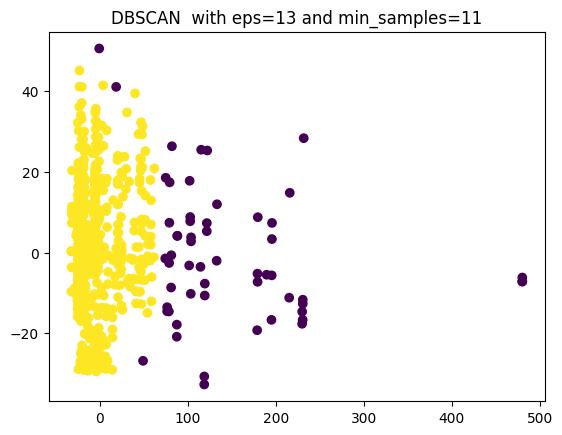

Silhouette Score for DBSCAN algorithm with 13 eps and 12 min samples: 0.782

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.732143  0.625000  0.875000  179.894714            0.0  \
 0  2.396407  29.330539  0.516168  0.348503   22.299216            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.607143  0.392857    0.535714    0.000000    0.464286  
 0    0.335329  0.664671    0.165269    0.092216    0.742515  


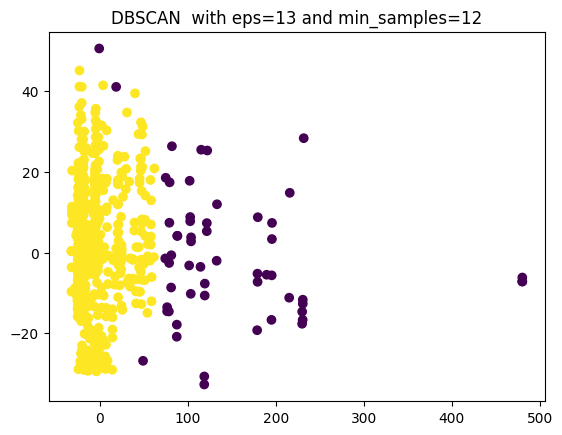

Silhouette Score for DBSCAN algorithm with 13 eps and 13 min samples: 0.782

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.732143  0.625000  0.875000  179.894714            0.0  \
 0  2.396407  29.330539  0.516168  0.348503   22.299216            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.607143  0.392857    0.535714    0.000000    0.464286  
 0    0.335329  0.664671    0.165269    0.092216    0.742515  


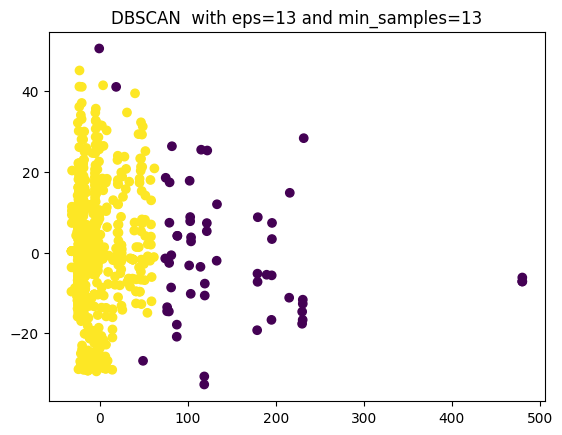

Silhouette Score for DBSCAN algorithm with 13 eps and 14 min samples: 0.776

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  33.931034  0.620690  0.879310  175.984193            0.0  \
 0  2.39976  29.238896  0.516206  0.346939   22.193117            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.534483    0.000000    0.465517  
 0    0.336134  0.663866    0.164466    0.092437    0.743097  


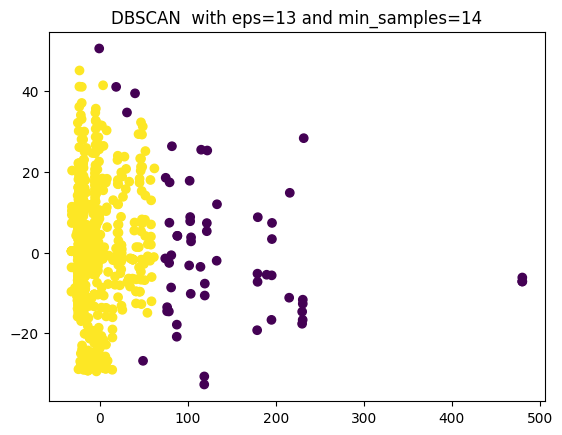

Silhouette Score for DBSCAN algorithm with 13 eps and 15 min samples: 0.776

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  33.931034  0.620690  0.879310  175.984193            0.0  \
 0  2.39976  29.238896  0.516206  0.346939   22.193117            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.534483    0.000000    0.465517  
 0    0.336134  0.663866    0.164466    0.092437    0.743097  


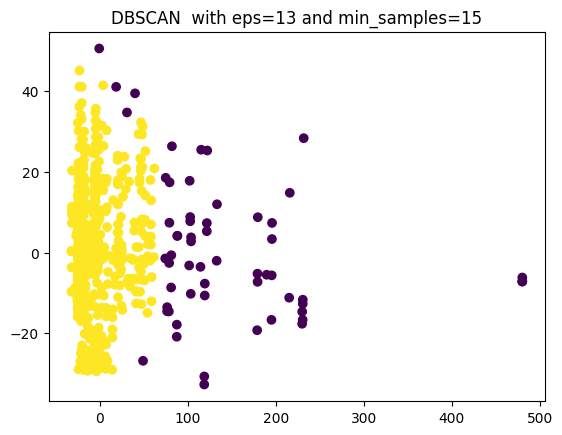

Silhouette Score for DBSCAN algorithm with 13 eps and 16 min samples: 0.776

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  33.931034  0.620690  0.879310  175.984193            0.0  \
 0  2.39976  29.238896  0.516206  0.346939   22.193117            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.534483    0.000000    0.465517  
 0    0.336134  0.663866    0.164466    0.092437    0.743097  


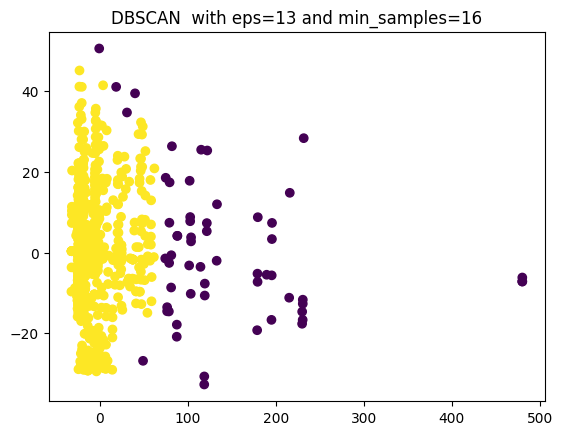

Silhouette Score for DBSCAN algorithm with 13 eps and 17 min samples: 0.771

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.883333  0.616667  0.850000  172.750692            0.0  \
 0  2.403129  29.158845  0.516245  0.347774   22.056447            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.516667    0.000000    0.483333  
 0    0.334537  0.665463    0.164862    0.092659    0.742479  


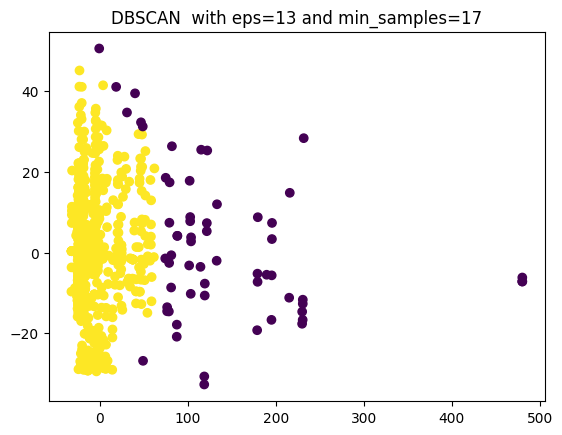

Silhouette Score for DBSCAN algorithm with 13 eps and 18 min samples: 0.771

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.883333  0.616667  0.850000  172.750692            0.0  \
 0  2.403129  29.158845  0.516245  0.347774   22.056447            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.516667    0.000000    0.483333  
 0    0.334537  0.665463    0.164862    0.092659    0.742479  


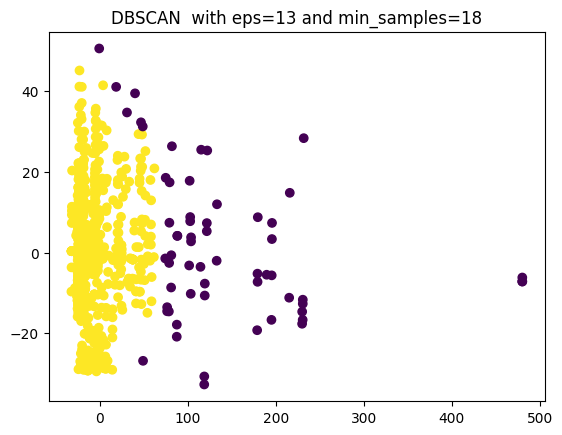

Silhouette Score for DBSCAN algorithm with 13 eps and 19 min samples: 0.771

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.883333  0.616667  0.850000  172.750692            0.0  \
 0  2.403129  29.158845  0.516245  0.347774   22.056447            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.516667    0.000000    0.483333  
 0    0.334537  0.665463    0.164862    0.092659    0.742479  


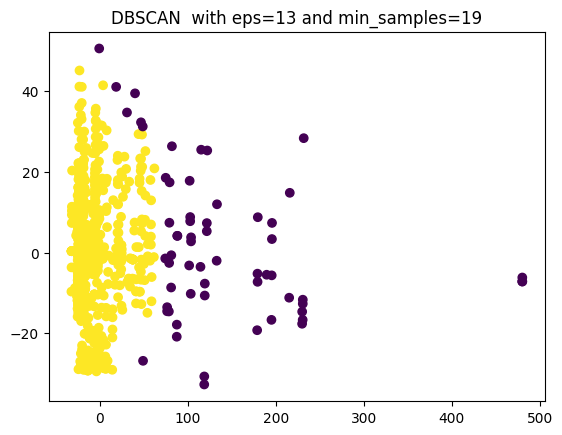

Silhouette Score for DBSCAN algorithm with 13 eps and 20 min samples: 0.767

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  35.693548  0.629032  0.838710  169.669218            0.0  \
 0  2.406514  29.084439  0.515078  0.347407   21.923351            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.596774  0.403226    0.532258    0.000000    0.467742  
 0    0.334138  0.665862    0.162847    0.092883    0.744270  


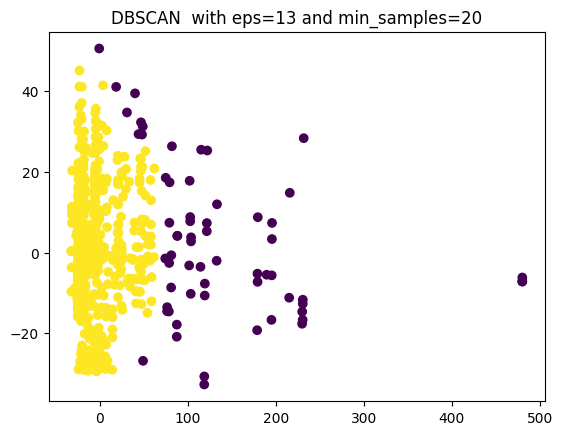

Silhouette Score for DBSCAN algorithm with 14 eps and 9 min samples: 0.680

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  35.515152  0.696970  1.000000  221.264397            0.0  \
 0  2.37338  29.300353  0.518257  0.358068   23.669174            0.0   
 1  1.00000  30.666667  0.333333  0.333333  144.121744            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.575758  0.424242    0.575758    0.000000    0.424242  
 0    0.339223  0.660777    0.171967    0.090695    0.737338  
 1    0.777778  0.222222    0.333333    0.000000    0.666667  


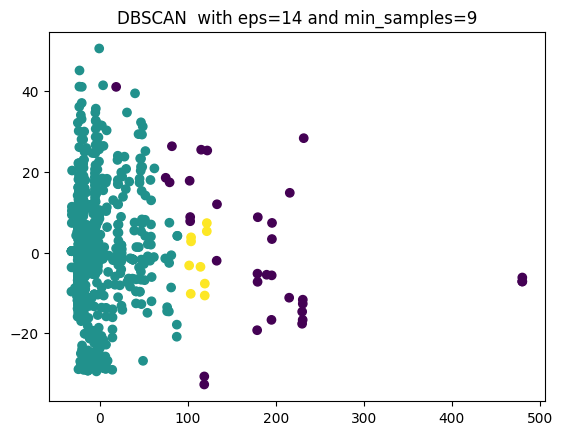

Silhouette Score for DBSCAN algorithm with 14 eps and 10 min samples: 0.601

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  33.477273  0.636364  0.909091  200.882291            0.0  \
 0  2.391408  29.361575  0.514320  0.349642   22.479867            0.0   
 1  1.000000  27.333333  0.777778  0.777778  112.999989            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.613636  0.386364    0.500000    0.000000    0.500000  
 0    0.335322  0.664678    0.165871    0.091885    0.742243  
 1    0.666667  0.333333    0.777778    0.000000    0.222222  


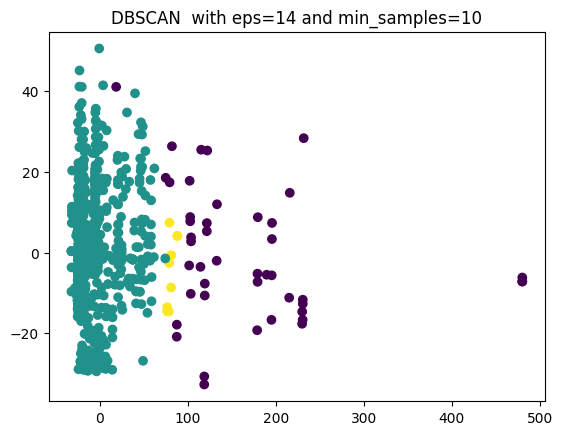

Silhouette Score for DBSCAN algorithm with 14 eps and 11 min samples: 0.789

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.433962  0.660377  0.886792  185.958881            0.0  \
 0  2.391408  29.361575  0.514320  0.349642   22.479867            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.622642  0.377358    0.547170    0.000000    0.452830  
 0    0.335322  0.664678    0.165871    0.091885    0.742243  


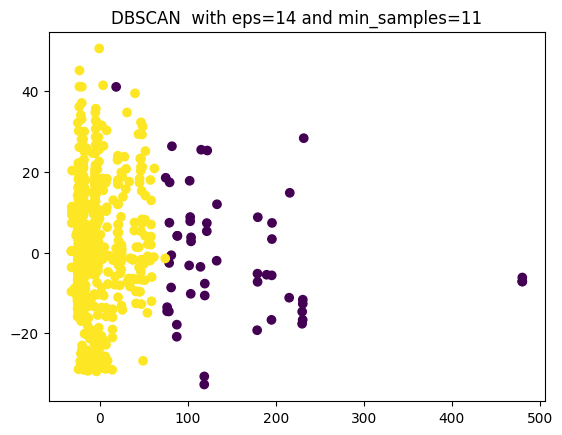

Silhouette Score for DBSCAN algorithm with 14 eps and 12 min samples: 0.785

Clusters grouping data
      Pclass        Age     SibSp    Parch        Fare  Cabin_unknown   
-1  1.00000  33.314815  0.648148  0.87037  183.070754            0.0  \
 0  2.39307  29.301075  0.514934  0.35006   22.470882            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.611111  0.388889    0.537037    0.000000    0.462963  
 0    0.335723  0.664277    0.166069    0.091995    0.741935  


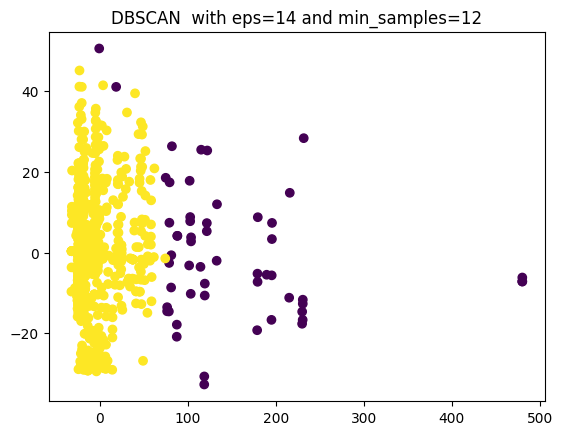

Silhouette Score for DBSCAN algorithm with 14 eps and 13 min samples: 0.785

Clusters grouping data
      Pclass        Age     SibSp    Parch        Fare  Cabin_unknown   
-1  1.00000  33.314815  0.648148  0.87037  183.070754            0.0  \
 0  2.39307  29.301075  0.514934  0.35006   22.470882            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.611111  0.388889    0.537037    0.000000    0.462963  
 0    0.335723  0.664277    0.166069    0.091995    0.741935  


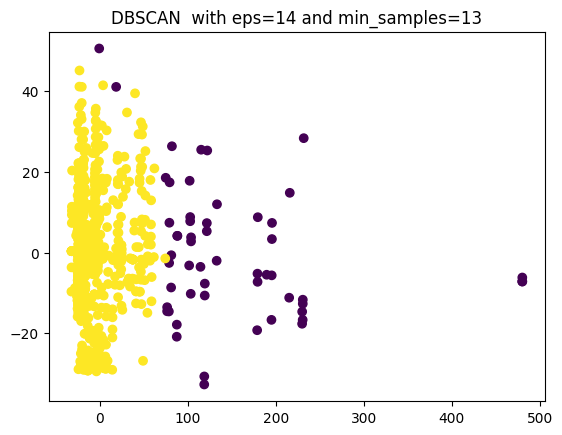

Silhouette Score for DBSCAN algorithm with 14 eps and 14 min samples: 0.782

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  33.981818  0.654545  0.872727  181.033104            0.0  \
 0  2.394737  29.252392  0.514354  0.349282   22.412833            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.527273    0.000000    0.472727  
 0    0.336124  0.663876    0.166268    0.092105    0.741627  


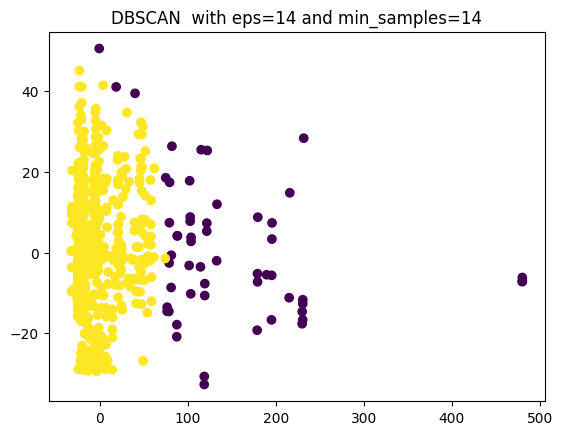

Silhouette Score for DBSCAN algorithm with 14 eps and 15 min samples: 0.779

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.535714  0.642857  0.875000  178.907141            0.0  \
 0  2.396407  29.209581  0.514970  0.348503   22.365448            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.589286  0.410714    0.535714    0.000000    0.464286  
 0    0.336527  0.663473    0.165269    0.092216    0.742515  


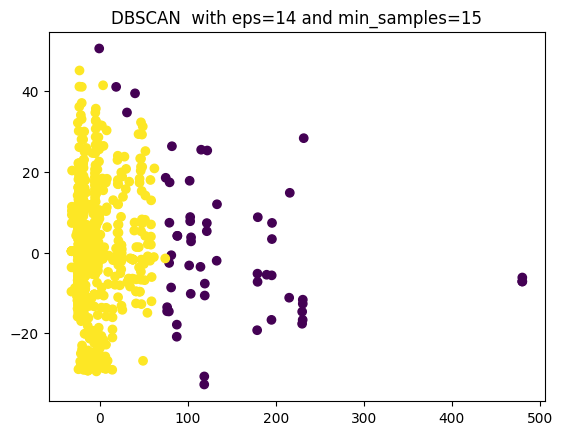

Silhouette Score for DBSCAN algorithm with 14 eps and 16 min samples: 0.776

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  33.931034  0.620690  0.879310  175.984193            0.0  \
 0  2.39976  29.238896  0.516206  0.346939   22.193117            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.534483    0.000000    0.465517  
 0    0.336134  0.663866    0.164466    0.092437    0.743097  


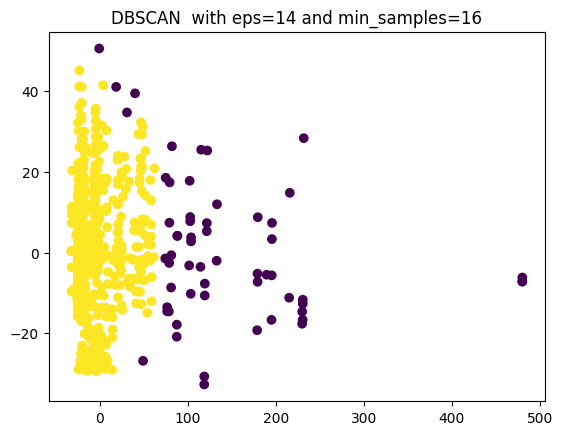

Silhouette Score for DBSCAN algorithm with 14 eps and 17 min samples: 0.776

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  33.931034  0.620690  0.879310  175.984193            0.0  \
 0  2.39976  29.238896  0.516206  0.346939   22.193117            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.534483    0.000000    0.465517  
 0    0.336134  0.663866    0.164466    0.092437    0.743097  


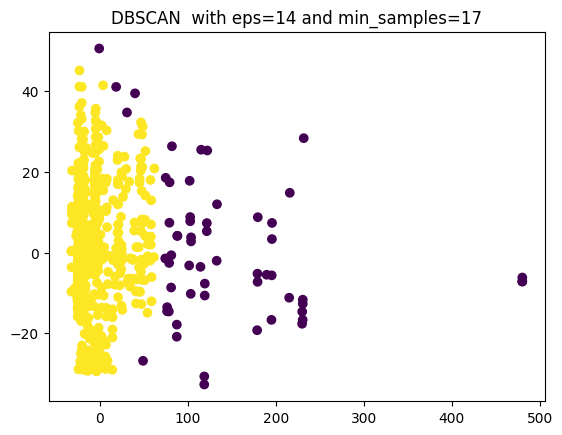

Silhouette Score for DBSCAN algorithm with 14 eps and 18 min samples: 0.776

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  33.931034  0.620690  0.879310  175.984193            0.0  \
 0  2.39976  29.238896  0.516206  0.346939   22.193117            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.534483    0.000000    0.465517  
 0    0.336134  0.663866    0.164466    0.092437    0.743097  


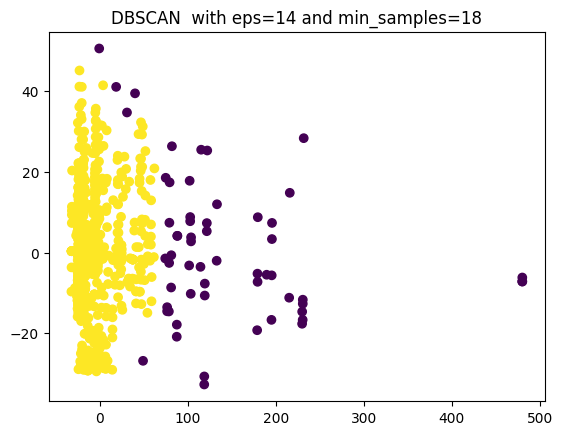

Silhouette Score for DBSCAN algorithm with 14 eps and 19 min samples: 0.776

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  33.931034  0.620690  0.879310  175.984193            0.0  \
 0  2.39976  29.238896  0.516206  0.346939   22.193117            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.534483    0.000000    0.465517  
 0    0.336134  0.663866    0.164466    0.092437    0.743097  


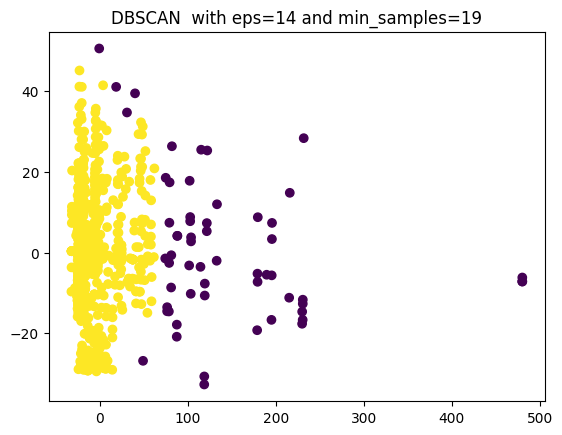

Silhouette Score for DBSCAN algorithm with 14 eps and 20 min samples: 0.773

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.423729  0.627119  0.864407  174.322737            0.0  \
 0  2.401442  29.198317  0.515625  0.347356   22.126091            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.593220  0.406780    0.525424    0.000000    0.474576  
 0    0.335337  0.664663    0.164663    0.092548    0.742788  


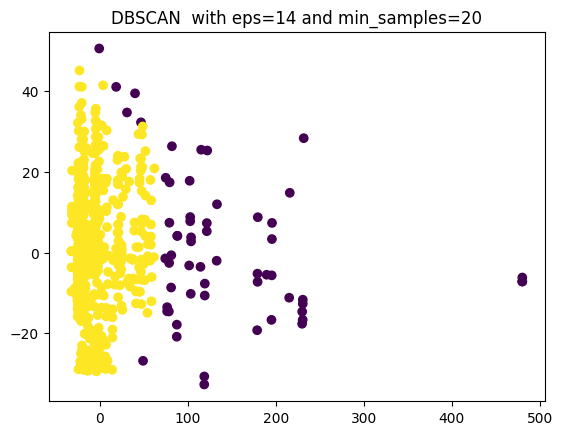

Silhouette Score for DBSCAN algorithm with 15 eps and 9 min samples: 0.682

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.406250  0.718750  1.031250  226.631903            0.0  \
 0  2.371765  29.349412  0.517647  0.357647   23.699568            0.0   
 1  1.000000  30.666667  0.333333  0.333333  144.121744            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.593750  0.406250    0.562500    0.000000    0.437500  
 0    0.338824  0.661176    0.172941    0.090588    0.736471  
 1    0.777778  0.222222    0.333333    0.000000    0.666667  


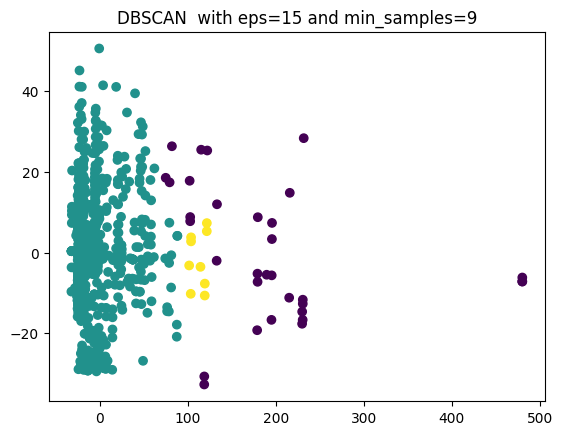

Silhouette Score for DBSCAN algorithm with 15 eps and 10 min samples: 0.612

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  33.585366  0.634146  0.878049  208.519917            0.0  \
 0  2.38975  29.411204  0.513707  0.349225   22.512077            0.0   
 1  1.00000  24.636364  0.818182  1.000000  114.272718            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.634146  0.365854    0.512195    0.000000    0.487805  
 0    0.334923  0.665077    0.166865    0.091776    0.741359  
 1    0.636364  0.363636    0.636364    0.000000    0.363636  


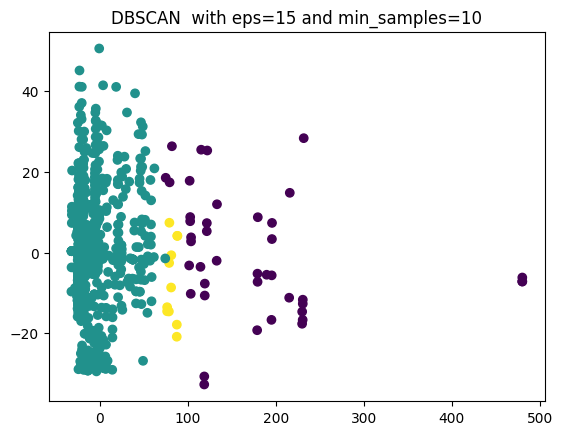

Silhouette Score for DBSCAN algorithm with 15 eps and 11 min samples: 0.612

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  33.714286  0.642857  0.880952  206.195236            0.0  \
 0  2.38975  29.411204  0.513707  0.349225   22.512077            0.0   
 1  1.00000  23.200000  0.800000  1.000000  114.611660            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.642857  0.357143    0.523810    0.000000    0.476190  
 0    0.334923  0.665077    0.166865    0.091776    0.741359  
 1    0.600000  0.400000    0.600000    0.000000    0.400000  


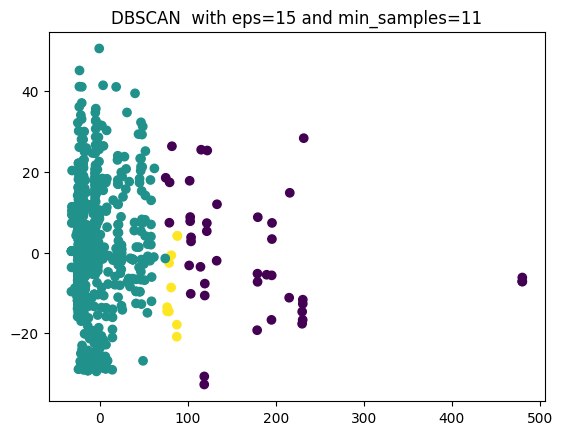

Silhouette Score for DBSCAN algorithm with 15 eps and 12 min samples: 0.792

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  31.692308  0.673077  0.903846  188.583010            0.0  \
 0  2.38975  29.411204  0.513707  0.349225   22.512077            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.634615  0.365385    0.538462    0.000000    0.461538  
 0    0.334923  0.665077    0.166865    0.091776    0.741359  


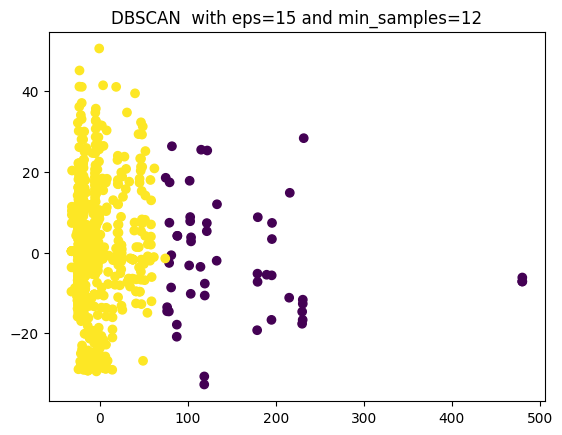

Silhouette Score for DBSCAN algorithm with 15 eps and 13 min samples: 0.785

Clusters grouping data
      Pclass        Age     SibSp    Parch        Fare  Cabin_unknown   
-1  1.00000  33.314815  0.648148  0.87037  183.070754            0.0  \
 0  2.39307  29.301075  0.514934  0.35006   22.470882            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.611111  0.388889    0.537037    0.000000    0.462963  
 0    0.335723  0.664277    0.166069    0.091995    0.741935  


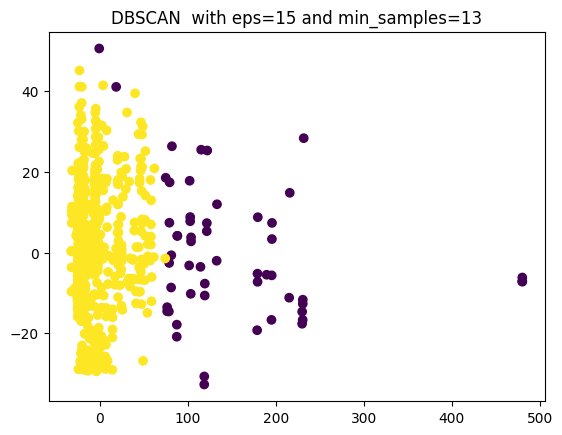

Silhouette Score for DBSCAN algorithm with 15 eps and 14 min samples: 0.785

Clusters grouping data
      Pclass        Age     SibSp    Parch        Fare  Cabin_unknown   
-1  1.00000  33.314815  0.648148  0.87037  183.070754            0.0  \
 0  2.39307  29.301075  0.514934  0.35006   22.470882            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.611111  0.388889    0.537037    0.000000    0.462963  
 0    0.335723  0.664277    0.166069    0.091995    0.741935  


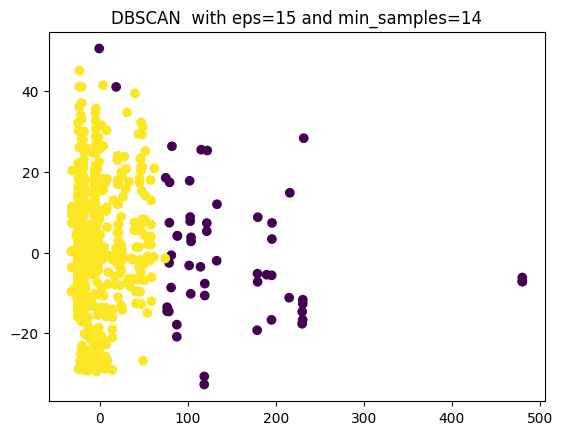

Silhouette Score for DBSCAN algorithm with 15 eps and 15 min samples: 0.785

Clusters grouping data
      Pclass        Age     SibSp    Parch        Fare  Cabin_unknown   
-1  1.00000  33.314815  0.648148  0.87037  183.070754            0.0  \
 0  2.39307  29.301075  0.514934  0.35006   22.470882            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.611111  0.388889    0.537037    0.000000    0.462963  
 0    0.335723  0.664277    0.166069    0.091995    0.741935  


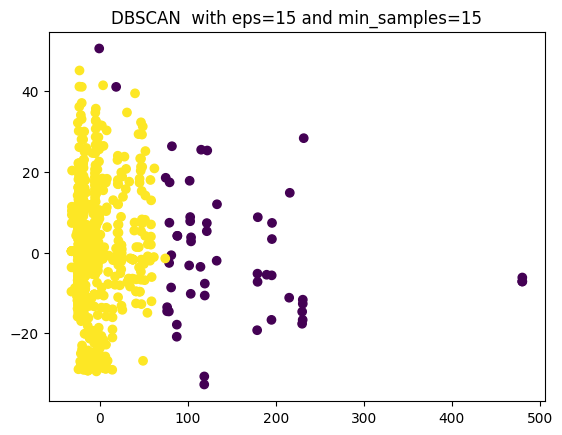

Silhouette Score for DBSCAN algorithm with 15 eps and 16 min samples: 0.782

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  33.981818  0.654545  0.872727  181.033104            0.0  \
 0  2.394737  29.252392  0.514354  0.349282   22.412833            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.527273    0.000000    0.472727  
 0    0.336124  0.663876    0.166268    0.092105    0.741627  


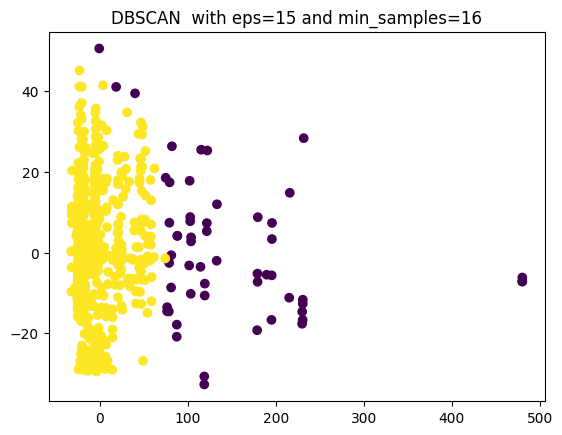

Silhouette Score for DBSCAN algorithm with 15 eps and 17 min samples: 0.779

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.535714  0.642857  0.875000  178.907141            0.0  \
 0  2.396407  29.209581  0.514970  0.348503   22.365448            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.589286  0.410714    0.535714    0.000000    0.464286  
 0    0.336527  0.663473    0.165269    0.092216    0.742515  


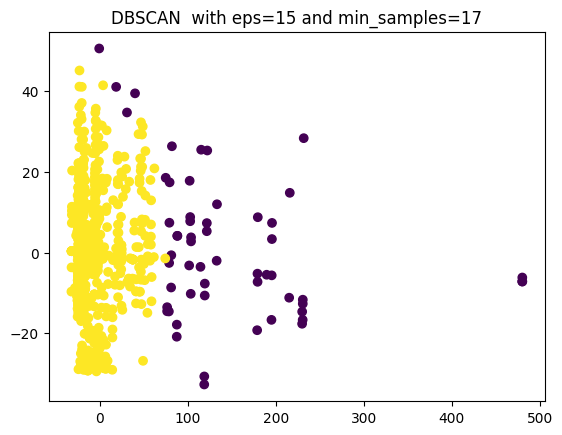

Silhouette Score for DBSCAN algorithm with 15 eps and 18 min samples: 0.778

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.456140  0.631579  0.859649  177.635525            0.0  \
 0  2.398082  29.208633  0.515588  0.348921   22.264658            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.596491  0.403509    0.543860    0.000000    0.456140  
 0    0.335731  0.664269    0.164269    0.092326    0.743405  


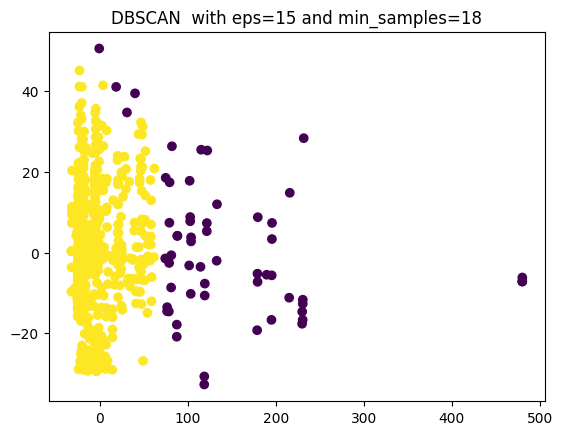

Silhouette Score for DBSCAN algorithm with 15 eps and 19 min samples: 0.778

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.456140  0.631579  0.859649  177.635525            0.0  \
 0  2.398082  29.208633  0.515588  0.348921   22.264658            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.596491  0.403509    0.543860    0.000000    0.456140  
 0    0.335731  0.664269    0.164269    0.092326    0.743405  


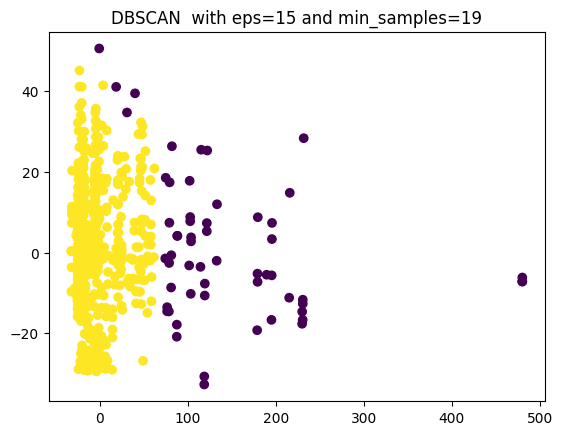

Silhouette Score for DBSCAN algorithm with 15 eps and 20 min samples: 0.778

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.456140  0.631579  0.859649  177.635525            0.0  \
 0  2.398082  29.208633  0.515588  0.348921   22.264658            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.596491  0.403509    0.543860    0.000000    0.456140  
 0    0.335731  0.664269    0.164269    0.092326    0.743405  


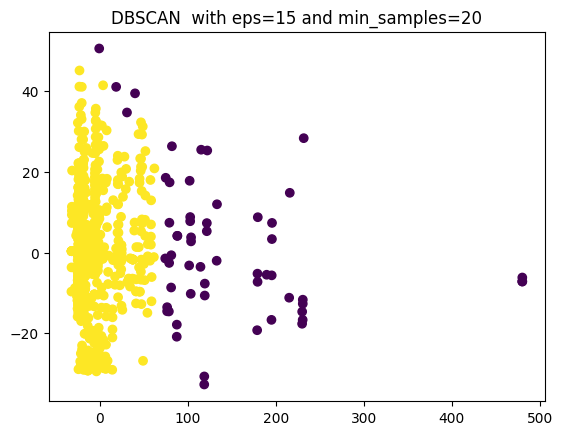

Silhouette Score for DBSCAN algorithm with 16 eps and 9 min samples: 0.827

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.259259  0.666667  1.148148  245.639356            0.0  \
 0  2.349537  29.459491  0.518519  0.357639   25.534360            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1     0.62963   0.37037    0.518519     0.00000    0.481481  
 0     0.34375   0.65625    0.178241     0.08912    0.732639  


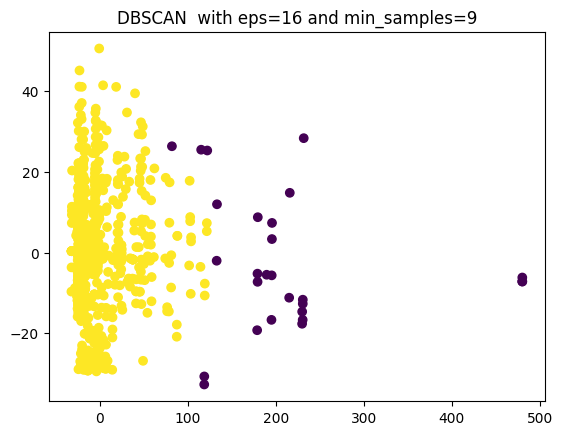

Silhouette Score for DBSCAN algorithm with 16 eps and 10 min samples: 0.821

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.129032  0.612903  1.096774  233.622181            0.0  \
 0  2.355814  29.451163  0.519767  0.355814   24.943793            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.645161  0.354839    0.451613    0.000000    0.548387  
 0    0.341860  0.658140    0.179070    0.089535    0.731395  


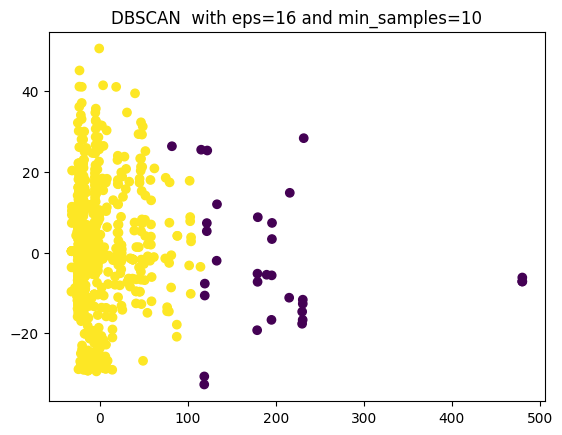

Silhouette Score for DBSCAN algorithm with 16 eps and 11 min samples: 0.817

Clusters grouping data
      Pclass        Age     SibSp    Parch        Fare  Cabin_unknown   
-1  1.00000  32.264706  0.647059  1.00000  225.237991            0.0  \
 0  2.36056  29.436406  0.518086  0.35706   24.545925            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.617647  0.382353    0.470588    0.000000    0.529412  
 0    0.341890  0.658110    0.177363    0.089848    0.732789  


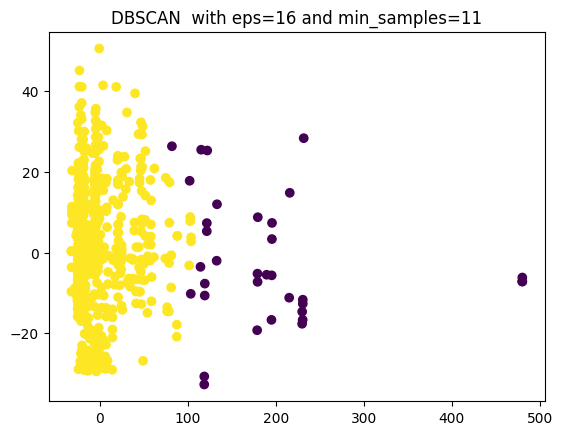

Silhouette Score for DBSCAN algorithm with 16 eps and 12 min samples: 0.636

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  30.102564  0.666667  1.025641  210.942949            0.0  \
 0  2.388095  29.435714  0.514286  0.348810   22.611974            0.0   
 1  1.000000  35.333333  0.666667  0.583333  122.759708            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.589744  0.410256    0.487179    0.000000    0.512821  
 0    0.334524  0.665476    0.167857    0.091667    0.740476  
 1    0.833333  0.166667    0.666667    0.000000    0.333333  


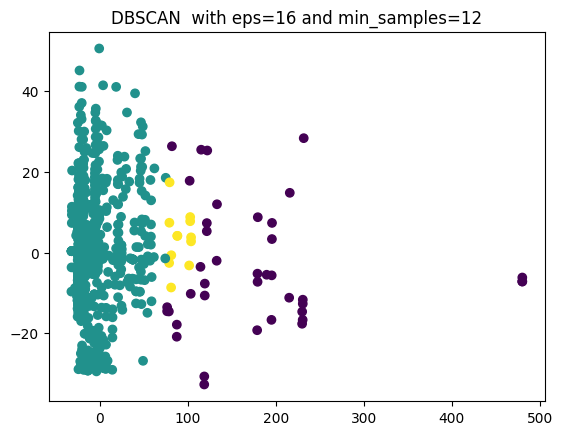

Silhouette Score for DBSCAN algorithm with 16 eps and 13 min samples: 0.637

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  30.600000  0.675000  1.000000  208.330000            0.0  \
 0  2.38975  29.411204  0.513707  0.349225   22.512077            0.0   
 1  1.00000  35.333333  0.666667  0.583333  122.759708            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.575000  0.425000    0.500000    0.000000    0.500000  
 0    0.334923  0.665077    0.166865    0.091776    0.741359  
 1    0.833333  0.166667    0.666667    0.000000    0.333333  


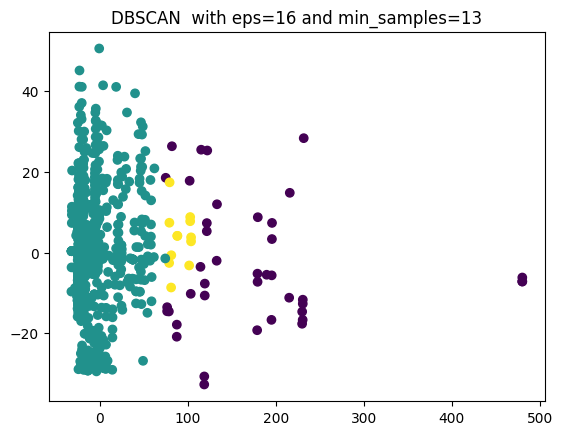

Silhouette Score for DBSCAN algorithm with 16 eps and 14 min samples: 0.792

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  31.692308  0.673077  0.903846  188.583010            0.0  \
 0  2.38975  29.411204  0.513707  0.349225   22.512077            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.634615  0.365385    0.538462    0.000000    0.461538  
 0    0.334923  0.665077    0.166865    0.091776    0.741359  


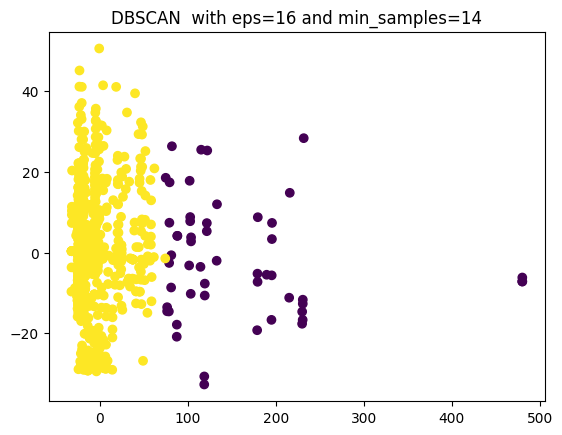

Silhouette Score for DBSCAN algorithm with 16 eps and 15 min samples: 0.792

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  31.692308  0.673077  0.903846  188.583010            0.0  \
 0  2.38975  29.411204  0.513707  0.349225   22.512077            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.634615  0.365385    0.538462    0.000000    0.461538  
 0    0.334923  0.665077    0.166865    0.091776    0.741359  


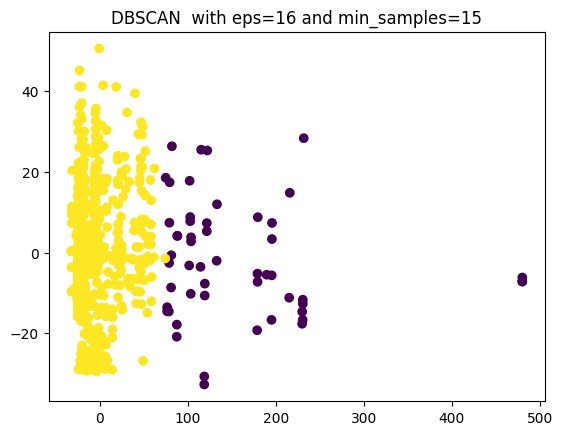

Silhouette Score for DBSCAN algorithm with 16 eps and 16 min samples: 0.792

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  31.692308  0.673077  0.903846  188.583010            0.0  \
 0  2.38975  29.411204  0.513707  0.349225   22.512077            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.634615  0.365385    0.538462    0.000000    0.461538  
 0    0.334923  0.665077    0.166865    0.091776    0.741359  


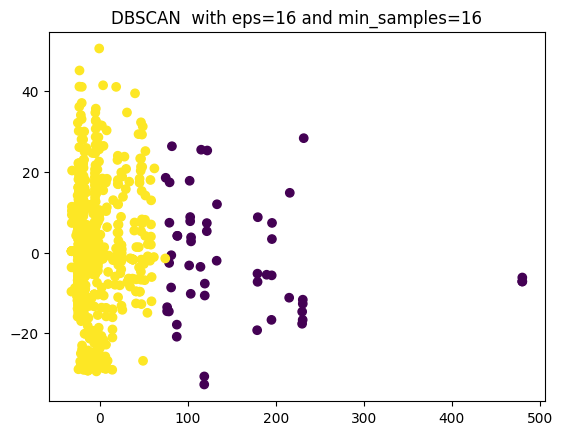

Silhouette Score for DBSCAN algorithm with 16 eps and 17 min samples: 0.789

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.415094  0.679245  0.905660  186.364462            0.0  \
 0  2.391408  29.362768  0.513126  0.348449   22.454216            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.622642  0.377358    0.528302    0.000000    0.471698  
 0    0.335322  0.664678    0.167064    0.091885    0.741050  


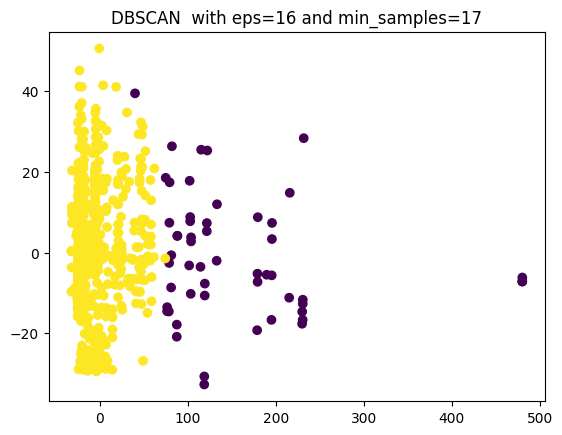

Silhouette Score for DBSCAN algorithm with 16 eps and 18 min samples: 0.789

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.415094  0.679245  0.905660  186.364462            0.0  \
 0  2.391408  29.362768  0.513126  0.348449   22.454216            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.622642  0.377358    0.528302    0.000000    0.471698  
 0    0.335322  0.664678    0.167064    0.091885    0.741050  


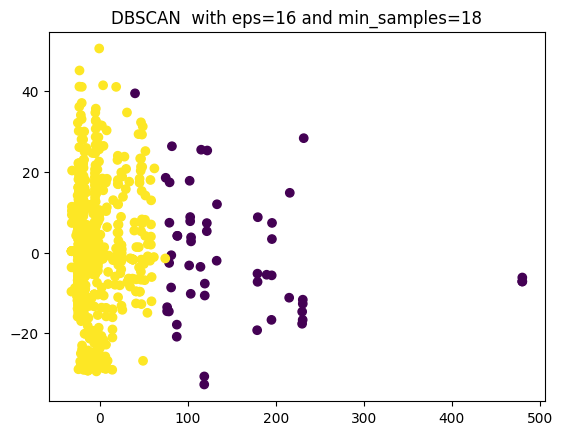

Silhouette Score for DBSCAN algorithm with 16 eps and 19 min samples: 0.789

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.415094  0.679245  0.905660  186.364462            0.0  \
 0  2.391408  29.362768  0.513126  0.348449   22.454216            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.622642  0.377358    0.528302    0.000000    0.471698  
 0    0.335322  0.664678    0.167064    0.091885    0.741050  


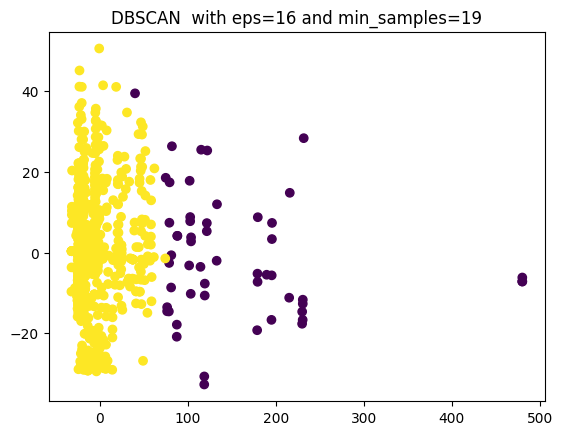

Silhouette Score for DBSCAN algorithm with 16 eps and 20 min samples: 0.789

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.415094  0.679245  0.905660  186.364462            0.0  \
 0  2.391408  29.362768  0.513126  0.348449   22.454216            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.622642  0.377358    0.528302    0.000000    0.471698  
 0    0.335322  0.664678    0.167064    0.091885    0.741050  


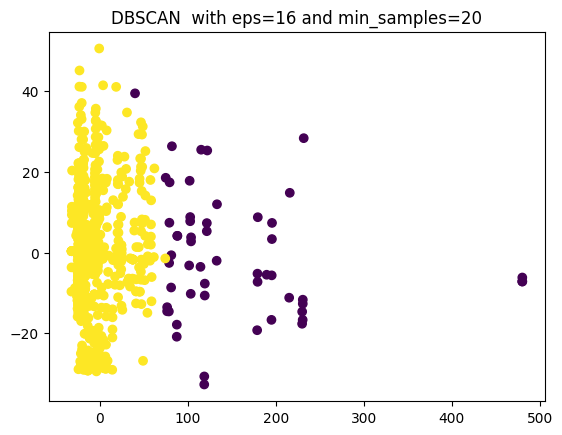

Silhouette Score for DBSCAN algorithm with 17 eps and 9 min samples: 0.827

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.259259  0.666667  1.148148  245.639356            0.0  \
 0  2.349537  29.459491  0.518519  0.357639   25.534360            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1     0.62963   0.37037    0.518519     0.00000    0.481481  
 0     0.34375   0.65625    0.178241     0.08912    0.732639  


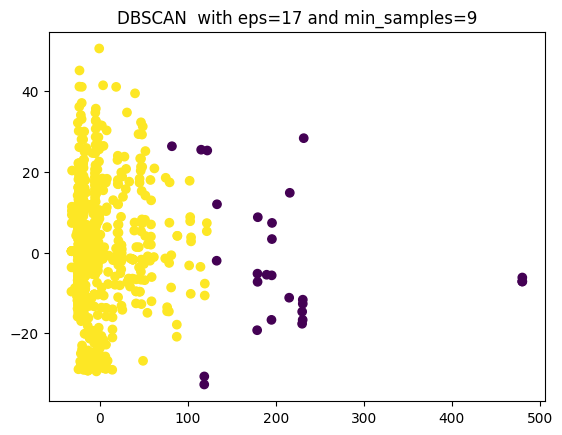

Silhouette Score for DBSCAN algorithm with 17 eps and 10 min samples: 0.827

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.259259  0.666667  1.148148  245.639356            0.0  \
 0  2.349537  29.459491  0.518519  0.357639   25.534360            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1     0.62963   0.37037    0.518519     0.00000    0.481481  
 0     0.34375   0.65625    0.178241     0.08912    0.732639  


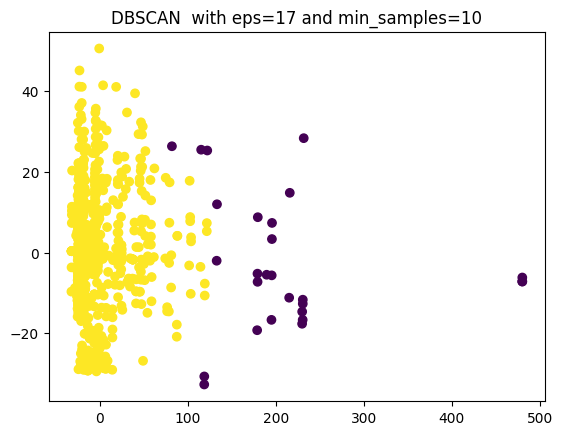

Silhouette Score for DBSCAN algorithm with 17 eps and 11 min samples: 0.817

Clusters grouping data
      Pclass        Age     SibSp    Parch        Fare  Cabin_unknown   
-1  1.00000  32.264706  0.647059  1.00000  225.237991            0.0  \
 0  2.36056  29.436406  0.518086  0.35706   24.545925            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.617647  0.382353    0.470588    0.000000    0.529412  
 0    0.341890  0.658110    0.177363    0.089848    0.732789  


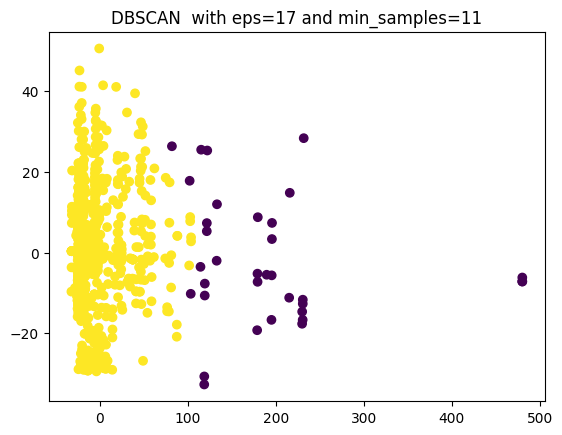

Silhouette Score for DBSCAN algorithm with 17 eps and 12 min samples: 0.817

Clusters grouping data
      Pclass        Age     SibSp    Parch        Fare  Cabin_unknown   
-1  1.00000  32.264706  0.647059  1.00000  225.237991            0.0  \
 0  2.36056  29.436406  0.518086  0.35706   24.545925            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.617647  0.382353    0.470588    0.000000    0.529412  
 0    0.341890  0.658110    0.177363    0.089848    0.732789  


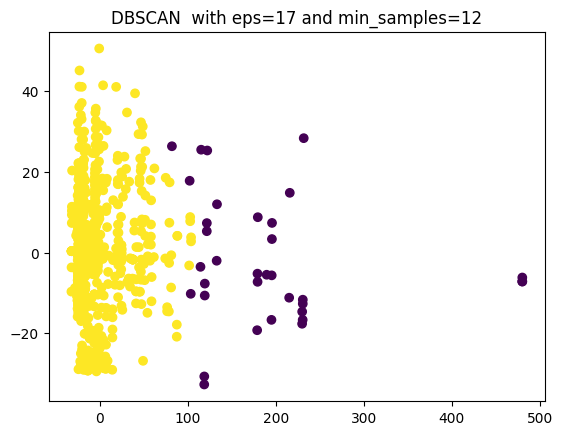

Silhouette Score for DBSCAN algorithm with 17 eps and 13 min samples: 0.812

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.166667  0.666667  1.055556  219.391436            0.0  \
 0  2.363743  29.476023  0.516959  0.353216   24.322640            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.611111  0.388889    0.444444    0.000000    0.555556  
 0    0.341520  0.658480    0.177778    0.090058    0.732164  


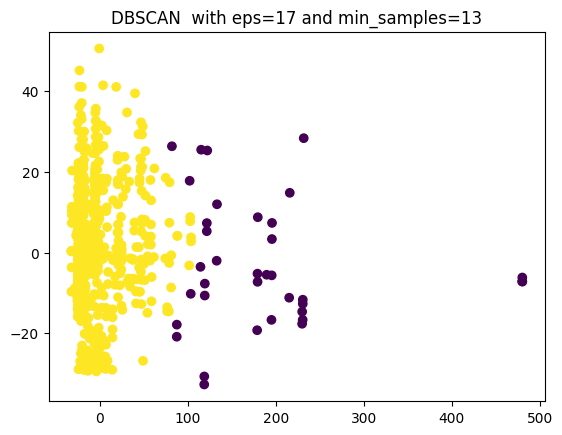

Silhouette Score for DBSCAN algorithm with 17 eps and 14 min samples: 0.794

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.333333  0.666667  0.921569  190.193951            0.0  \
 0  2.388095  29.435714  0.514286  0.348810   22.611974            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.647059  0.352941    0.529412    0.000000    0.470588  
 0    0.334524  0.665476    0.167857    0.091667    0.740476  


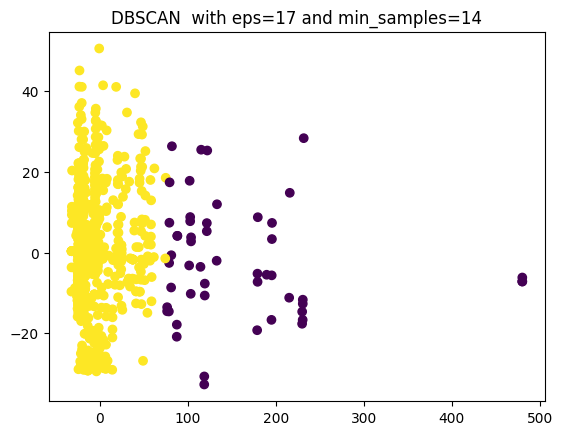

Silhouette Score for DBSCAN algorithm with 17 eps and 15 min samples: 0.794

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.333333  0.666667  0.921569  190.193951            0.0  \
 0  2.388095  29.435714  0.514286  0.348810   22.611974            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.647059  0.352941    0.529412    0.000000    0.470588  
 0    0.334524  0.665476    0.167857    0.091667    0.740476  


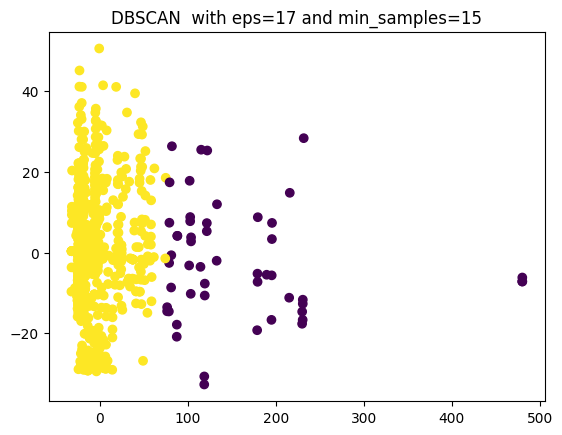

Silhouette Score for DBSCAN algorithm with 17 eps and 16 min samples: 0.794

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.333333  0.666667  0.921569  190.193951            0.0  \
 0  2.388095  29.435714  0.514286  0.348810   22.611974            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.647059  0.352941    0.529412    0.000000    0.470588  
 0    0.334524  0.665476    0.167857    0.091667    0.740476  


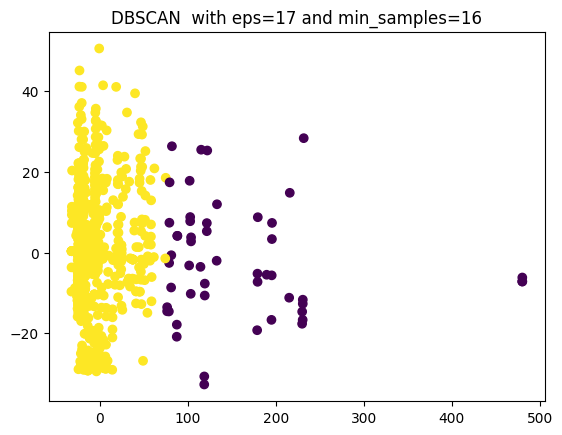

Silhouette Score for DBSCAN algorithm with 17 eps and 17 min samples: 0.792

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  31.692308  0.673077  0.903846  188.583010            0.0  \
 0  2.38975  29.411204  0.513707  0.349225   22.512077            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.634615  0.365385    0.538462    0.000000    0.461538  
 0    0.334923  0.665077    0.166865    0.091776    0.741359  


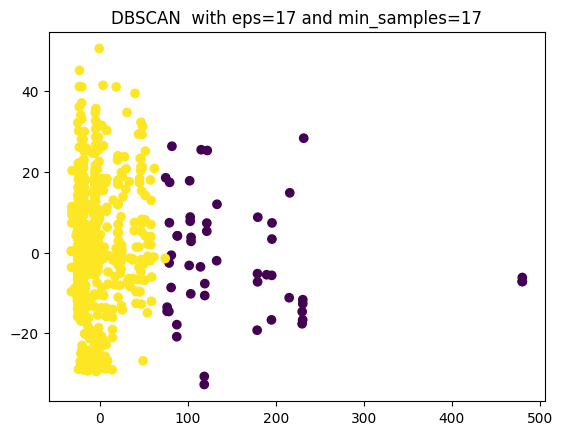

Silhouette Score for DBSCAN algorithm with 17 eps and 18 min samples: 0.792

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  31.692308  0.673077  0.903846  188.583010            0.0  \
 0  2.38975  29.411204  0.513707  0.349225   22.512077            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.634615  0.365385    0.538462    0.000000    0.461538  
 0    0.334923  0.665077    0.166865    0.091776    0.741359  


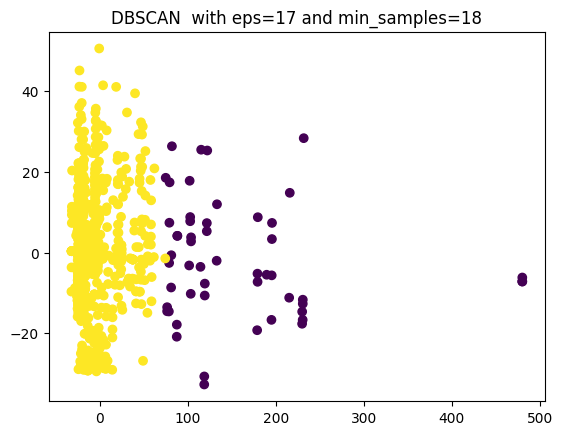

Silhouette Score for DBSCAN algorithm with 17 eps and 19 min samples: 0.789

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.415094  0.679245  0.905660  186.364462            0.0  \
 0  2.391408  29.362768  0.513126  0.348449   22.454216            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.622642  0.377358    0.528302    0.000000    0.471698  
 0    0.335322  0.664678    0.167064    0.091885    0.741050  


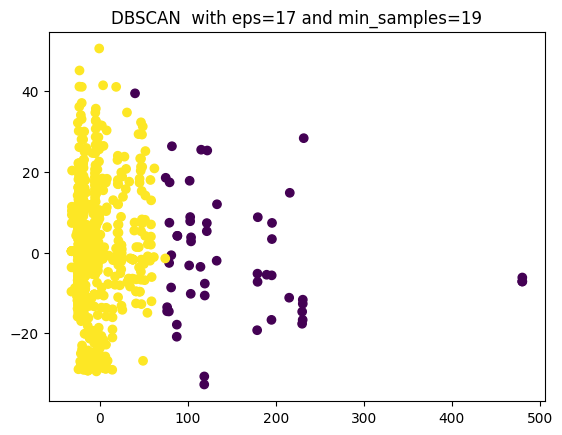

Silhouette Score for DBSCAN algorithm with 17 eps and 20 min samples: 0.789

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.415094  0.679245  0.905660  186.364462            0.0  \
 0  2.391408  29.362768  0.513126  0.348449   22.454216            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.622642  0.377358    0.528302    0.000000    0.471698  
 0    0.335322  0.664678    0.167064    0.091885    0.741050  


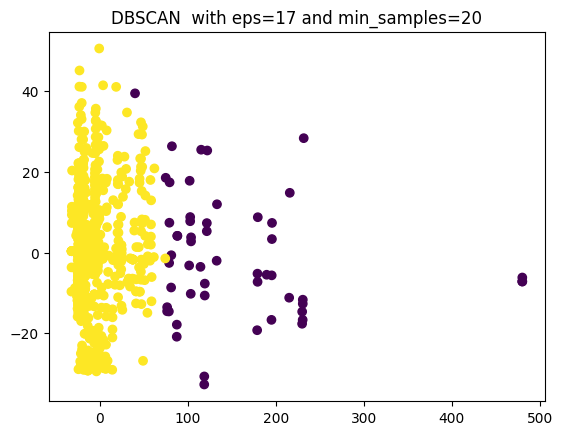

Silhouette Score for DBSCAN algorithm with 18 eps and 9 min samples: 0.787

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  33.388889  0.944444  1.500000  258.603939            0.0  \
 0  2.349537  29.459491  0.518519  0.357639   25.534360            0.0   
 1  1.000000  30.000000  0.111111  0.444444  219.710189            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.611111  0.388889    0.500000     0.00000    0.500000  
 0    0.343750  0.656250    0.178241     0.08912    0.732639  
 1    0.666667  0.333333    0.555556     0.00000    0.444444  


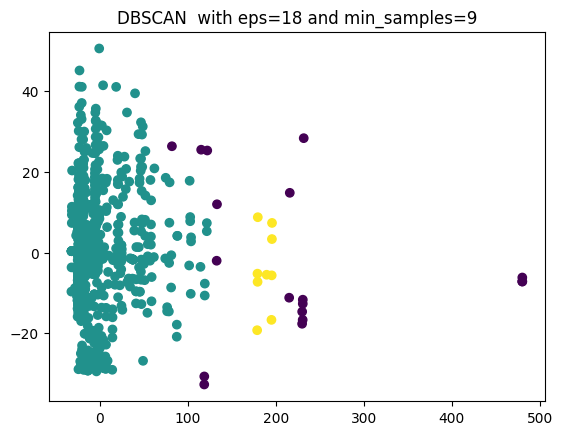

Silhouette Score for DBSCAN algorithm with 18 eps and 10 min samples: 0.827

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.259259  0.666667  1.148148  245.639356            0.0  \
 0  2.349537  29.459491  0.518519  0.357639   25.534360            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1     0.62963   0.37037    0.518519     0.00000    0.481481  
 0     0.34375   0.65625    0.178241     0.08912    0.732639  


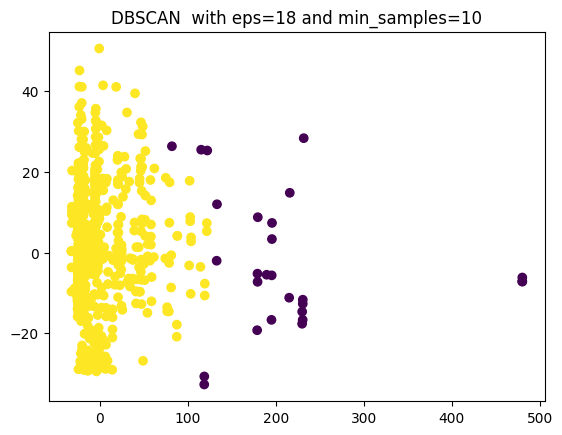

Silhouette Score for DBSCAN algorithm with 18 eps and 11 min samples: 0.684

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  32.892857  0.714286  1.107143  241.639736            0.0  \
 0  2.36056  29.436406  0.518086  0.357060   24.545925            0.0   
 1  1.00000  29.333333  0.333333  0.500000  148.696517            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.607143  0.392857    0.500000    0.000000    0.500000  
 0    0.341890  0.658110    0.177363    0.089848    0.732789  
 1    0.666667  0.333333    0.333333    0.000000    0.666667  


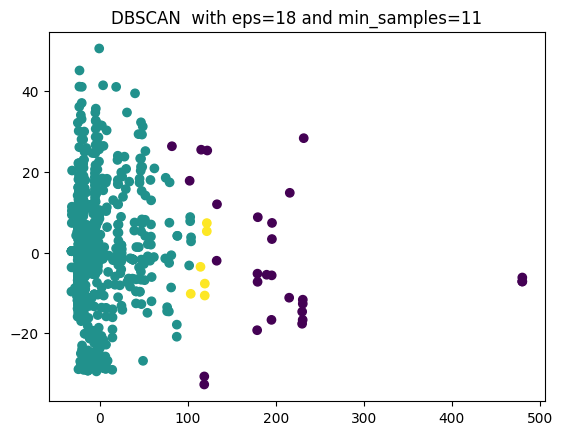

Silhouette Score for DBSCAN algorithm with 18 eps and 12 min samples: 0.817

Clusters grouping data
      Pclass        Age     SibSp    Parch        Fare  Cabin_unknown   
-1  1.00000  32.264706  0.647059  1.00000  225.237991            0.0  \
 0  2.36056  29.436406  0.518086  0.35706   24.545925            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.617647  0.382353    0.470588    0.000000    0.529412  
 0    0.341890  0.658110    0.177363    0.089848    0.732789  


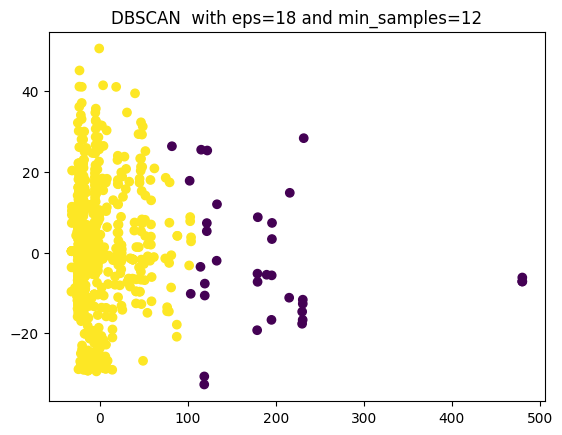

Silhouette Score for DBSCAN algorithm with 18 eps and 13 min samples: 0.812

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.166667  0.666667  1.055556  219.391436            0.0  \
 0  2.363743  29.476023  0.516959  0.353216   24.322640            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.611111  0.388889    0.444444    0.000000    0.555556  
 0    0.341520  0.658480    0.177778    0.090058    0.732164  


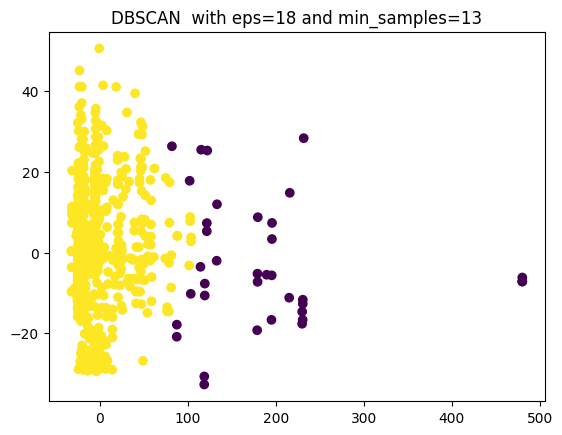

Silhouette Score for DBSCAN algorithm with 18 eps and 14 min samples: 0.808

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.780488  0.634146  0.951220  209.073373            0.0  \
 0  2.371765  29.436471  0.517647  0.354118   23.672872            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.658537  0.341463    0.463415    0.000000    0.536585  
 0    0.337647  0.662353    0.175294    0.090588    0.734118  


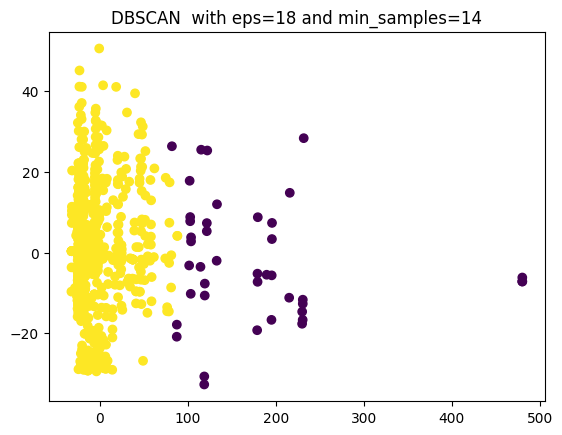

Silhouette Score for DBSCAN algorithm with 18 eps and 15 min samples: 0.808

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.780488  0.634146  0.951220  209.073373            0.0  \
 0  2.371765  29.436471  0.517647  0.354118   23.672872            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.658537  0.341463    0.463415    0.000000    0.536585  
 0    0.337647  0.662353    0.175294    0.090588    0.734118  


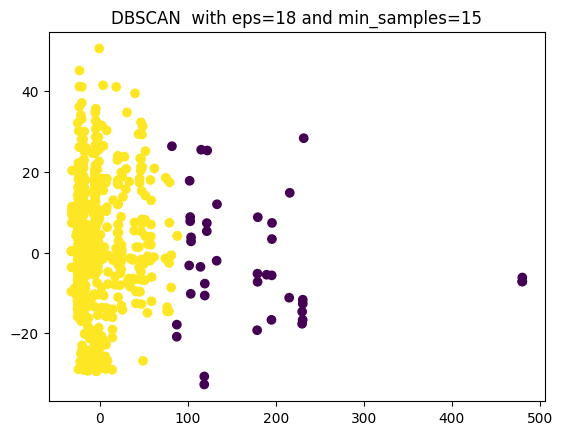

Silhouette Score for DBSCAN algorithm with 18 eps and 16 min samples: 0.799

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.595745  0.659574  0.978723  197.028189            0.0  \
 0  2.381517  29.430095  0.515403  0.348341   23.025621            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.659574  0.340426    0.489362    0.000000    0.510638  
 0    0.335308  0.664692    0.171801    0.091232    0.736967  


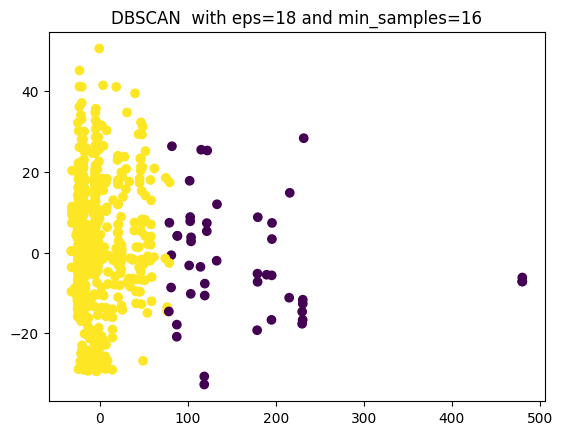

Silhouette Score for DBSCAN algorithm with 18 eps and 17 min samples: 0.799

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.595745  0.659574  0.978723  197.028189            0.0  \
 0  2.381517  29.430095  0.515403  0.348341   23.025621            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.659574  0.340426    0.489362    0.000000    0.510638  
 0    0.335308  0.664692    0.171801    0.091232    0.736967  


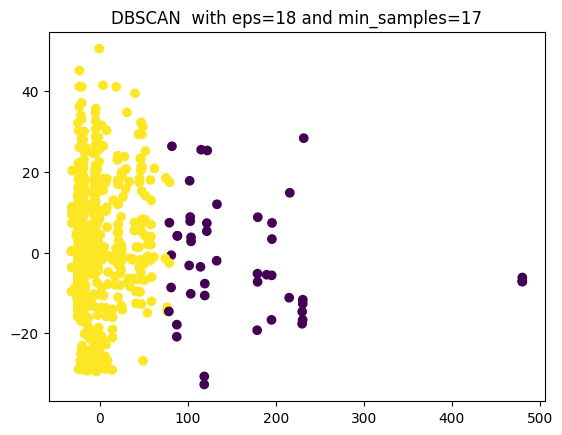

Silhouette Score for DBSCAN algorithm with 18 eps and 18 min samples: 0.799

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.595745  0.659574  0.978723  197.028189            0.0  \
 0  2.381517  29.430095  0.515403  0.348341   23.025621            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.659574  0.340426    0.489362    0.000000    0.510638  
 0    0.335308  0.664692    0.171801    0.091232    0.736967  


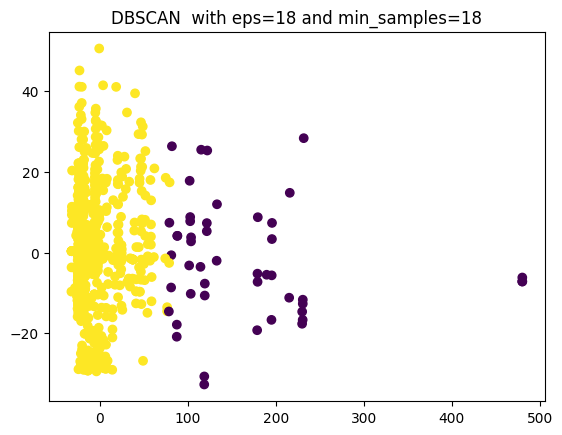

Silhouette Score for DBSCAN algorithm with 18 eps and 19 min samples: 0.799

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.595745  0.659574  0.978723  197.028189            0.0  \
 0  2.381517  29.430095  0.515403  0.348341   23.025621            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.659574  0.340426    0.489362    0.000000    0.510638  
 0    0.335308  0.664692    0.171801    0.091232    0.736967  


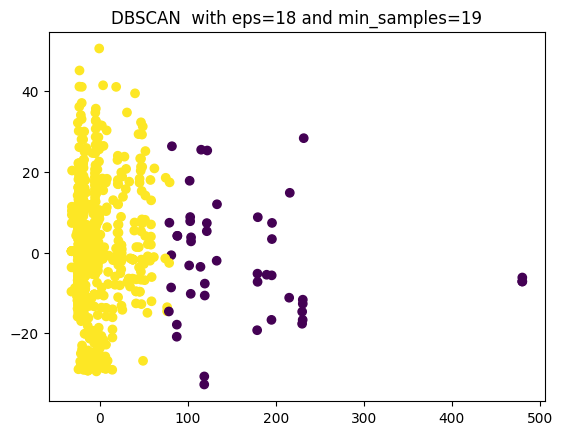

Silhouette Score for DBSCAN algorithm with 18 eps and 20 min samples: 0.799

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.595745  0.659574  0.978723  197.028189            0.0  \
 0  2.381517  29.430095  0.515403  0.348341   23.025621            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.659574  0.340426    0.489362    0.000000    0.510638  
 0    0.335308  0.664692    0.171801    0.091232    0.736967  


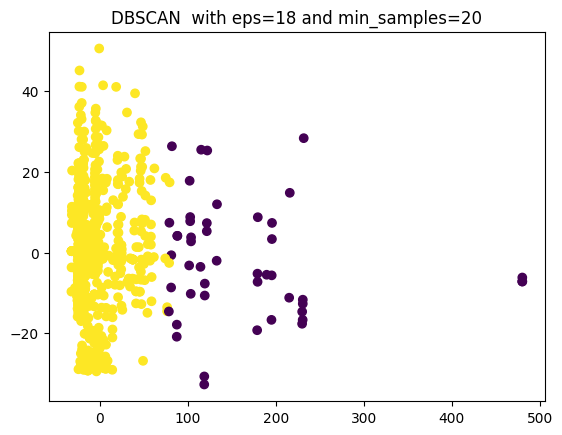

Silhouette Score for DBSCAN algorithm with 19 eps and 9 min samples: 0.785

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.133333  1.066667  1.533333  278.111667            0.0  \
 0  2.344867  29.512111  0.517878  0.361015   26.003325            0.0   
 1  1.000000  30.000000  0.111111  0.444444  219.710189            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.533333  0.466667    0.600000    0.000000    0.400000  
 0    0.346021  0.653979    0.177624    0.088812    0.733564  
 1    0.666667  0.333333    0.555556    0.000000    0.444444  


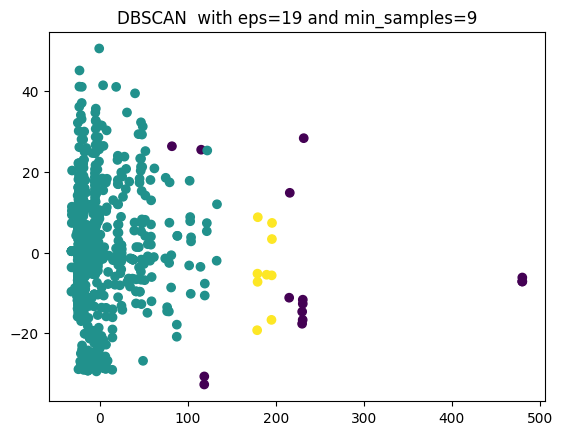

Silhouette Score for DBSCAN algorithm with 19 eps and 10 min samples: 0.832

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  30.708333  0.708333  1.125000  256.211113            0.0  \
 0  2.344867  29.512111  0.517878  0.361015   26.003325            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.583333  0.416667    0.583333    0.000000    0.416667  
 0    0.346021  0.653979    0.177624    0.088812    0.733564  


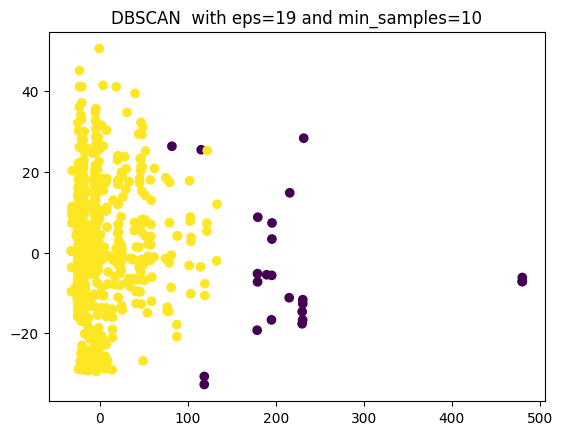

Silhouette Score for DBSCAN algorithm with 19 eps and 11 min samples: 0.828

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.307692  0.692308  1.115385  248.745996            0.0  \
 0  2.347977  29.461272  0.517919  0.359538   25.695437            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.615385  0.384615    0.538462    0.000000    0.461538  
 0    0.344509  0.655491    0.178035    0.089017    0.732948  


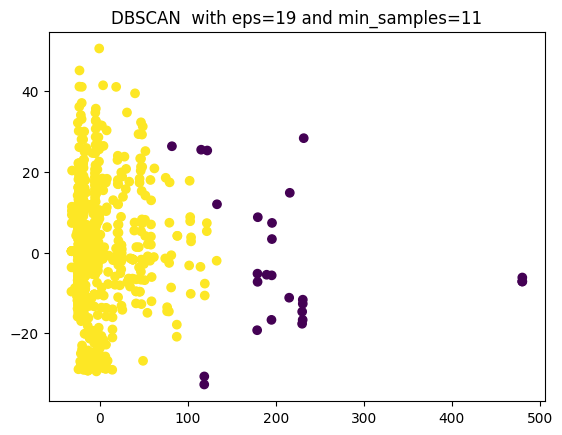

Silhouette Score for DBSCAN algorithm with 19 eps and 12 min samples: 0.828

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.307692  0.692308  1.115385  248.745996            0.0  \
 0  2.347977  29.461272  0.517919  0.359538   25.695437            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.615385  0.384615    0.538462    0.000000    0.461538  
 0    0.344509  0.655491    0.178035    0.089017    0.732948  


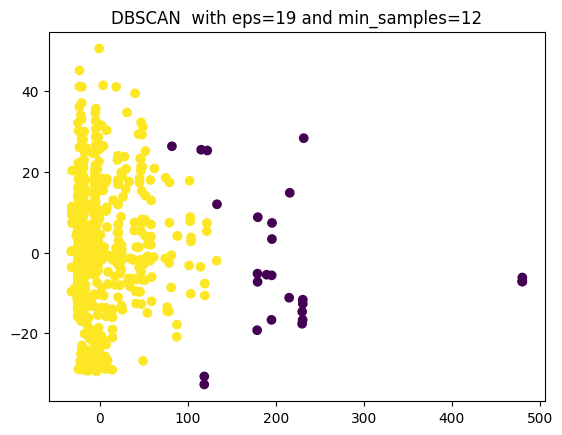

Silhouette Score for DBSCAN algorithm with 19 eps and 13 min samples: 0.818

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  30.600000  0.666667  1.166667  234.127087            0.0  \
 0  2.354239  29.507549  0.518002  0.354239   25.168568            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.633333  0.366667    0.466667    0.000000    0.533333  
 0    0.342625  0.657375    0.178862    0.089431    0.731707  


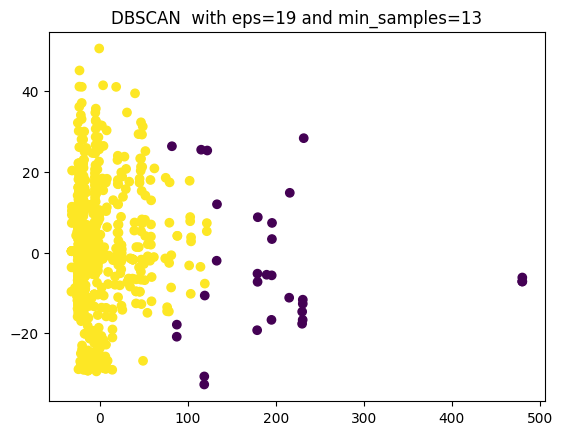

Silhouette Score for DBSCAN algorithm with 19 eps and 14 min samples: 0.808

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.780488  0.634146  0.951220  209.073373            0.0  \
 0  2.371765  29.436471  0.517647  0.354118   23.672872            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.658537  0.341463    0.463415    0.000000    0.536585  
 0    0.337647  0.662353    0.175294    0.090588    0.734118  


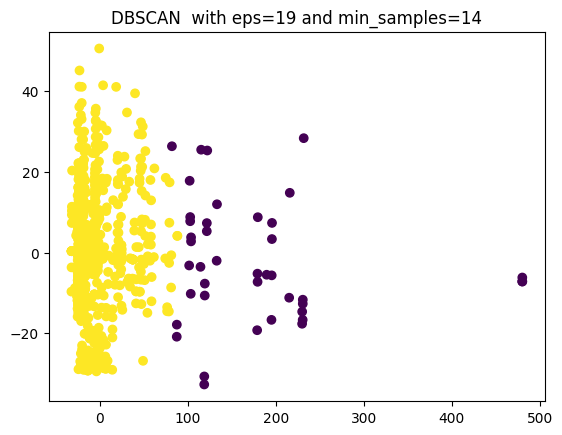

Silhouette Score for DBSCAN algorithm with 19 eps and 15 min samples: 0.808

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.780488  0.634146  0.951220  209.073373            0.0  \
 0  2.371765  29.436471  0.517647  0.354118   23.672872            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.658537  0.341463    0.463415    0.000000    0.536585  
 0    0.337647  0.662353    0.175294    0.090588    0.734118  


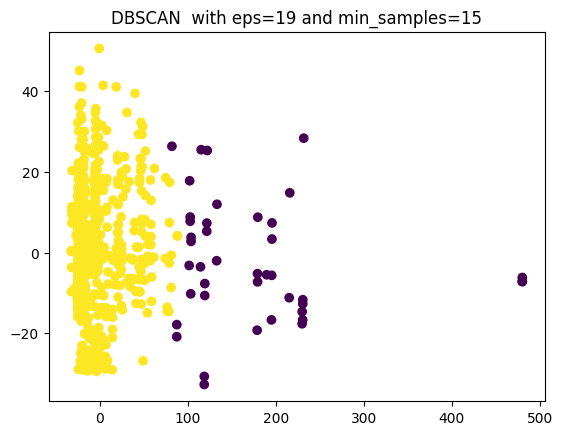

Silhouette Score for DBSCAN algorithm with 19 eps and 16 min samples: 0.808

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.780488  0.634146  0.951220  209.073373            0.0  \
 0  2.371765  29.436471  0.517647  0.354118   23.672872            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.658537  0.341463    0.463415    0.000000    0.536585  
 0    0.337647  0.662353    0.175294    0.090588    0.734118  


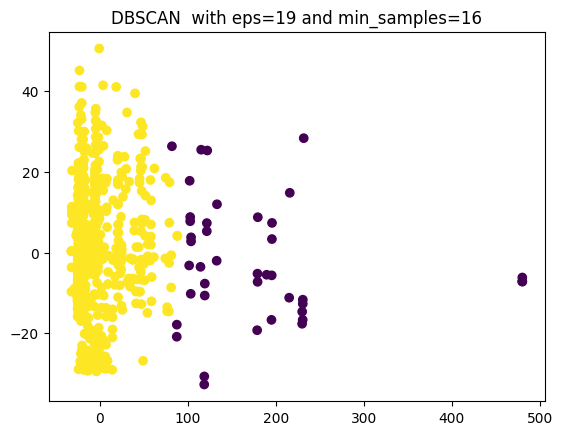

Silhouette Score for DBSCAN algorithm with 19 eps and 17 min samples: 0.808

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.780488  0.634146  0.951220  209.073373            0.0  \
 0  2.371765  29.436471  0.517647  0.354118   23.672872            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.658537  0.341463    0.463415    0.000000    0.536585  
 0    0.337647  0.662353    0.175294    0.090588    0.734118  


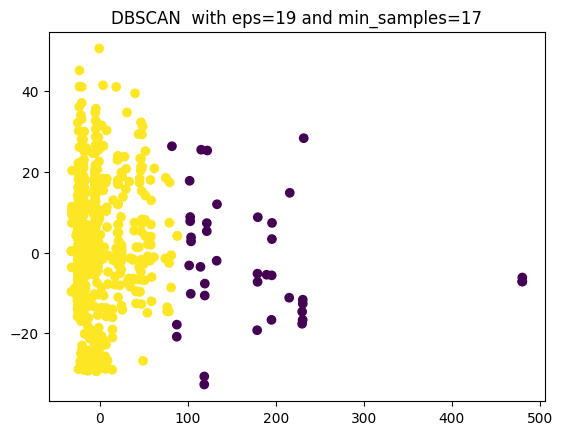

Silhouette Score for DBSCAN algorithm with 19 eps and 18 min samples: 0.799

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.595745  0.659574  0.978723  197.028189            0.0  \
 0  2.381517  29.430095  0.515403  0.348341   23.025621            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.659574  0.340426    0.489362    0.000000    0.510638  
 0    0.335308  0.664692    0.171801    0.091232    0.736967  


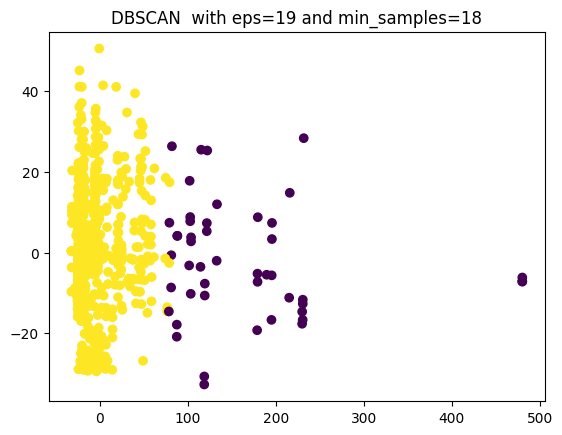

Silhouette Score for DBSCAN algorithm with 19 eps and 19 min samples: 0.799

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.595745  0.659574  0.978723  197.028189            0.0  \
 0  2.381517  29.430095  0.515403  0.348341   23.025621            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.659574  0.340426    0.489362    0.000000    0.510638  
 0    0.335308  0.664692    0.171801    0.091232    0.736967  


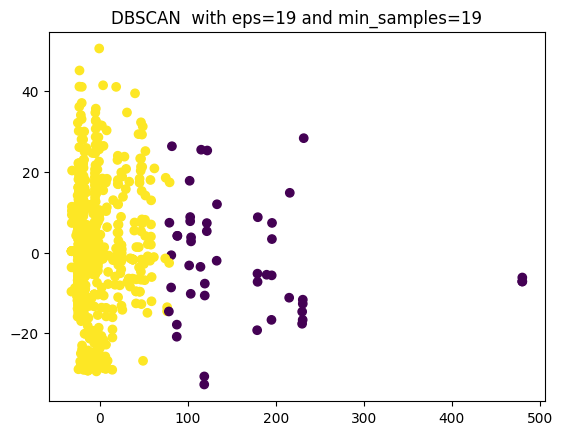

Silhouette Score for DBSCAN algorithm with 19 eps and 20 min samples: 0.799

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.595745  0.659574  0.978723  197.028189            0.0  \
 0  2.381517  29.430095  0.515403  0.348341   23.025621            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.659574  0.340426    0.489362    0.000000    0.510638  
 0    0.335308  0.664692    0.171801    0.091232    0.736967  


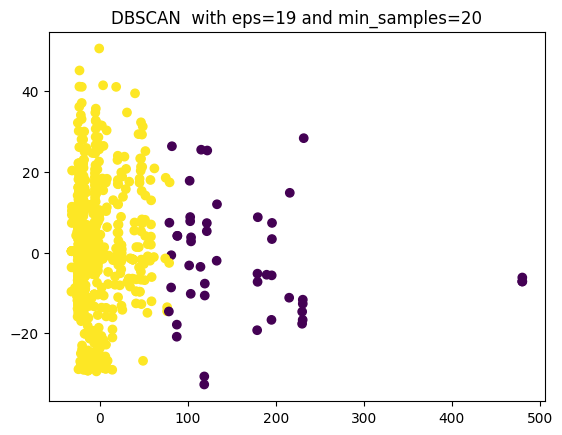

Silhouette Score for DBSCAN algorithm with 20 eps and 9 min samples: 0.785

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  27.000000  1.230769  1.615385  300.913785            0.0  \
 0  2.341772  29.577675  0.516686  0.362486   26.242438            0.0   
 1  1.000000  30.000000  0.111111  0.444444  219.710189            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.538462  0.461538    0.538462    0.000000    0.461538  
 0    0.346375  0.653625    0.179517    0.088608    0.731876  
 1    0.666667  0.333333    0.555556    0.000000    0.444444  


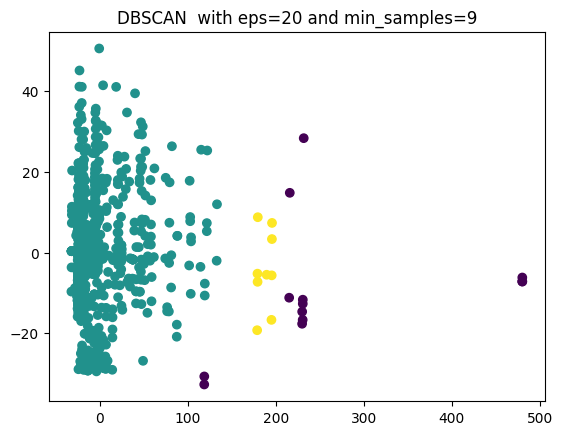

Silhouette Score for DBSCAN algorithm with 20 eps and 10 min samples: 0.840

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  28.227273  0.772727  1.136364  267.694132            0.0  \
 0  2.341772  29.577675  0.516686  0.362486   26.242438            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.590909  0.409091    0.545455    0.000000    0.454545  
 0    0.346375  0.653625    0.179517    0.088608    0.731876  


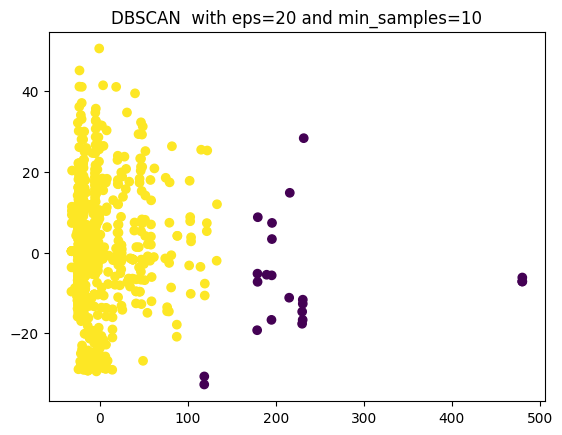

Silhouette Score for DBSCAN algorithm with 20 eps and 11 min samples: 0.840

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  28.227273  0.772727  1.136364  267.694132            0.0  \
 0  2.341772  29.577675  0.516686  0.362486   26.242438            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.590909  0.409091    0.545455    0.000000    0.454545  
 0    0.346375  0.653625    0.179517    0.088608    0.731876  


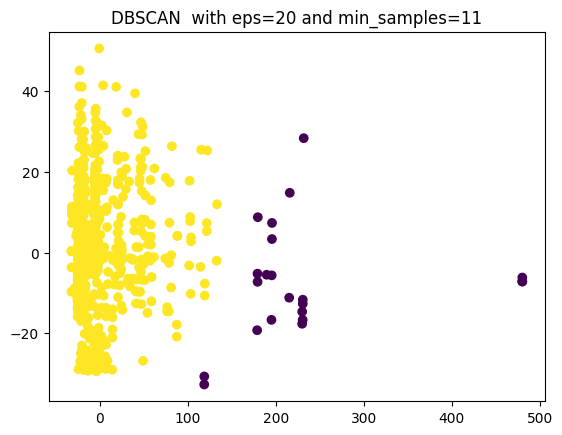

Silhouette Score for DBSCAN algorithm with 20 eps and 12 min samples: 0.835

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  29.521739  0.739130  1.173913  260.980257            0.0  \
 0  2.343318  29.544931  0.517281  0.360599   26.142170            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.565217  0.434783    0.565217     0.00000    0.434783  
 0    0.346774  0.653226    0.178571     0.08871    0.732719  


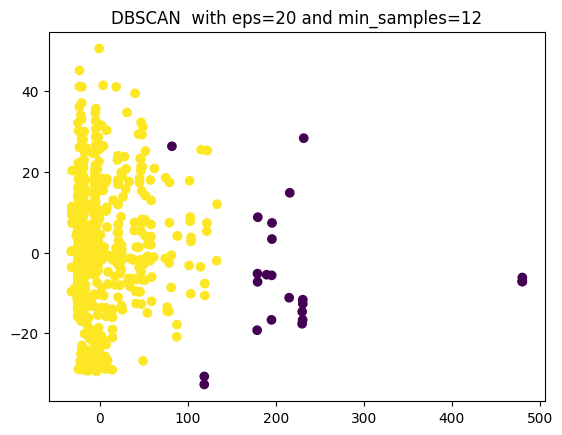

Silhouette Score for DBSCAN algorithm with 20 eps and 13 min samples: 0.830

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  28.750000  0.750000  1.208333  255.106079            0.0  \
 0  2.344867  29.566321  0.516724  0.358708   26.033914            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.541667  0.458333    0.541667    0.000000    0.458333  
 0    0.347174  0.652826    0.178777    0.088812    0.732411  


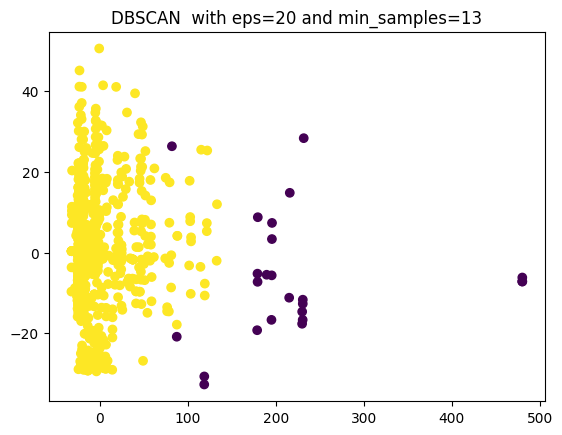

Silhouette Score for DBSCAN algorithm with 20 eps and 14 min samples: 0.813

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  30.628571  0.628571  1.085714  221.841191            0.0  \
 0  2.36215  29.500000  0.518692  0.352804   24.450359            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.628571  0.371429    0.457143    0.000000    0.542857  
 0    0.341121  0.658879    0.177570    0.089953    0.732477  


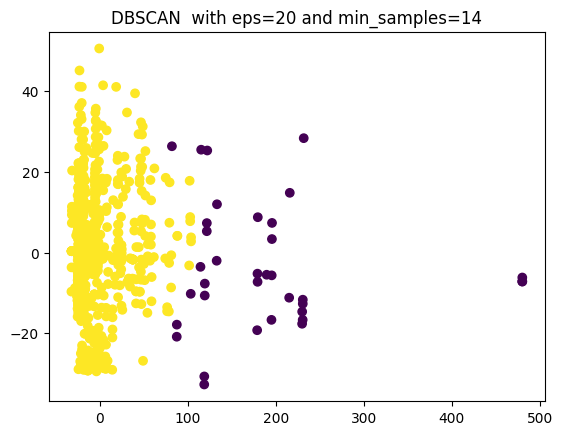

Silhouette Score for DBSCAN algorithm with 20 eps and 15 min samples: 0.813

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  30.628571  0.628571  1.085714  221.841191            0.0  \
 0  2.36215  29.500000  0.518692  0.352804   24.450359            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.628571  0.371429    0.457143    0.000000    0.542857  
 0    0.341121  0.658879    0.177570    0.089953    0.732477  


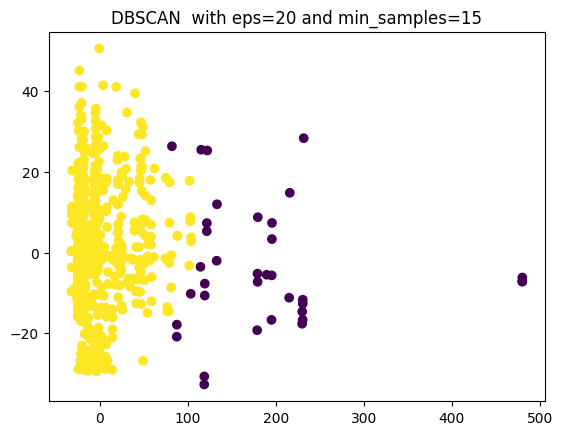

Silhouette Score for DBSCAN algorithm with 20 eps and 16 min samples: 0.808

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.780488  0.634146  0.951220  209.073373            0.0  \
 0  2.371765  29.436471  0.517647  0.354118   23.672872            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.658537  0.341463    0.463415    0.000000    0.536585  
 0    0.337647  0.662353    0.175294    0.090588    0.734118  


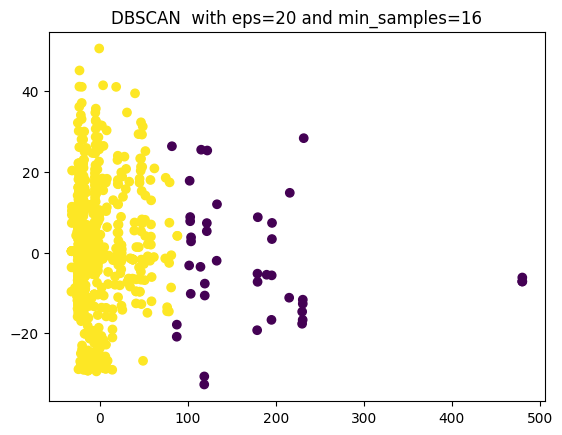

Silhouette Score for DBSCAN algorithm with 20 eps and 17 min samples: 0.808

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.780488  0.634146  0.951220  209.073373            0.0  \
 0  2.371765  29.436471  0.517647  0.354118   23.672872            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.658537  0.341463    0.463415    0.000000    0.536585  
 0    0.337647  0.662353    0.175294    0.090588    0.734118  


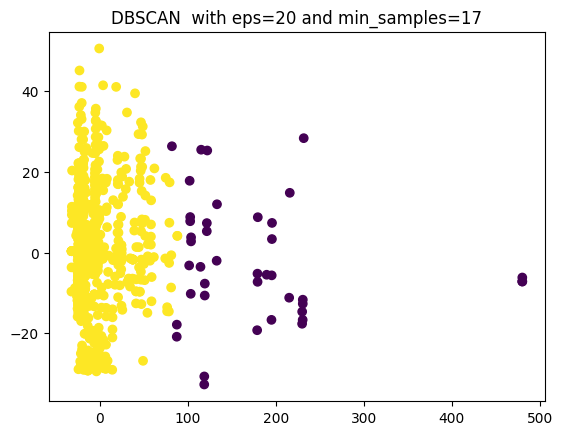

Silhouette Score for DBSCAN algorithm with 20 eps and 18 min samples: 0.808

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.780488  0.634146  0.951220  209.073373            0.0  \
 0  2.371765  29.436471  0.517647  0.354118   23.672872            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.658537  0.341463    0.463415    0.000000    0.536585  
 0    0.337647  0.662353    0.175294    0.090588    0.734118  


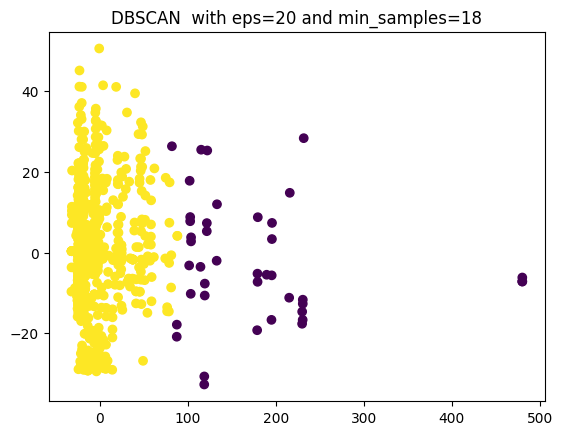

Silhouette Score for DBSCAN algorithm with 20 eps and 19 min samples: 0.808

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.780488  0.634146  0.951220  209.073373            0.0  \
 0  2.371765  29.436471  0.517647  0.354118   23.672872            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.658537  0.341463    0.463415    0.000000    0.536585  
 0    0.337647  0.662353    0.175294    0.090588    0.734118  


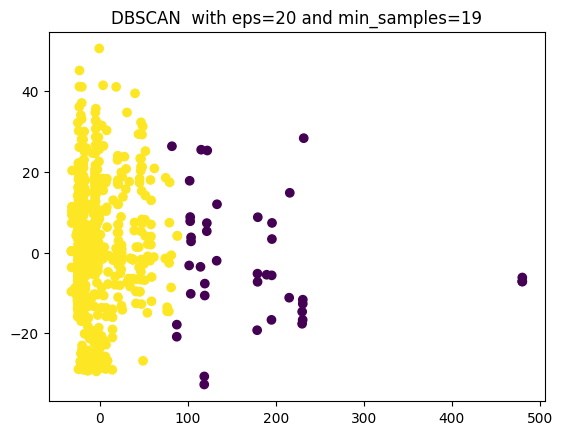

Silhouette Score for DBSCAN algorithm with 20 eps and 20 min samples: 0.802

Clusters grouping data
       Pclass        Age     SibSp   Parch        Fare  Cabin_unknown   
-1  1.000000  31.444444  0.644444  1.0000  200.803702            0.0  \
 0  2.378251  29.443262  0.516548  0.3487   23.236150            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.644444  0.355556    0.466667    0.000000    0.533333  
 0    0.336879  0.663121    0.173759    0.091017    0.735225  


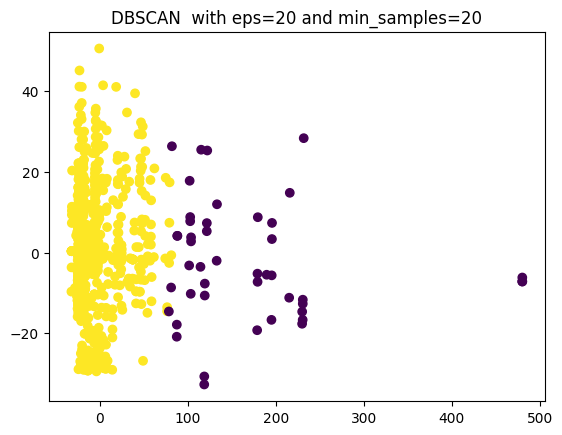

In [42]:
for eps in range (9, 21):
    for min_s in range (9, 21):
        labels = cluster_data(train_data, algorithm='DBSCAN', eps=eps, min_s=min_s)
        plt.scatter(train_pca[:, 0], train_pca[:, 1], c=labels)
        plt.title(f"DBSCAN  with eps={eps} and min_samples={min_s}")
        plt.show()

In [43]:
for eps in range (9, 21):
    for min_s in range (9, 21):
        labels = cluster_data(train_data, algorithm='DBSCAN', eps=eps, min_s=min_s)

Silhouette Score for DBSCAN algorithm with 9 eps and 9 min samples: 0.769

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.590164  0.622951  0.852459  170.923223            0.0  \
 0  2.404819  29.173494  0.515663  0.346988   22.009196            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.590164  0.409836    0.540984    0.000000    0.459016  
 0    0.334940  0.665060    0.162651    0.092771    0.744578  
Silhouette Score for DBSCAN algorithm with 9 eps and 10 min samples: 0.769

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.590164  0.622951  0.852459  170.923223            0.0  \
 0  2.404819  29.173494  0.515663  0.346988   22.009196            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.590164  0.409836    0.540984    0.000000    0.459016  
 0    0.334940  0.665060    0.162651    

Silhouette Score for DBSCAN algorithm with 10 eps and 10 min samples: 0.771

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.850000  0.616667  0.866667  172.253957            0.0  \
 0  2.403129  29.161252  0.516245  0.346570   22.092313            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.583333  0.416667    0.533333    0.000000    0.466667  
 0    0.335740  0.664260    0.163658    0.092659    0.743682  
Silhouette Score for DBSCAN algorithm with 10 eps and 11 min samples: 0.771

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  34.850000  0.616667  0.866667  172.253957            0.0  \
 0  2.403129  29.161252  0.516245  0.346570   22.092313            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.583333  0.416667    0.533333    0.000000    0.466667  
 0    0.335740  0.664260    0.163658 

Silhouette Score for DBSCAN algorithm with 11 eps and 16 min samples: 0.758

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.030303  37.106061  0.606061  0.833333  163.351702            0.0  \
 0  2.410909  28.939394  0.516364  0.345455   21.712408            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.590909  0.409091    0.515152    0.000000    0.484848  
 0    0.333333  0.666667    0.162424    0.093333    0.744242  
Silhouette Score for DBSCAN algorithm with 11 eps and 17 min samples: 0.742

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.067568  39.067568  0.635135  0.756757  152.604165            0.0  \
 0  2.421053  28.681763  0.512852  0.347613   21.298949            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.567568  0.432432    0.500000    0.027027    0.472973  
 0    0.332925  0.667075    0.160343 

Silhouette Score for DBSCAN algorithm with 13 eps and 10 min samples: 0.599

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  33.847826  0.608696  0.913043  194.579980            0.0  \
 0  2.396407  29.330539  0.516168  0.348503   22.299216            0.0   
 1  1.000000  27.600000  0.700000  0.700000  112.342490            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586957  0.413043    0.478261    0.000000    0.521739  
 0    0.335329  0.664671    0.165269    0.092216    0.742515  
 1    0.700000  0.300000    0.800000    0.000000    0.200000  
Silhouette Score for DBSCAN algorithm with 13 eps and 11 min samples: 0.782

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.732143  0.625000  0.875000  179.894714            0.0  \
 0  2.396407  29.330539  0.516168  0.348503   22.299216            0.0   

    Sex_female  Sex_male  

Silhouette Score for DBSCAN algorithm with 14 eps and 16 min samples: 0.776

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  33.931034  0.620690  0.879310  175.984193            0.0  \
 0  2.39976  29.238896  0.516206  0.346939   22.193117            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.534483    0.000000    0.465517  
 0    0.336134  0.663866    0.164466    0.092437    0.743097  
Silhouette Score for DBSCAN algorithm with 14 eps and 17 min samples: 0.776

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.00000  33.931034  0.620690  0.879310  175.984193            0.0  \
 0  2.39976  29.238896  0.516206  0.346939   22.193117            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.534483    0.000000    0.465517  
 0    0.336134  0.663866    0.164466    0.0

Silhouette Score for DBSCAN algorithm with 16 eps and 10 min samples: 0.821

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  32.129032  0.612903  1.096774  233.622181            0.0  \
 0  2.355814  29.451163  0.519767  0.355814   24.943793            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.645161  0.354839    0.451613    0.000000    0.548387  
 0    0.341860  0.658140    0.179070    0.089535    0.731395  
Silhouette Score for DBSCAN algorithm with 16 eps and 11 min samples: 0.817

Clusters grouping data
      Pclass        Age     SibSp    Parch        Fare  Cabin_unknown   
-1  1.00000  32.264706  0.647059  1.00000  225.237991            0.0  \
 0  2.36056  29.436406  0.518086  0.35706   24.545925            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.617647  0.382353    0.470588    0.000000    0.529412  
 0    0.341890  0.658110    0.177363    0.0

Silhouette Score for DBSCAN algorithm with 17 eps and 14 min samples: 0.794

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.333333  0.666667  0.921569  190.193951            0.0  \
 0  2.388095  29.435714  0.514286  0.348810   22.611974            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.647059  0.352941    0.529412    0.000000    0.470588  
 0    0.334524  0.665476    0.167857    0.091667    0.740476  
Silhouette Score for DBSCAN algorithm with 17 eps and 15 min samples: 0.794

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.333333  0.666667  0.921569  190.193951            0.0  \
 0  2.388095  29.435714  0.514286  0.348810   22.611974            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.647059  0.352941    0.529412    0.000000    0.470588  
 0    0.334524  0.665476    0.167857 

Silhouette Score for DBSCAN algorithm with 18 eps and 18 min samples: 0.799

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.595745  0.659574  0.978723  197.028189            0.0  \
 0  2.381517  29.430095  0.515403  0.348341   23.025621            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.659574  0.340426    0.489362    0.000000    0.510638  
 0    0.335308  0.664692    0.171801    0.091232    0.736967  
Silhouette Score for DBSCAN algorithm with 18 eps and 19 min samples: 0.799

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  31.595745  0.659574  0.978723  197.028189            0.0  \
 0  2.381517  29.430095  0.515403  0.348341   23.025621            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.659574  0.340426    0.489362    0.000000    0.510638  
 0    0.335308  0.664692    0.171801 

Silhouette Score for DBSCAN algorithm with 20 eps and 11 min samples: 0.840

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  28.227273  0.772727  1.136364  267.694132            0.0  \
 0  2.341772  29.577675  0.516686  0.362486   26.242438            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.590909  0.409091    0.545455    0.000000    0.454545  
 0    0.346375  0.653625    0.179517    0.088608    0.731876  
Silhouette Score for DBSCAN algorithm with 20 eps and 12 min samples: 0.835

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  29.521739  0.739130  1.173913  260.980257            0.0  \
 0  2.343318  29.544931  0.517281  0.360599   26.142170            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.565217  0.434783    0.565217     0.00000    0.434783  
 0    0.346774  0.653226    0.178571 

Найкращий результат 0,840 при значеннях 20 eps and 11 min samples, що майже дістає до найкращого результату агломеративної кластеризації 

тепер подивимося на результати на тестовому наборі

K-means

C:\Users\oxygen\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score for KMeans algorithm with 2 clusters: 0.826

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  2.359897  29.395887  0.429306  0.359897   22.444784            0.0  \
1  1.000000  40.862069  0.689655  0.827586  211.723138            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.347044  0.652956    0.213368    0.118252    0.668380  
1    0.586207  0.413793    0.655172    0.000000    0.344828  


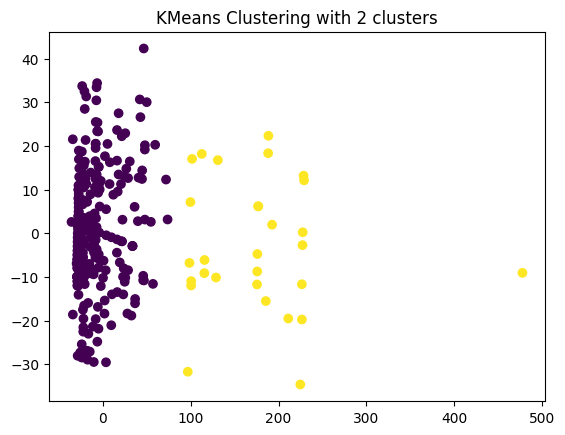

C:\Users\oxygen\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score for KMeans algorithm with 3 clusters: 0.671

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  2.523810  28.080357  0.354167  0.276786   15.135553            0.0  \
1  1.000000  43.750000  0.750000  0.950000  243.882925            0.0   
2  1.274194  37.258065  0.854839  0.838710   79.157865            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.324405  0.675595    0.175595    0.133929    0.690476  
1    0.650000  0.350000    0.600000    0.000000    0.400000  
2    0.483871  0.516129    0.500000    0.016129    0.483871  


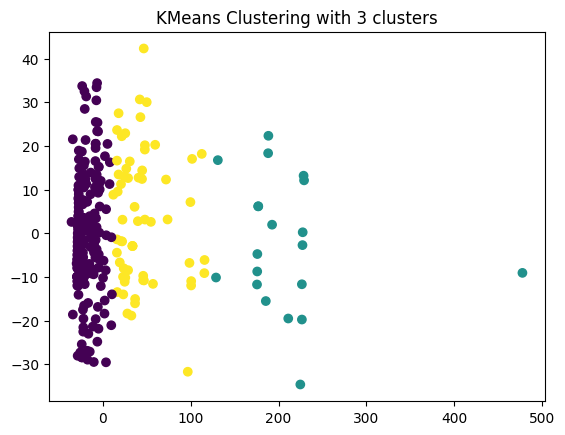

C:\Users\oxygen\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score for KMeans algorithm with 4 clusters: 0.659

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  2.537538  28.051051  0.357357  0.279279   14.866504            0.0  \
1  1.000000  42.590909  0.772727  0.909091  218.861368            0.0   
2  1.274194  36.838710  0.822581  0.806452   74.083335            0.0   
3  1.000000  58.000000  0.000000  1.000000  512.329200            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.327327  0.672673    0.177177    0.135135    0.687688  
1    0.590909  0.409091    0.545455    0.000000    0.454545  
2    0.467742  0.532258    0.483871    0.016129    0.500000  
3    1.000000  0.000000    1.000000    0.000000    0.000000  


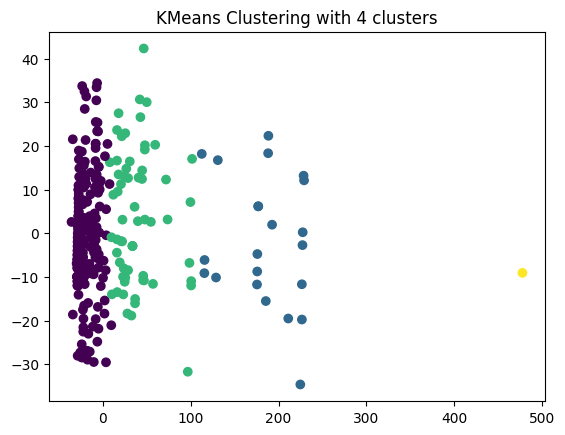

In [44]:
pca = PCA(n_components=2)
test_pca = pca.fit_transform(test_data)

for n_clusters in range(2, 5):
    labels = cluster_data(test_data, algorithm='KMeans', n_clusters=n_clusters)
    plt.scatter(test_pca[:, 0], test_pca[:, 1], c=labels)
    plt.title(f"KMeans Clustering with {n_clusters} clusters")
    plt.show()

тепер отримали трошки більше значення, ніж на тренувальному наборі -- 0.826

Agglomerative

Silhouette Score for Agglomerative algorithm with 2 clusters: 0.835

Clusters grouping data
    Pclass        Age     SibSp  Parch        Fare  Cabin_unknown  Sex_female   
0  2.3225  29.580000  0.432500  0.365   25.807667            0.0    0.350000  \
1  1.0000  43.777778  0.777778  1.000  252.662506            0.0    0.666667   

   Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0  0.650000    0.225000       0.115    0.660000  
1  0.333333    0.666667       0.000    0.333333  


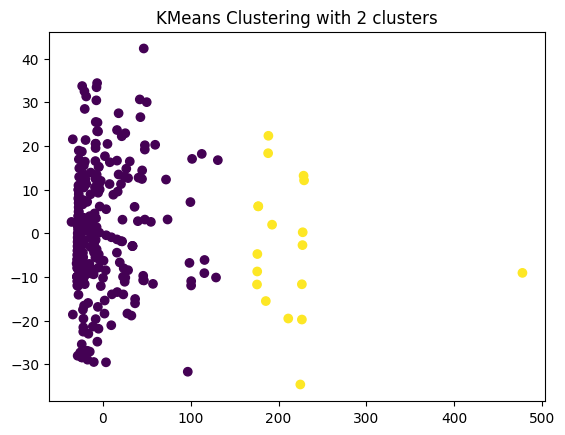

Silhouette Score for Agglomerative algorithm with 3 clusters: 0.677

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  1.000000  43.777778  0.777778  1.000000  252.662506            0.0  \
1  1.269841  37.761905  0.841270  0.841270   82.292397            0.0   
2  2.519288  28.050445  0.356083  0.275964   15.248207            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.666667  0.333333    0.666667    0.000000    0.333333  
1    0.476190  0.523810    0.492063    0.015873    0.492063  
2    0.326409  0.673591    0.175074    0.133531    0.691395  


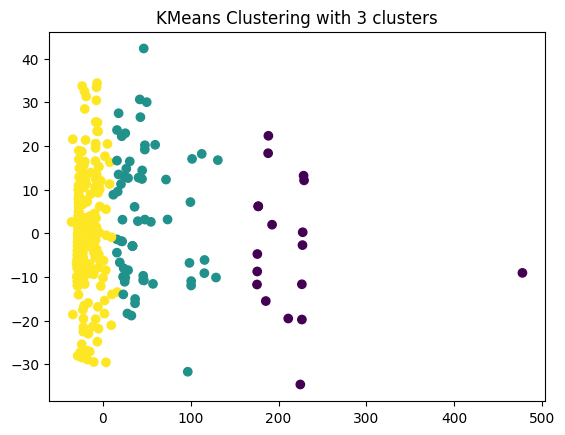

Silhouette Score for Agglomerative algorithm with 4 clusters: 0.677

Clusters grouping data
      Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
0  1.269841  37.761905  0.841270  0.841270   82.292397            0.0  \
1  1.000000  42.941176  0.823529  1.000000  237.387994            0.0   
2  2.519288  28.050445  0.356083  0.275964   15.248207            0.0   
3  1.000000  58.000000  0.000000  1.000000  512.329200            0.0   

   Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
0    0.476190  0.523810    0.492063    0.015873    0.492063  
1    0.647059  0.352941    0.647059    0.000000    0.352941  
2    0.326409  0.673591    0.175074    0.133531    0.691395  
3    1.000000  0.000000    1.000000    0.000000    0.000000  


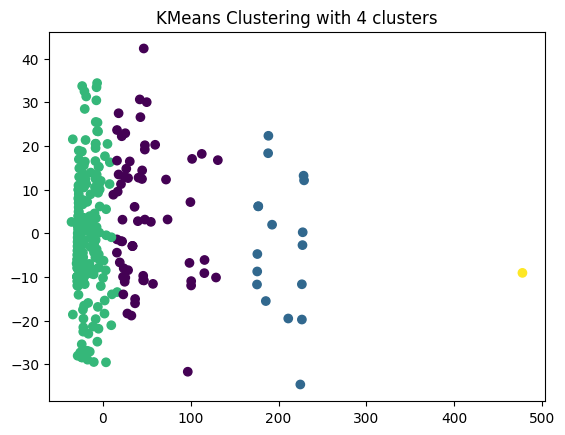

In [45]:
for n_clusters in range(2, 5):
    labels = cluster_data(test_data, algorithm='Agglomerative', n_clusters=n_clusters)
    plt.scatter(test_pca[:, 0], test_pca[:, 1], c=labels)
    plt.title(f"KMeans Clustering with {n_clusters} clusters")
    plt.show()

тут результат трошки гірший, але в цілому теж саме, що і на тренувальному наборі

DBSCAN

Silhouette Score for DBSCAN algorithm with 18 eps and 9 min samples: 0.821

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  41.032258  0.677419  0.774194  205.009548            0.0  \
 0  2.366925  29.322997  0.428941  0.361757   22.004382            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.612903  0.387097    0.677419    0.000000    0.322581  
 0    0.343669  0.656331    0.209302    0.118863    0.671835  


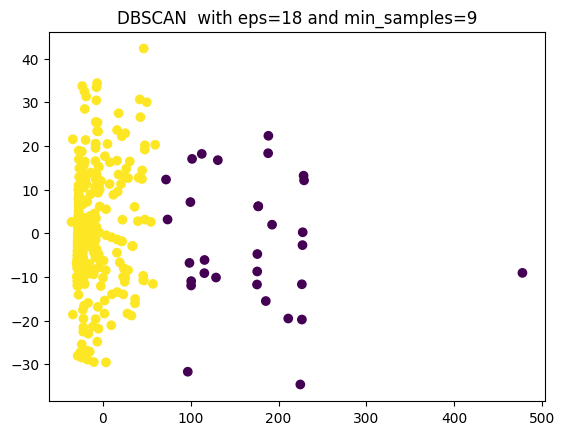

Silhouette Score for DBSCAN algorithm with 18 eps and 10 min samples: 0.821

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  41.032258  0.677419  0.774194  205.009548            0.0  \
 0  2.366925  29.322997  0.428941  0.361757   22.004382            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.612903  0.387097    0.677419    0.000000    0.322581  
 0    0.343669  0.656331    0.209302    0.118863    0.671835  


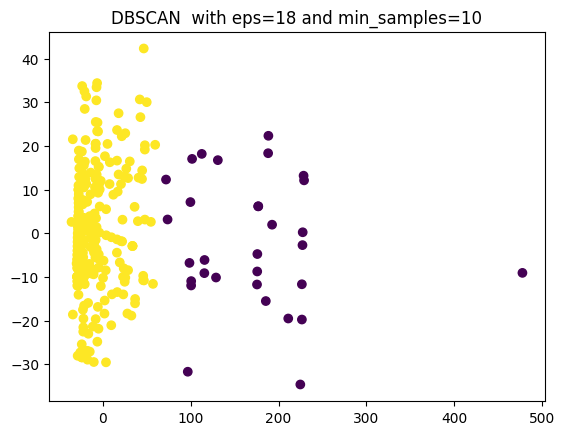

Silhouette Score for DBSCAN algorithm with 18 eps and 11 min samples: 0.821

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  41.032258  0.677419  0.774194  205.009548            0.0  \
 0  2.366925  29.322997  0.428941  0.361757   22.004382            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.612903  0.387097    0.677419    0.000000    0.322581  
 0    0.343669  0.656331    0.209302    0.118863    0.671835  


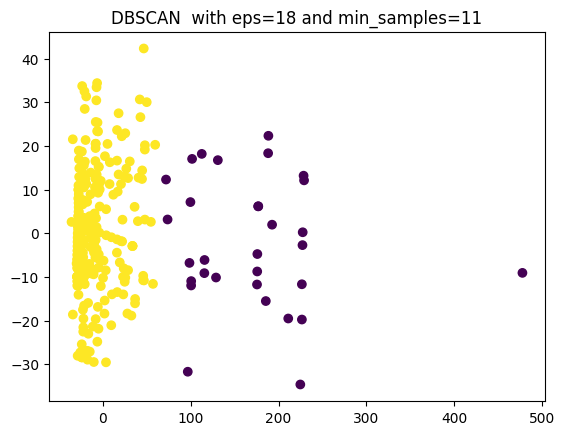

Silhouette Score for DBSCAN algorithm with 18 eps and 12 min samples: 0.816

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.125000  0.687500  0.750000  201.067062            0.0  \
 0  2.370466  29.202073  0.427461  0.362694   21.857113            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.625000  0.375000    0.656250    0.000000    0.343750  
 0    0.341969  0.658031    0.209845    0.119171    0.670984  


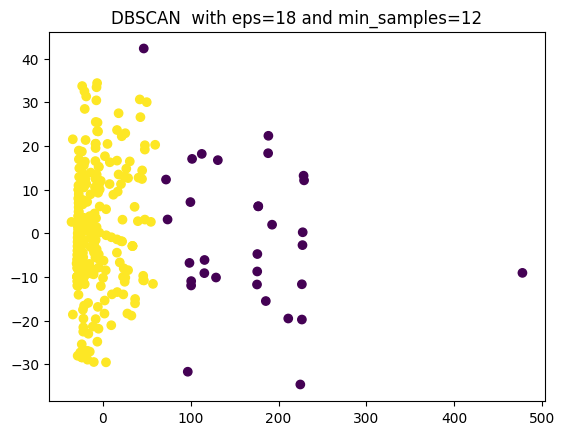

Silhouette Score for DBSCAN algorithm with 18 eps and 13 min samples: 0.816

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.125000  0.687500  0.750000  201.067062            0.0  \
 0  2.370466  29.202073  0.427461  0.362694   21.857113            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.625000  0.375000    0.656250    0.000000    0.343750  
 0    0.341969  0.658031    0.209845    0.119171    0.670984  


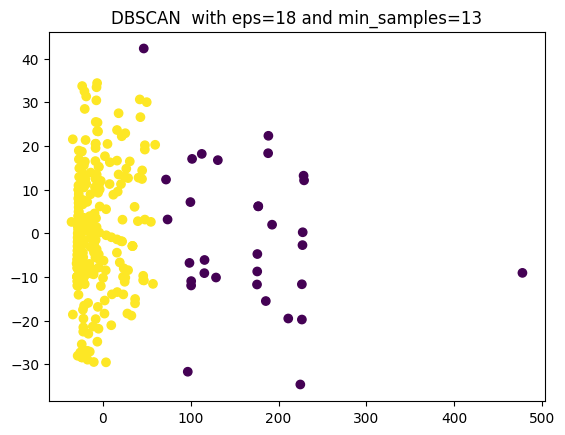

Silhouette Score for DBSCAN algorithm with 18 eps and 14 min samples: 0.816

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.125000  0.687500  0.750000  201.067062            0.0  \
 0  2.370466  29.202073  0.427461  0.362694   21.857113            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.625000  0.375000    0.656250    0.000000    0.343750  
 0    0.341969  0.658031    0.209845    0.119171    0.670984  


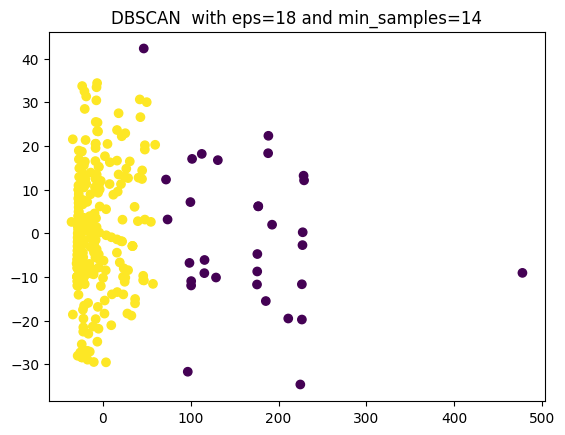

Silhouette Score for DBSCAN algorithm with 18 eps and 15 min samples: 0.816

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.125000  0.687500  0.750000  201.067062            0.0  \
 0  2.370466  29.202073  0.427461  0.362694   21.857113            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.625000  0.375000    0.656250    0.000000    0.343750  
 0    0.341969  0.658031    0.209845    0.119171    0.670984  


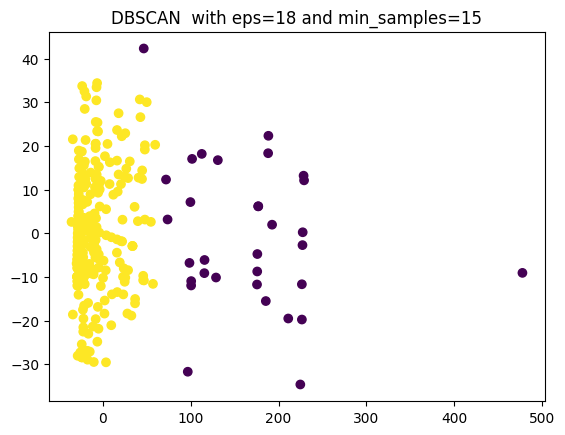

Silhouette Score for DBSCAN algorithm with 18 eps and 16 min samples: 0.804

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  43.742857  0.685714  0.771429  191.030123            0.0  \
 0  2.381201  28.953003  0.425587  0.357702   21.370594            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.657143    0.000000    0.342857  
 0    0.342037  0.657963    0.206266    0.120104    0.673629  


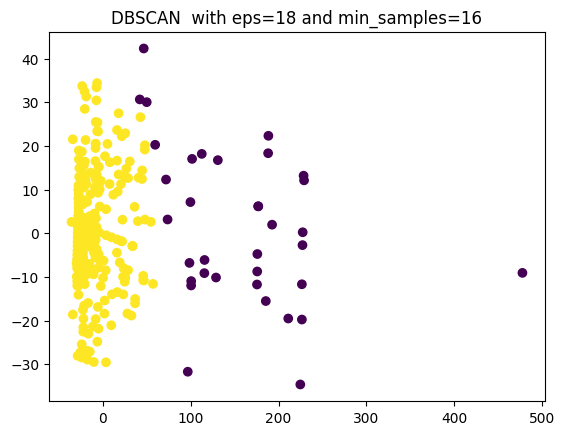

Silhouette Score for DBSCAN algorithm with 18 eps and 17 min samples: 0.800

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  43.166667  0.666667  0.750000  188.320953            0.0  \
 0  2.384817  28.968586  0.426702  0.358639   21.181774            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.583333  0.416667    0.638889    0.000000    0.361111  
 0    0.342932  0.657068    0.206806    0.120419    0.672775  


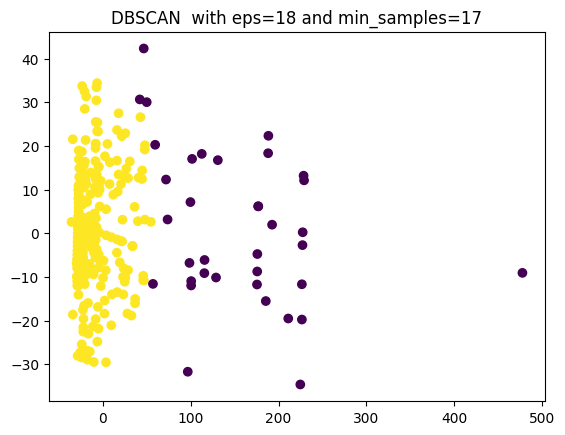

Silhouette Score for DBSCAN algorithm with 18 eps and 18 min samples: 0.800

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  43.166667  0.666667  0.750000  188.320953            0.0  \
 0  2.384817  28.968586  0.426702  0.358639   21.181774            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.583333  0.416667    0.638889    0.000000    0.361111  
 0    0.342932  0.657068    0.206806    0.120419    0.672775  


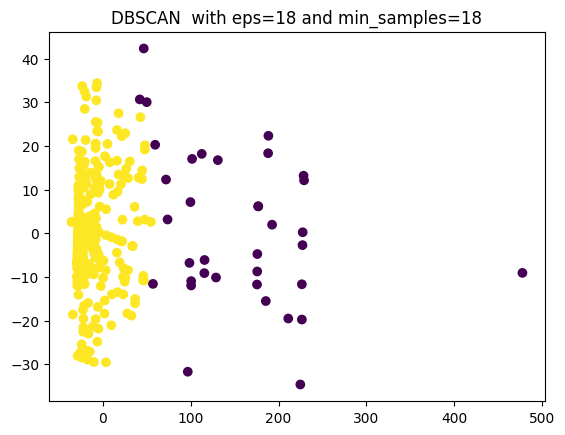

Silhouette Score for DBSCAN algorithm with 18 eps and 19 min samples: 0.797

Clusters grouping data
       Pclass        Age     SibSp    Parch        Fare  Cabin_unknown   
-1  1.000000  43.000000  0.675676  0.72973  185.663630            0.0  \
 0  2.388451  28.947507  0.425197  0.35958   21.001148            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.594595  0.405405    0.621622    0.027027    0.351351  
 0    0.341207  0.658793    0.207349    0.118110    0.674541  


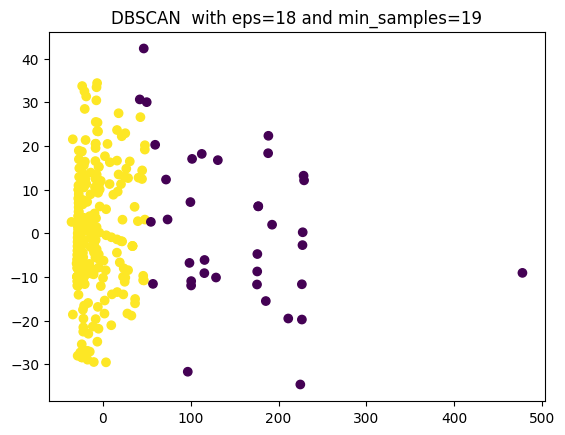

Silhouette Score for DBSCAN algorithm with 18 eps and 20 min samples: 0.797

Clusters grouping data
       Pclass        Age     SibSp    Parch        Fare  Cabin_unknown   
-1  1.000000  43.000000  0.675676  0.72973  185.663630            0.0  \
 0  2.388451  28.947507  0.425197  0.35958   21.001148            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.594595  0.405405    0.621622    0.027027    0.351351  
 0    0.341207  0.658793    0.207349    0.118110    0.674541  


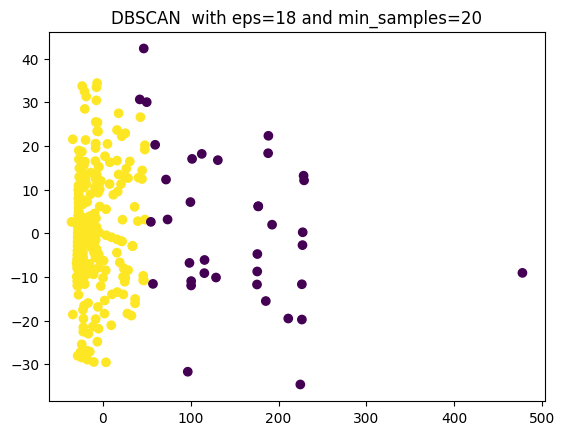

Silhouette Score for DBSCAN algorithm with 19 eps and 9 min samples: 0.824

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  40.800000  0.666667  0.800000  208.295700            0.0  \
 0  2.363402  29.371134  0.430412  0.360825   22.221961            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.666667    0.000000    0.333333  
 0    0.345361  0.654639    0.211340    0.118557    0.670103  


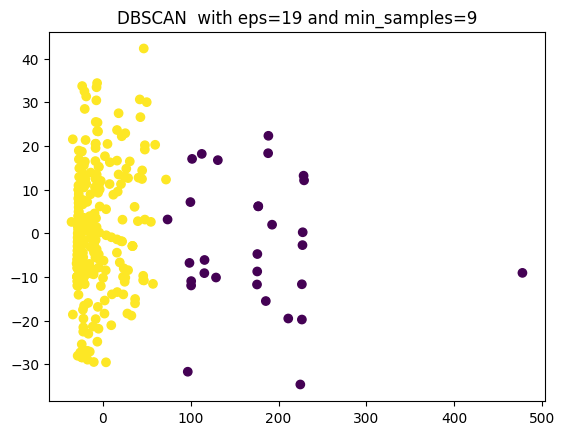

Silhouette Score for DBSCAN algorithm with 19 eps and 10 min samples: 0.821

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  41.032258  0.677419  0.774194  205.009548            0.0  \
 0  2.366925  29.322997  0.428941  0.361757   22.004382            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.612903  0.387097    0.677419    0.000000    0.322581  
 0    0.343669  0.656331    0.209302    0.118863    0.671835  


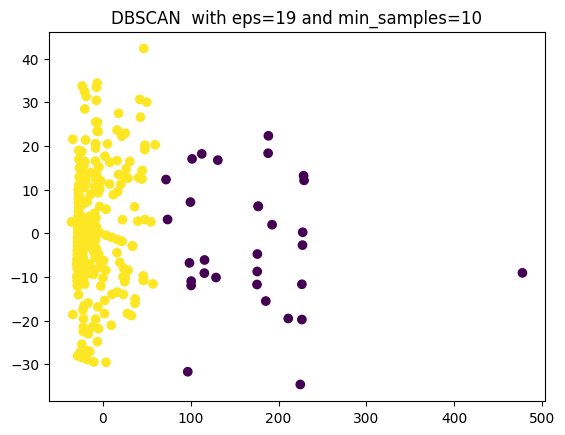

Silhouette Score for DBSCAN algorithm with 19 eps and 11 min samples: 0.821

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  41.032258  0.677419  0.774194  205.009548            0.0  \
 0  2.366925  29.322997  0.428941  0.361757   22.004382            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.612903  0.387097    0.677419    0.000000    0.322581  
 0    0.343669  0.656331    0.209302    0.118863    0.671835  


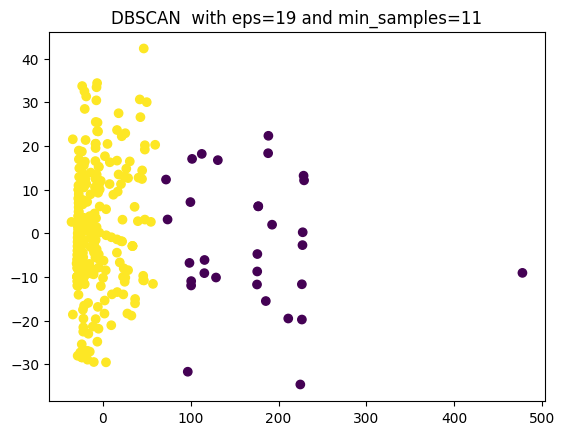

Silhouette Score for DBSCAN algorithm with 19 eps and 12 min samples: 0.821

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  41.032258  0.677419  0.774194  205.009548            0.0  \
 0  2.366925  29.322997  0.428941  0.361757   22.004382            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.612903  0.387097    0.677419    0.000000    0.322581  
 0    0.343669  0.656331    0.209302    0.118863    0.671835  


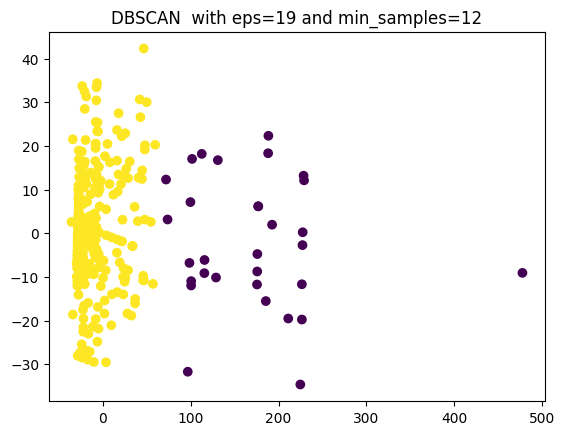

Silhouette Score for DBSCAN algorithm with 19 eps and 13 min samples: 0.816

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.125000  0.687500  0.750000  201.067062            0.0  \
 0  2.370466  29.202073  0.427461  0.362694   21.857113            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.625000  0.375000    0.656250    0.000000    0.343750  
 0    0.341969  0.658031    0.209845    0.119171    0.670984  


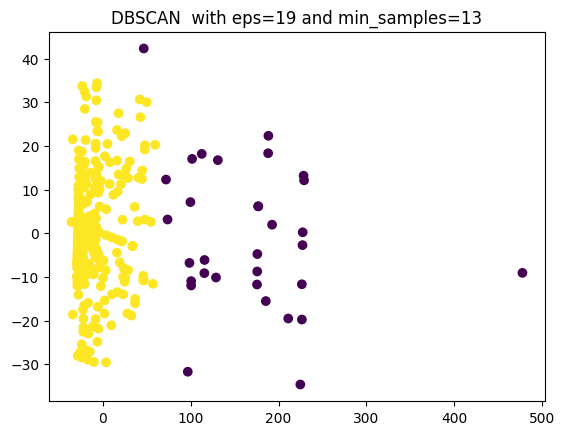

Silhouette Score for DBSCAN algorithm with 19 eps and 14 min samples: 0.816

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.125000  0.687500  0.750000  201.067062            0.0  \
 0  2.370466  29.202073  0.427461  0.362694   21.857113            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.625000  0.375000    0.656250    0.000000    0.343750  
 0    0.341969  0.658031    0.209845    0.119171    0.670984  


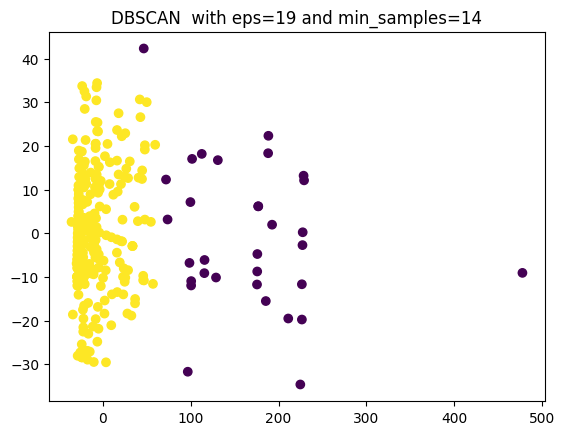

Silhouette Score for DBSCAN algorithm with 19 eps and 15 min samples: 0.816

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.125000  0.687500  0.750000  201.067062            0.0  \
 0  2.370466  29.202073  0.427461  0.362694   21.857113            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.625000  0.375000    0.656250    0.000000    0.343750  
 0    0.341969  0.658031    0.209845    0.119171    0.670984  


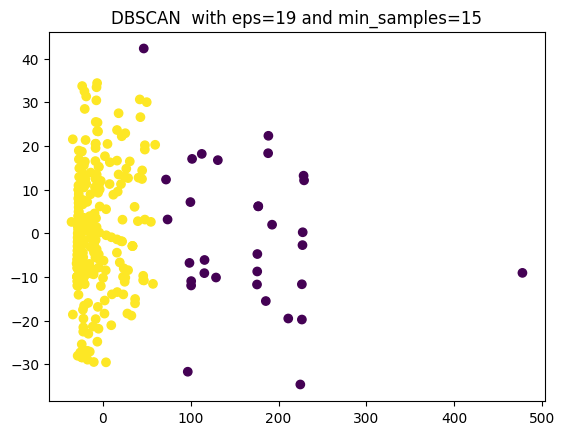

Silhouette Score for DBSCAN algorithm with 19 eps and 16 min samples: 0.816

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.125000  0.687500  0.750000  201.067062            0.0  \
 0  2.370466  29.202073  0.427461  0.362694   21.857113            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.625000  0.375000    0.656250    0.000000    0.343750  
 0    0.341969  0.658031    0.209845    0.119171    0.670984  


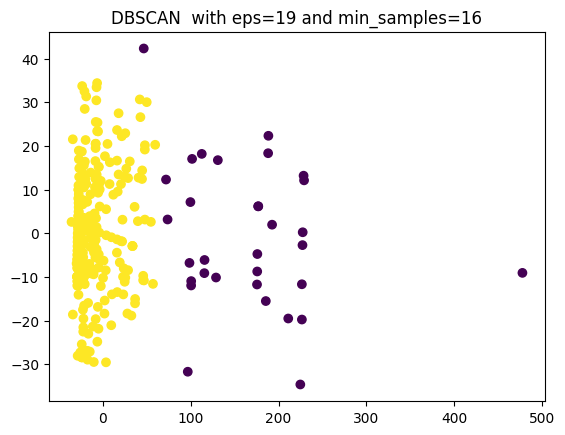

Silhouette Score for DBSCAN algorithm with 19 eps and 17 min samples: 0.805

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.571429  0.657143  0.771429  191.551551            0.0  \
 0  2.381201  29.060052  0.428198  0.357702   21.322944            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.628571    0.000000    0.371429  
 0    0.342037  0.657963    0.208877    0.120104    0.671018  


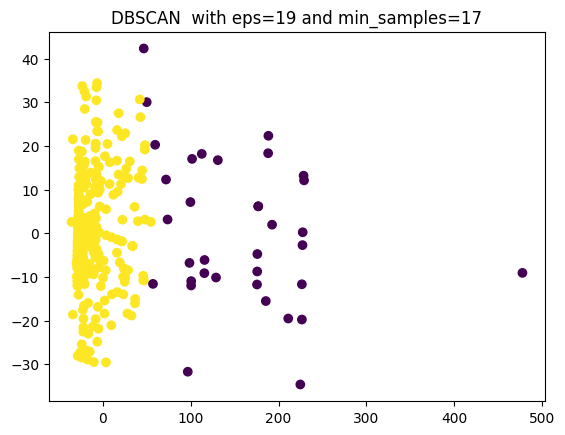

Silhouette Score for DBSCAN algorithm with 19 eps and 18 min samples: 0.805

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.571429  0.657143  0.771429  191.551551            0.0  \
 0  2.381201  29.060052  0.428198  0.357702   21.322944            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.628571    0.000000    0.371429  
 0    0.342037  0.657963    0.208877    0.120104    0.671018  


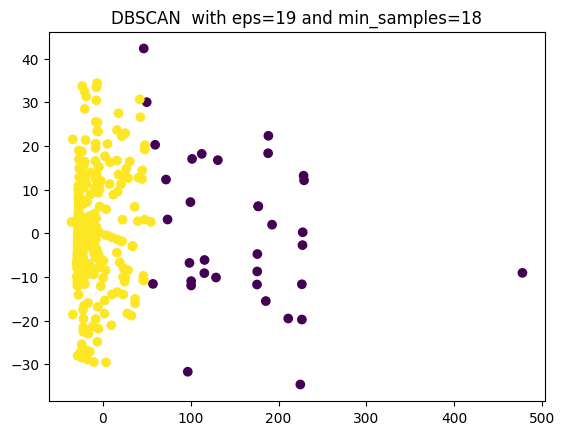

Silhouette Score for DBSCAN algorithm with 19 eps and 19 min samples: 0.805

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.571429  0.657143  0.771429  191.551551            0.0  \
 0  2.381201  29.060052  0.428198  0.357702   21.322944            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.628571    0.000000    0.371429  
 0    0.342037  0.657963    0.208877    0.120104    0.671018  


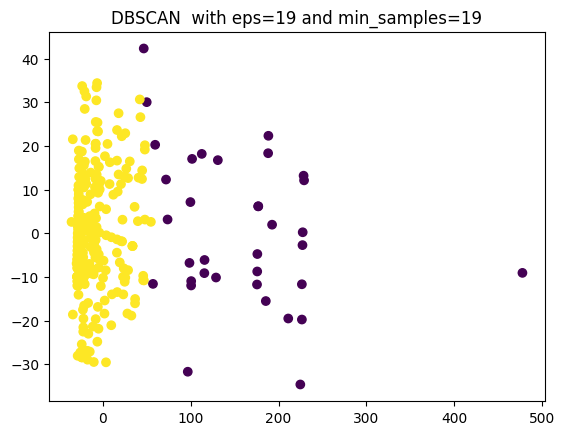

Silhouette Score for DBSCAN algorithm with 19 eps and 20 min samples: 0.805

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.571429  0.657143  0.771429  191.551551            0.0  \
 0  2.381201  29.060052  0.428198  0.357702   21.322944            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.628571    0.000000    0.371429  
 0    0.342037  0.657963    0.208877    0.120104    0.671018  


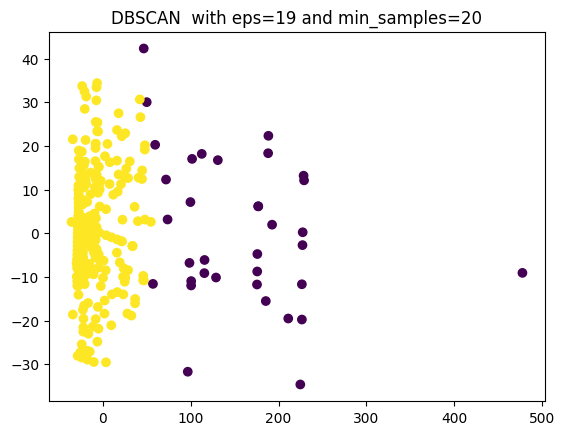

Silhouette Score for DBSCAN algorithm with 20 eps and 9 min samples: 0.826

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  40.862069  0.689655  0.827586  211.723138            0.0  \
 0  2.359897  29.395887  0.429306  0.359897   22.444784            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.655172    0.000000    0.344828  
 0    0.347044  0.652956    0.213368    0.118252    0.668380  


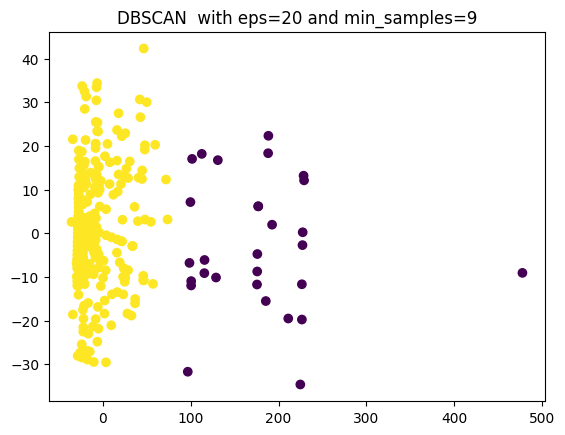

Silhouette Score for DBSCAN algorithm with 20 eps and 10 min samples: 0.826

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  40.862069  0.689655  0.827586  211.723138            0.0  \
 0  2.359897  29.395887  0.429306  0.359897   22.444784            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.655172    0.000000    0.344828  
 0    0.347044  0.652956    0.213368    0.118252    0.668380  


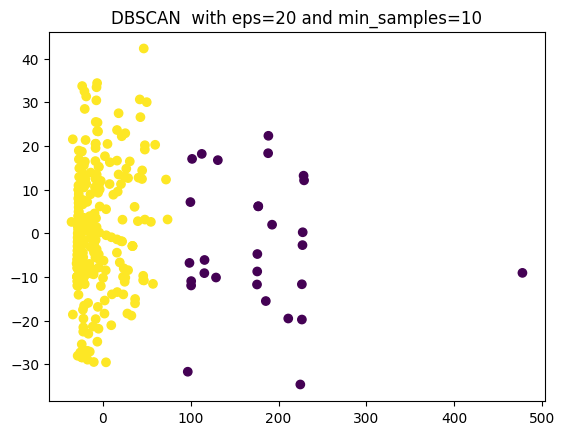

Silhouette Score for DBSCAN algorithm with 20 eps and 11 min samples: 0.826

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  40.862069  0.689655  0.827586  211.723138            0.0  \
 0  2.359897  29.395887  0.429306  0.359897   22.444784            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.655172    0.000000    0.344828  
 0    0.347044  0.652956    0.213368    0.118252    0.668380  


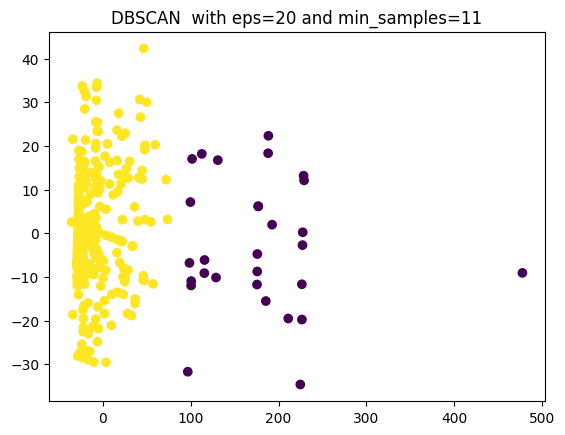

Silhouette Score for DBSCAN algorithm with 20 eps and 12 min samples: 0.826

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  40.862069  0.689655  0.827586  211.723138            0.0  \
 0  2.359897  29.395887  0.429306  0.359897   22.444784            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.655172    0.000000    0.344828  
 0    0.347044  0.652956    0.213368    0.118252    0.668380  


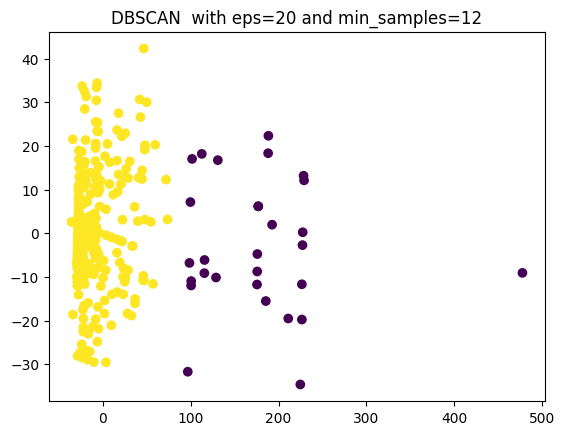

Silhouette Score for DBSCAN algorithm with 20 eps and 13 min samples: 0.826

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  40.862069  0.689655  0.827586  211.723138            0.0  \
 0  2.359897  29.395887  0.429306  0.359897   22.444784            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.655172    0.000000    0.344828  
 0    0.347044  0.652956    0.213368    0.118252    0.668380  


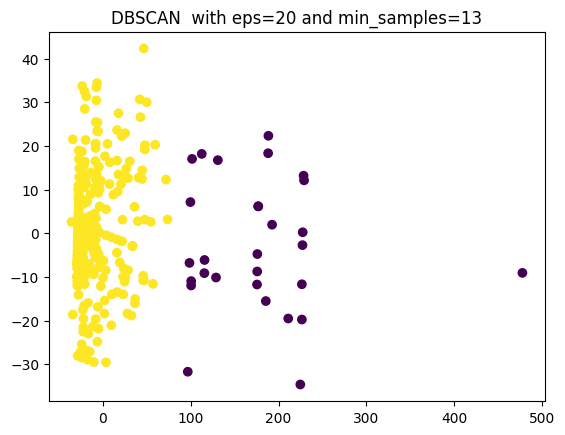

Silhouette Score for DBSCAN algorithm with 20 eps and 14 min samples: 0.821

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.033333  0.700000  0.800000  207.294033            0.0  \
 0  2.363402  29.275773  0.427835  0.360825   22.299409            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.633333    0.000000    0.366667  
 0    0.345361  0.654639    0.213918    0.118557    0.667526  


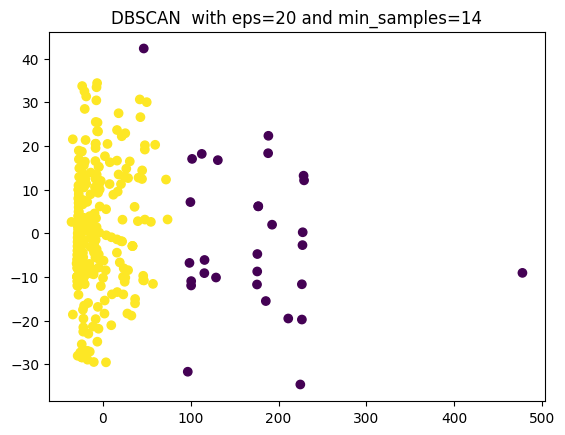

Silhouette Score for DBSCAN algorithm with 20 eps and 15 min samples: 0.821

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.033333  0.700000  0.800000  207.294033            0.0  \
 0  2.363402  29.275773  0.427835  0.360825   22.299409            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.633333    0.000000    0.366667  
 0    0.345361  0.654639    0.213918    0.118557    0.667526  


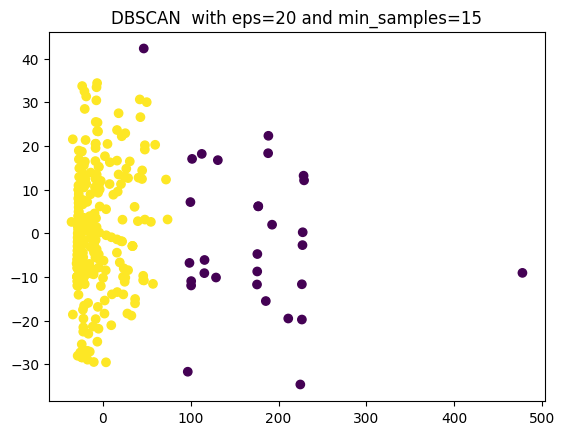

Silhouette Score for DBSCAN algorithm with 20 eps and 16 min samples: 0.821

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.033333  0.700000  0.800000  207.294033            0.0  \
 0  2.363402  29.275773  0.427835  0.360825   22.299409            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.633333    0.000000    0.366667  
 0    0.345361  0.654639    0.213918    0.118557    0.667526  


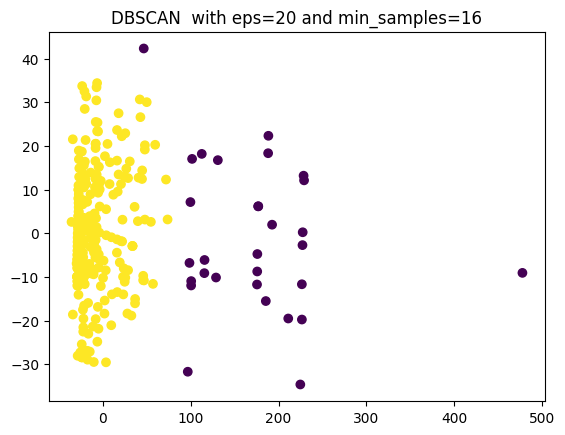

Silhouette Score for DBSCAN algorithm with 20 eps and 17 min samples: 0.812

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  41.545455  0.666667  0.727273  197.807455            0.0  \
 0  2.374026  29.218182  0.428571  0.363636   21.671028            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.606061  0.393939    0.636364    0.000000    0.363636  
 0    0.342857  0.657143    0.210390    0.119481    0.670130  


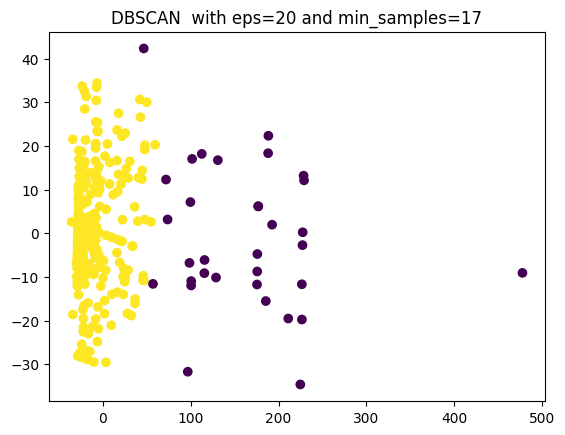

Silhouette Score for DBSCAN algorithm with 20 eps and 18 min samples: 0.809

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  41.941176  0.676471  0.735294  194.739588            0.0  \
 0  2.377604  29.151042  0.427083  0.361979   21.483973            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.588235  0.411765    0.617647    0.000000    0.382353  
 0    0.343750  0.656250    0.210938    0.119792    0.669271  


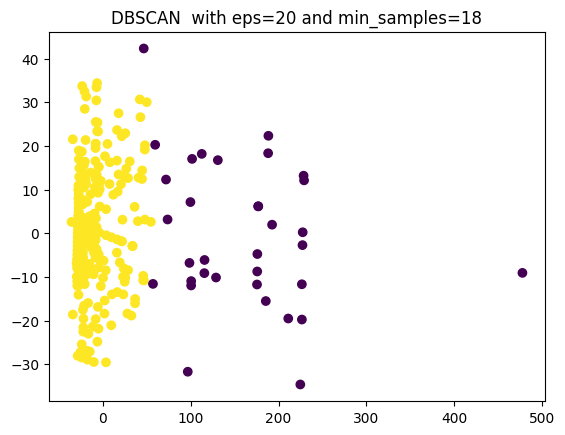

Silhouette Score for DBSCAN algorithm with 20 eps and 19 min samples: 0.809

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  41.941176  0.676471  0.735294  194.739588            0.0  \
 0  2.377604  29.151042  0.427083  0.361979   21.483973            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.588235  0.411765    0.617647    0.000000    0.382353  
 0    0.343750  0.656250    0.210938    0.119792    0.669271  


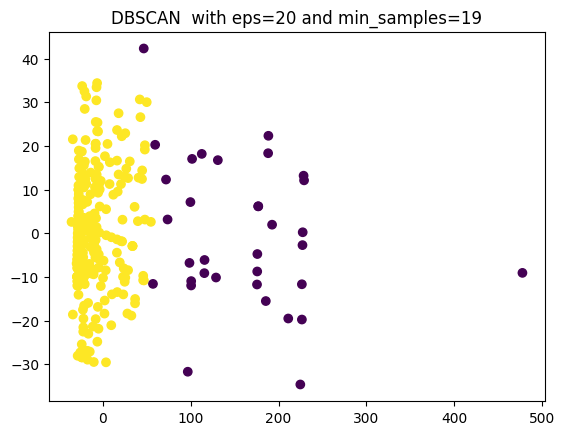

Silhouette Score for DBSCAN algorithm with 20 eps and 20 min samples: 0.809

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  41.941176  0.676471  0.735294  194.739588            0.0  \
 0  2.377604  29.151042  0.427083  0.361979   21.483973            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.588235  0.411765    0.617647    0.000000    0.382353  
 0    0.343750  0.656250    0.210938    0.119792    0.669271  


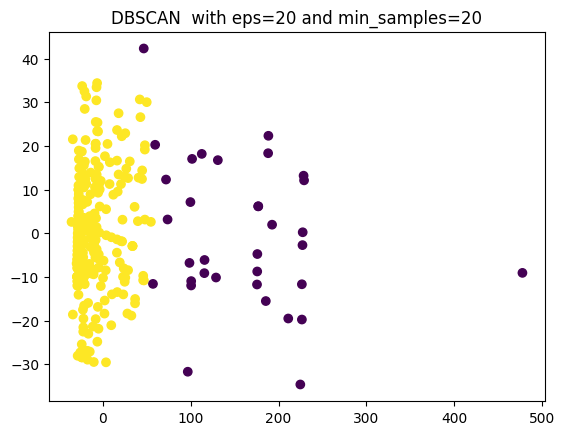

Silhouette Score for DBSCAN algorithm with 21 eps and 9 min samples: 0.826

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  40.862069  0.689655  0.827586  211.723138            0.0  \
 0  2.359897  29.395887  0.429306  0.359897   22.444784            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.655172    0.000000    0.344828  
 0    0.347044  0.652956    0.213368    0.118252    0.668380  


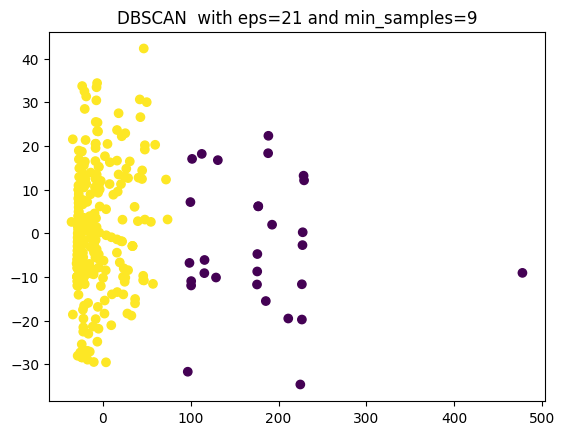

Silhouette Score for DBSCAN algorithm with 21 eps and 10 min samples: 0.826

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  40.862069  0.689655  0.827586  211.723138            0.0  \
 0  2.359897  29.395887  0.429306  0.359897   22.444784            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.655172    0.000000    0.344828  
 0    0.347044  0.652956    0.213368    0.118252    0.668380  


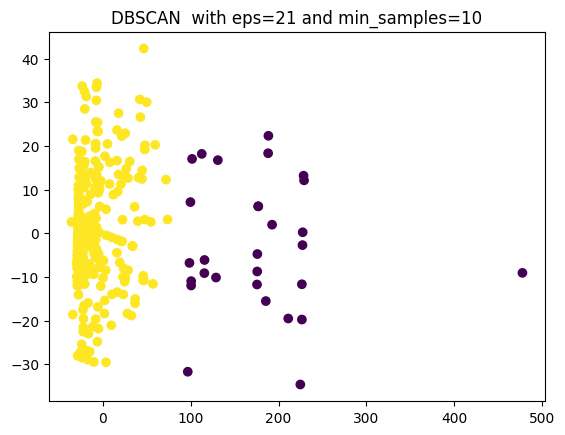

Silhouette Score for DBSCAN algorithm with 21 eps and 11 min samples: 0.826

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  40.862069  0.689655  0.827586  211.723138            0.0  \
 0  2.359897  29.395887  0.429306  0.359897   22.444784            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.655172    0.000000    0.344828  
 0    0.347044  0.652956    0.213368    0.118252    0.668380  


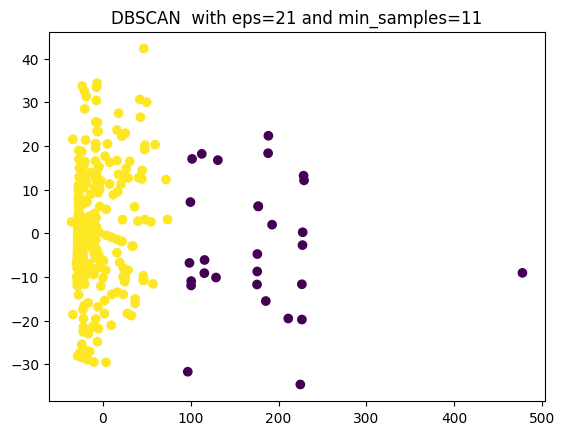

Silhouette Score for DBSCAN algorithm with 21 eps and 12 min samples: 0.826

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  40.862069  0.689655  0.827586  211.723138            0.0  \
 0  2.359897  29.395887  0.429306  0.359897   22.444784            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.655172    0.000000    0.344828  
 0    0.347044  0.652956    0.213368    0.118252    0.668380  


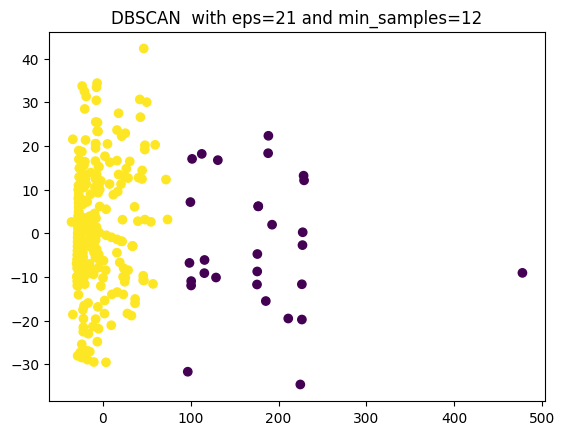

Silhouette Score for DBSCAN algorithm with 21 eps and 13 min samples: 0.826

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  40.862069  0.689655  0.827586  211.723138            0.0  \
 0  2.359897  29.395887  0.429306  0.359897   22.444784            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.655172    0.000000    0.344828  
 0    0.347044  0.652956    0.213368    0.118252    0.668380  


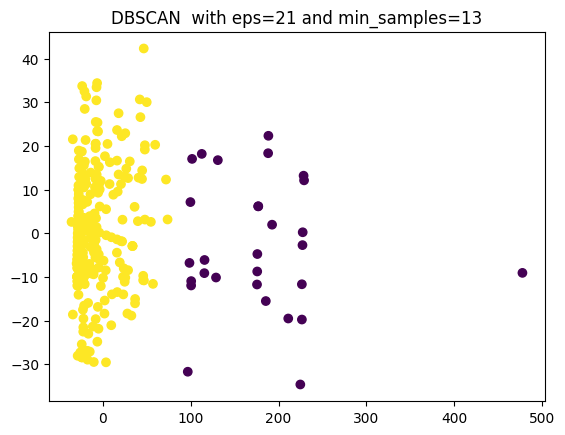

Silhouette Score for DBSCAN algorithm with 21 eps and 14 min samples: 0.826

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  40.862069  0.689655  0.827586  211.723138            0.0  \
 0  2.359897  29.395887  0.429306  0.359897   22.444784            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.655172    0.000000    0.344828  
 0    0.347044  0.652956    0.213368    0.118252    0.668380  


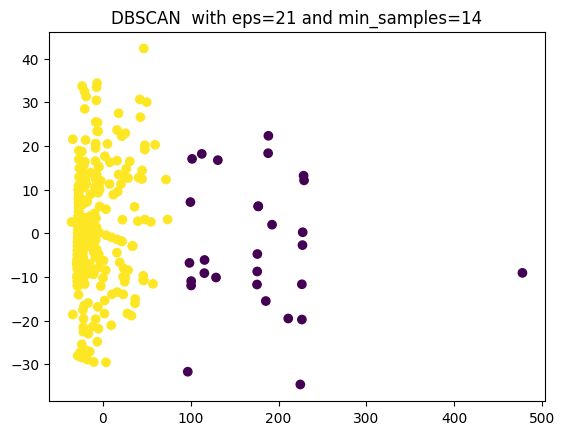

Silhouette Score for DBSCAN algorithm with 21 eps and 15 min samples: 0.821

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.033333  0.700000  0.800000  207.294033            0.0  \
 0  2.363402  29.275773  0.427835  0.360825   22.299409            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.633333    0.000000    0.366667  
 0    0.345361  0.654639    0.213918    0.118557    0.667526  


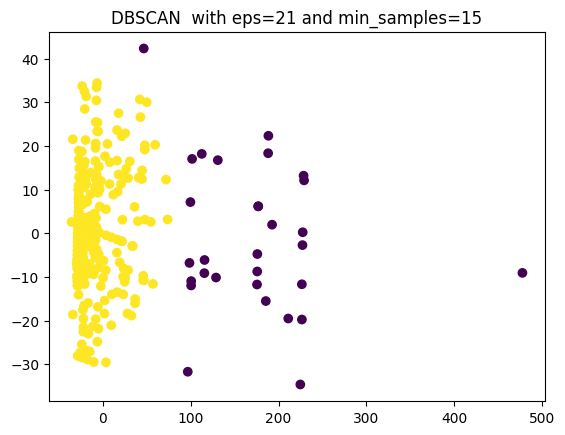

Silhouette Score for DBSCAN algorithm with 21 eps and 16 min samples: 0.821

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.033333  0.700000  0.800000  207.294033            0.0  \
 0  2.363402  29.275773  0.427835  0.360825   22.299409            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.600000  0.400000    0.633333    0.000000    0.366667  
 0    0.345361  0.654639    0.213918    0.118557    0.667526  


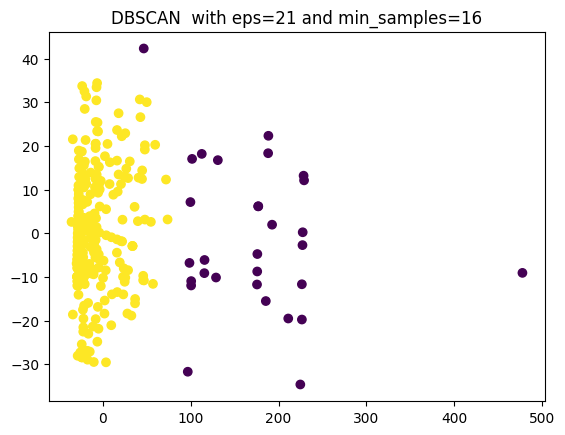

Silhouette Score for DBSCAN algorithm with 21 eps and 17 min samples: 0.816

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.125000  0.687500  0.750000  201.067062            0.0  \
 0  2.370466  29.202073  0.427461  0.362694   21.857113            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.625000  0.375000    0.656250    0.000000    0.343750  
 0    0.341969  0.658031    0.209845    0.119171    0.670984  


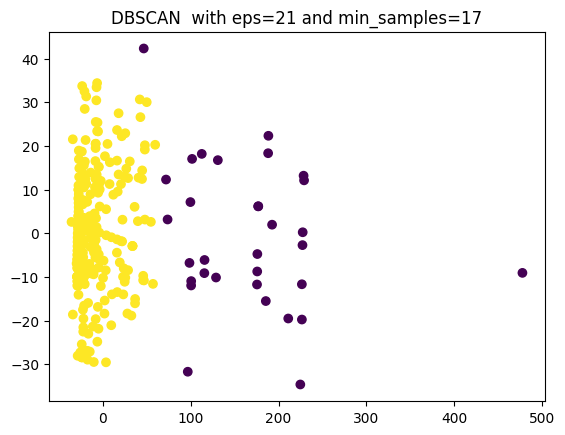

Silhouette Score for DBSCAN algorithm with 21 eps and 18 min samples: 0.816

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.125000  0.687500  0.750000  201.067062            0.0  \
 0  2.370466  29.202073  0.427461  0.362694   21.857113            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.625000  0.375000    0.656250    0.000000    0.343750  
 0    0.341969  0.658031    0.209845    0.119171    0.670984  


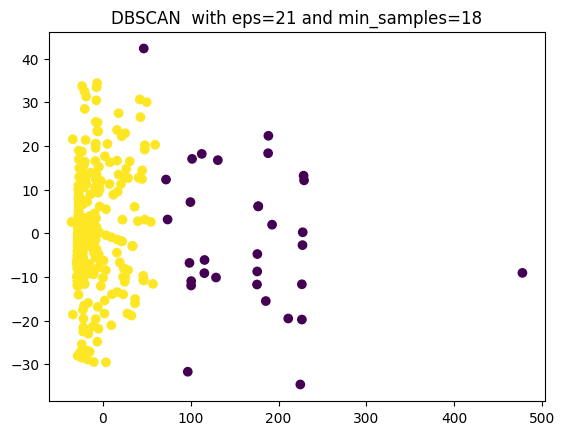

Silhouette Score for DBSCAN algorithm with 21 eps and 19 min samples: 0.816

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.125000  0.687500  0.750000  201.067062            0.0  \
 0  2.370466  29.202073  0.427461  0.362694   21.857113            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.625000  0.375000    0.656250    0.000000    0.343750  
 0    0.341969  0.658031    0.209845    0.119171    0.670984  


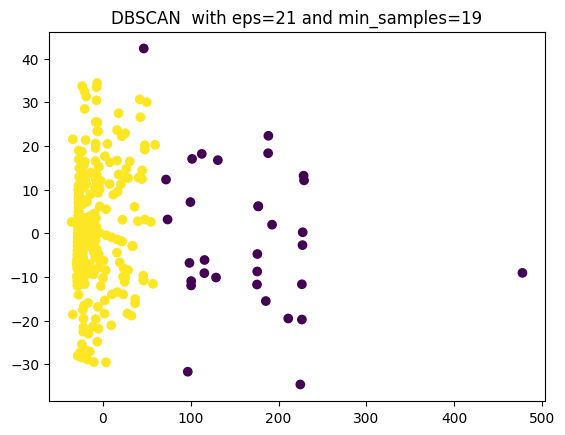

Silhouette Score for DBSCAN algorithm with 21 eps and 20 min samples: 0.816

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  42.125000  0.687500  0.750000  201.067062            0.0  \
 0  2.370466  29.202073  0.427461  0.362694   21.857113            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.625000  0.375000    0.656250    0.000000    0.343750  
 0    0.341969  0.658031    0.209845    0.119171    0.670984  


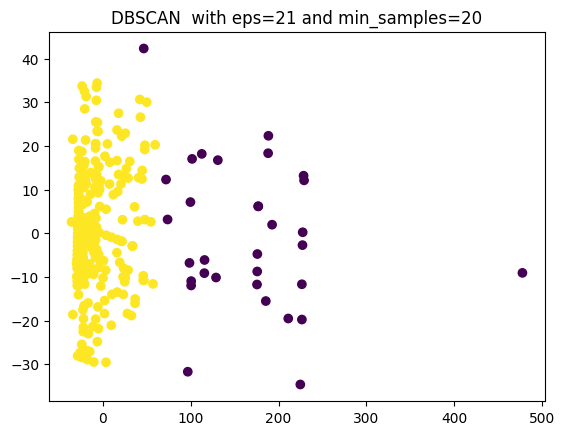

In [46]:
for eps in range(18, 22):
    for min_s in range (9, 21):
        labels = cluster_data(test_data, algorithm='DBSCAN', eps=eps, min_s=min_s)
        plt.scatter(test_pca[:, 0], test_pca[:, 1], c=labels)
        plt.title(f"DBSCAN  with eps={eps} and min_samples={min_s}")
        plt.show()

In [47]:
for eps in range(18, 22):
    for min_s in range (9, 21):
        labels = cluster_data(test_data, algorithm='DBSCAN', eps=eps, min_s=min_s)

Silhouette Score for DBSCAN algorithm with 18 eps and 9 min samples: 0.821

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  41.032258  0.677419  0.774194  205.009548            0.0  \
 0  2.366925  29.322997  0.428941  0.361757   22.004382            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.612903  0.387097    0.677419    0.000000    0.322581  
 0    0.343669  0.656331    0.209302    0.118863    0.671835  
Silhouette Score for DBSCAN algorithm with 18 eps and 10 min samples: 0.821

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  41.032258  0.677419  0.774194  205.009548            0.0  \
 0  2.366925  29.322997  0.428941  0.361757   22.004382            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.612903  0.387097    0.677419    0.000000    0.322581  
 0    0.343669  0.656331    0.209302  

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  40.862069  0.689655  0.827586  211.723138            0.0  \
 0  2.359897  29.395887  0.429306  0.359897   22.444784            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.655172    0.000000    0.344828  
 0    0.347044  0.652956    0.213368    0.118252    0.668380  
Silhouette Score for DBSCAN algorithm with 20 eps and 13 min samples: 0.826

Clusters grouping data
       Pclass        Age     SibSp     Parch        Fare  Cabin_unknown   
-1  1.000000  40.862069  0.689655  0.827586  211.723138            0.0  \
 0  2.359897  29.395887  0.429306  0.359897   22.444784            0.0   

    Sex_female  Sex_male  Embarked_C  Embarked_Q  Embarked_S  
-1    0.586207  0.413793    0.655172    0.000000    0.344828  
 0    0.347044  0.652956    0.213368    0.118252    0.668380  
Silhouette Score for DBSCAN algorithm with 20 eps a

найкращий результат -- 0,826, який зустрічається не один раз починаючи з 20 eps and 9 min samples

Отже, найкращий результат дав агломеративний алгоритм -- 0,835. Це значення було отримано при двох кластерах, що робить його оптимальним параметром. Для DBSCAN найкращі результати знаходяться при парамтрах в районі eps=20 min_samples=9